In [1]:
# Import core libraries for data manipulation and numerical operations
import numpy as np
import pandas as pd
import time

# Import libraries for data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Import statistical and preprocessing functions
from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

# Import scikit-learn utilities for metrics and model evaluation
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import average_precision_score, precision_recall_curve

# Import data preprocessing tools
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer

# Import tools for model selection and cross-validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Import machine learning models
from sklearn.linear_model import Ridge, Lasso, LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier

# Import XGBoost model and utilities
import xgboost as xgb
from xgboost import XGBClassifier, plot_importance

# Install scikit-optimize if not already installed (for Bayesian optimization)
!pip install scikit-optimize

# Import Bayesian optimization search
from skopt import BayesSearchCV

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 4.0 MB/s eta 0:00:00


## EDA and Data Preparation


In [2]:
# Load the credit card transactions dataset from a local CSV file
df_credit = pd.read_csv('creditcard.csv')

# Display the first five rows to preview the data structure and contents
df_credit.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0


In [3]:
# Check the number of rows and columns in the dataset
df_credit.shape

(105067, 31)

In [4]:
# Display summary statistics for all numerical features in the dataset
df_credit.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,105067.000000,...,105067.000000,105067.000000,105067.000000,105066.000000,105066.000000,105066.000000,105066.000000,105066.000000,105066.000000,105066.000000
mean,43680.301455,-0.258318,-0.029705,0.683599,0.156974,-0.283527,0.098924,-0.116800,0.057275,-0.050479,...,-0.029851,-0.105483,-0.037181,0.009834,0.133576,0.026062,0.001671,0.001795,96.626111,0.002208
std,17527.890732,1.851801,1.650087,1.319498,1.345212,1.351589,1.301365,1.214204,1.236547,1.112787,...,0.744325,0.639981,0.626223,0.595669,0.440315,0.491947,0.392645,0.321359,262.315215,0.046939
min,0.000000,-56.407510,-72.715728,-33.680984,-5.172595,-42.147898,-26.160506,-31.764946,-73.216718,-9.283925,...,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.534330,-9.390980,-9.617915,0.000000,0.000000
25%,33975.500000,-1.024715,-0.598212,0.178273,-0.714182,-0.907139,-0.644227,-0.606695,-0.135125,-0.696261,...,-0.223703,-0.531229,-0.177131,-0.323208,-0.130802,-0.323481,-0.061425,-0.005146,7.160000,0.000000
50%,45510.000000,-0.260627,0.075873,0.759148,0.184867,-0.318318,-0.153233,-0.072970,0.077001,-0.118121,...,-0.056348,-0.081414,-0.049651,0.065708,0.172075,-0.069141,0.010581,0.023346,25.500000,0.000000
75%,57712.000000,1.154766,0.735425,1.385199,1.026157,0.245212,0.494042,0.409551,0.368539,0.549453,...,0.121112,0.315794,0.080780,0.407051,0.421563,0.295664,0.084462,0.076727,87.540000,0.000000
max,69350.000000,1.960497,18.902453,4.226108,16.715537,34.801666,22.529298,36.677268,20.007208,10.392889,...,27.202839,10.503090,19.002942,4.016342,5.541598,3.517346,12.152401,33.847808,19656.530000,1.000000


In [5]:
# Display the dataset's structure, including data types and missing values
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105067 entries, 0 to 105066
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    105067 non-null  int64  
 1   V1      105067 non-null  float64
 2   V2      105067 non-null  float64
 3   V3      105067 non-null  float64
 4   V4      105067 non-null  float64
 5   V5      105067 non-null  float64
 6   V6      105067 non-null  float64
 7   V7      105067 non-null  float64
 8   V8      105067 non-null  float64
 9   V9      105067 non-null  float64
 10  V10     105067 non-null  float64
 11  V11     105067 non-null  float64
 12  V12     105067 non-null  float64
 13  V13     105067 non-null  float64
 14  V14     105067 non-null  float64
 15  V15     105067 non-null  float64
 16  V16     105067 non-null  float64
 17  V17     105067 non-null  float64
 18  V18     105067 non-null  float64
 19  V19     105067 non-null  float64
 20  V20     105067 non-null  float64
 21  V21     10

In [6]:
# Count the number of fraudulent and non-fraudulent transactions in the dataset
df_credit['Class'].value_counts()

,count
Class,
0.0,104834
1.0,232


In [7]:
# Calculate and display the percentage of fraudulent and non-fraudulent transactions
(df_credit.groupby('Class')['Class'].count() / df_credit['Class'].count()) * 100

,Class
Class,
0.0,99.779186
1.0,0.220814


In [8]:
# Check for missing values in each column of the dataset
df_credit.isnull().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


In [9]:
# Display the data type of each feature in the dataset
df_credit.dtypes

,0
Time,int64
V1,float64
V2,float64
V3,float64
V4,float64
V5,float64
V6,float64
V7,float64
V8,float64
V9,float64


In [10]:
# Compute the correlation matrix to examine relationships between features
cor = df_credit.corr()
cor

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,-0.007635,-0.049914,-0.025322,-0.028325,-0.043794,-0.002481,-0.005518,0.017324,-0.243618,...,0.005257,0.019074,0.002519,0.001127,0.009337,-0.001363,-0.011056,-0.006126,0.029383,-0.015517
V1,-0.007635,1.000000,0.053882,0.218462,-0.064047,0.016786,0.064789,0.080597,-0.003280,-0.054596,...,-0.027787,-0.051460,-0.082609,-0.011935,0.193325,0.019805,-0.023742,0.144374,-0.253102,-0.149378
V2,-0.049914,0.053882,1.000000,-0.085298,0.045950,-0.044649,0.018464,-0.028682,0.009004,-0.007484,...,-0.011448,-0.030166,0.004870,-0.023619,-0.093280,-0.026401,0.001525,0.016847,-0.554849,0.122870
V3,-0.025322,0.218462,-0.085298,1.000000,-0.088750,0.198981,-0.067159,0.193475,-0.122843,0.119764,...,0.023978,0.247617,0.042298,0.026142,-0.186750,0.041671,-0.070924,0.031044,-0.232503,-0.304257
V4,-0.028325,-0.064047,0.045950,-0.088750,1.000000,-0.003455,-0.043479,-0.020292,0.041204,0.041699,...,0.020959,0.030446,-0.006146,0.000250,-0.002867,-0.022621,0.043777,-0.003811,0.096413,0.162371
V5,-0.043794,0.016786,-0.044649,0.198981,-0.003455,1.000000,0.036201,-0.044035,-0.019673,0.038193,...,-0.054929,-0.085210,0.016906,-0.016045,-0.010240,-0.044089,-0.026039,0.001777,-0.401975,-0.141525
V6,-0.002481,0.064789,0.018464,-0.067159,-0.043479,0.036201,1.000000,0.060032,-0.047868,0.043268,...,0.020603,0.044353,-0.017617,-0.001100,0.049391,0.002862,-0.007762,-0.012057,0.209505,-0.060185
V7,-0.005518,0.080597,-0.028682,0.193475,-0.020292,-0.044035,0.060032,1.000000,-0.000914,0.043822,...,-0.012487,-0.038479,0.071345,0.001635,-0.094996,-0.032460,-0.093840,-0.046735,0.387038,-0.247538
V8,0.017324,-0.003280,0.009004,-0.122843,0.041204,-0.019673,-0.047868,-0.000914,1.000000,-0.026987,...,-0.002879,0.043398,-0.025825,0.003384,0.015171,0.006807,0.004129,0.022291,-0.095737,0.060227
V9,-0.243618,-0.054596,-0.007484,0.119764,0.041699,0.038193,0.043268,0.043822,-0.026987,1.000000,...,0.000609,0.040068,-0.049273,0.012328,0.119109,0.109277,-0.032090,-0.025967,-0.020162,-0.115765


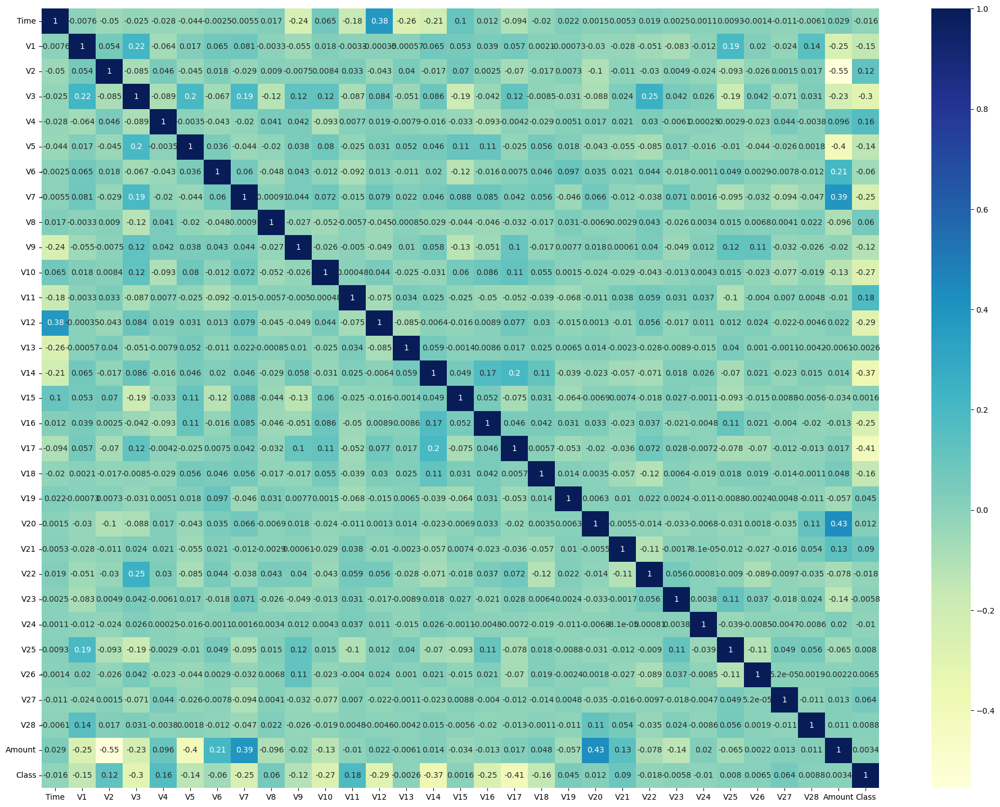

In [11]:
# Set the figure size for better visibility of the heatmap
plt.figure(figsize=(24, 18))

# Plot the correlation matrix as a heatmap for visual analysis
sns.heatmap(cor, cmap="YlGnBu", annot=True)

# Display the plot
plt.show()

Here we will observe the distribution of our classes


In [12]:
# Count the number of normal and fraudulent transactions
classes = df_credit['Class'].value_counts()

# Calculate the percentage of normal transactions
normal_share = classes[0] / df_credit['Class'].count() * 100

# Calculate the percentage of fraudulent transactions
fraud_share = classes[1] / df_credit['Class'].count() * 100

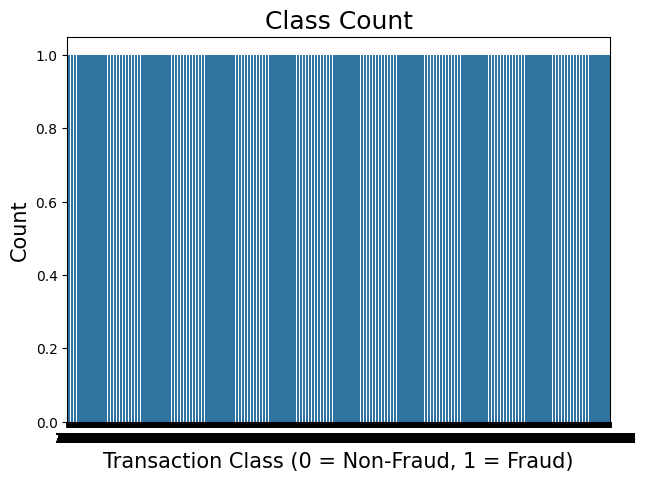

In [13]:
# Create a bar plot to visualize the number of fraudulent and non-fraudulent transactions
plt.figure(figsize=(7, 5))
sns.countplot(df_credit['Class'])
plt.title("Class Count", fontsize=18)
plt.xlabel("Transaction Class (0 = Non-Fraud, 1 = Fraud)", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.show()

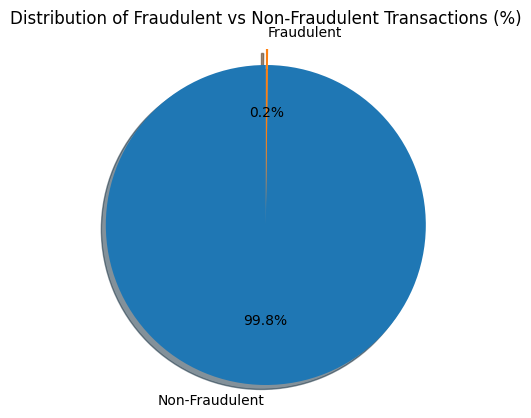

In [14]:
# Calculate the percentage share of non-fraudulent and fraudulent transactions
classes = df_credit['Class'].value_counts()
normal_share = classes[0] / df_credit['Class'].count() * 100
fraud_share = classes[1] / df_credit['Class'].count() * 100

# Labels and sizes for the pie chart
labels = ['Non-Fraudulent', 'Fraudulent']
sizes = [normal_share, fraud_share]
explode = (0, 0.1)  # Emphasize the 'Fraudulent' slice

# Create a pie chart to visualize the class distribution in percentages
fig1, ax1 = plt.subplots()
ax1.pie(
    sizes,
    explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    shadow=True,
    startangle=90
)
ax1.axis('equal')  # Draw the pie chart as a circle

plt.title('Distribution of Fraudulent vs Non-Fraudulent Transactions (%)')
plt.show()

In [15]:
# Print the percentage of non-fraudulent transactions in the dataset
print('The percentage of non-fraudulent transactions is',
      round(df_credit['Class'].value_counts()[0] / len(df_credit) * 100, 2), '% of the dataset')

# Print the percentage of fraudulent transactions in the dataset
print('The percentage of fraudulent transactions is',
      round(df_credit['Class'].value_counts()[1] / len(df_credit) * 100, 2), '% of the dataset')

# Print the ratio of fraudulent to non-fraudulent transactions to show class imbalance
print('The ratio of fraud to non-fraud is',
      round(df_credit['Class'].value_counts()[1] / df_credit['Class'].value_counts()[0] * 100, 2), '%')

The percentage of non-fraudulent transactions is 99.78 % of the dataset
The percentage of fraudulent transactions is 0.22 % of the dataset
The ratio of fraud to non-fraud is 0.22 %


### So we have 492 fraudalent transactions out of 284807 total credit card transactions.

Target variable distribution shows that we are dealing with an highly imbalanced problem as there are many more genuine transactions class as compared to the fraudalent transactions. The model would achieve high accuracy as it would mostly predict majority class — transactions which are genuine in our example.
To overcome this we will use other metrics for model evaluation such as ROC-AUC , precision and recall etc


In [16]:
# Create a copy of the dataset for feature engineering
df = df_credit.copy()

# Convert the 'Time' column (in seconds) to Pandas Timedelta for easier manipulation
Delta_Time = pd.to_timedelta(df['Time'], unit='s')

# Extract day, hour, and minute components from the 'Time' feature
df['Time_Day'] = Delta_Time.dt.components.days.astype(int)
df['Time_Hour'] = Delta_Time.dt.components.hours.astype(int)
df['Time_Min'] = Delta_Time.dt.components.minutes.astype(int)

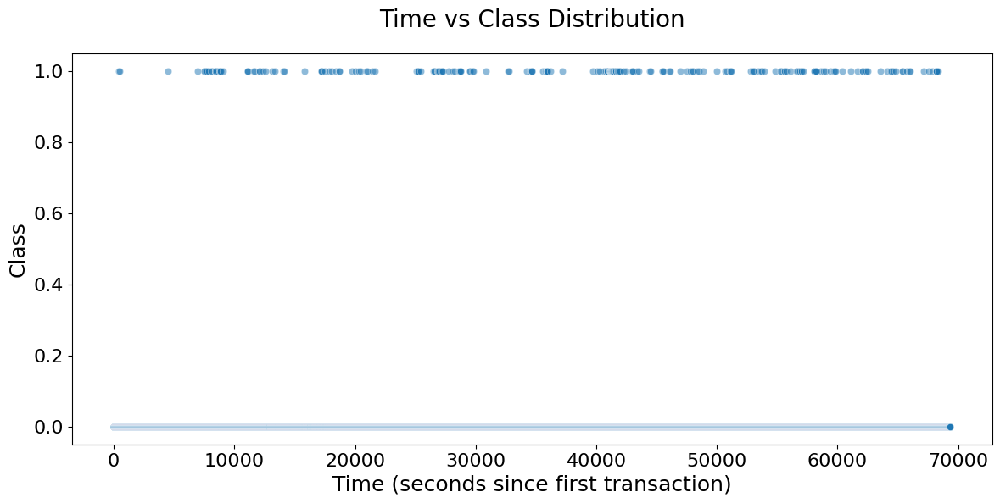

In [17]:
# Bivariate Analysis: Scatter plot to observe how 'Class' is distributed over 'Time'

# Set up the figure size for the plot
fig = plt.figure(figsize=(14, 6))

# Choose a color palette for the plot
cmap = sns.color_palette('Set2')

# Create a scatter plot of transaction time vs. class label
sns.scatterplot(x=df['Time'], y=df['Class'], palette=cmap, alpha=0.5)
plt.xlabel('Time (seconds since first transaction)', fontsize=18)
plt.ylabel('Class', fontsize=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16)
plt.title('Time vs Class Distribution', fontsize=20, y=1.05)

plt.show()

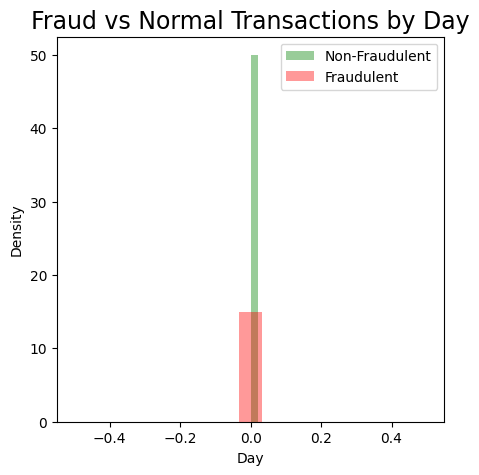

In [18]:
# Plot the distribution of fraud and normal transactions by day

plt.figure(figsize=(5, 5))

# Distribution for normal (non-fraud) transactions
sns.distplot(df[df['Class'] == 0]["Time_Day"], color='green', label='Non-Fraudulent')

# Distribution for fraud transactions
sns.distplot(df[df['Class'] == 1]["Time_Day"], color='red', label='Fraudulent')

plt.title('Fraud vs Normal Transactions by Day', fontsize=17)
plt.xlabel('Day')
plt.ylabel('Density')
plt.legend()
plt.show()

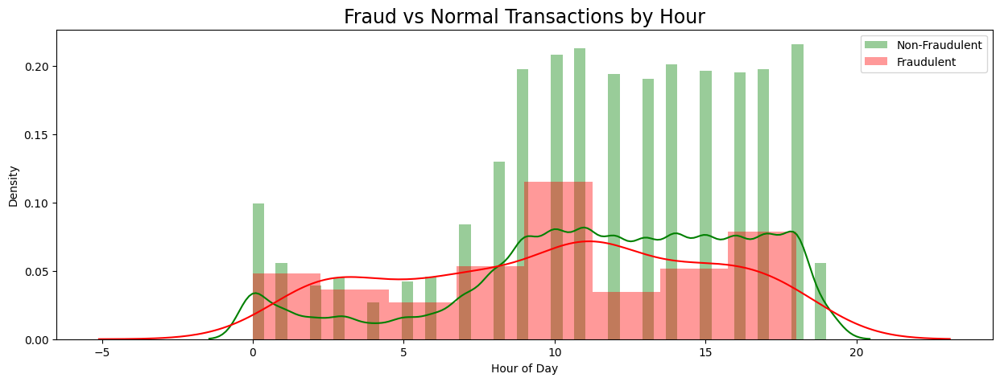

In [19]:
# Plot the distribution of fraud and normal transactions by hour

plt.figure(figsize=(15, 5))

# Distribution for normal (non-fraud) transactions by hour
sns.distplot(df[df['Class'] == 0]["Time_Hour"], color='green', label='Non-Fraudulent')

# Distribution for fraud transactions by hour
sns.distplot(df[df['Class'] == 1]["Time_Hour"], color='red', label='Fraudulent')

plt.title('Fraud vs Normal Transactions by Hour', fontsize=17)
plt.xlabel('Hour of Day')
plt.ylabel('Density')
plt.legend()
plt.show()

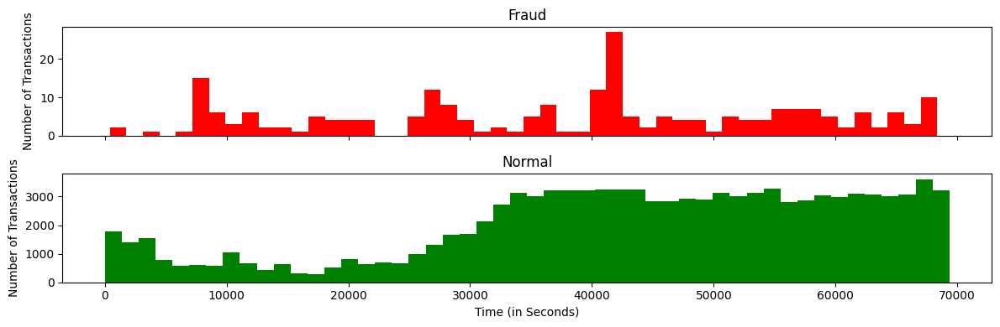

In [20]:
# Plot histograms of transaction times for fraudulent and normal transactions

# Set up a figure with two subplots sharing the x-axis
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 4))

bins = 50  # Number of bins for the histogram

# Histogram for fraudulent transactions
ax1.hist(df.Time[df.Class == 1], bins=bins, color='red')
ax1.set_title('Fraud')
ax1.set_ylabel('Number of Transactions')

# Histogram for normal (non-fraudulent) transactions
ax2.hist(df.Time[df.Class == 0], bins=bins, color='green')
ax2.set_title('Normal')
ax2.set_ylabel('Number of Transactions')

# Common x-axis label
plt.xlabel('Time (in Seconds)')

plt.tight_layout()
plt.show()

In [21]:
# Separate the dataset into fraudulent and non-fraudulent transactions
df_Fraud = df[df['Class'] == 1]
df_Regular = df[df['Class'] == 0]

# Display descriptive statistics for the 'Amount' feature in fraudulent transactions
print("Fraudulent Transaction Amount Statistics:")
print(df_Fraud["Amount"].describe())

Fraudulent Transaction Amount Statistics:
count     232.000000
mean      115.520474
std       253.721393
min         0.000000
25%         1.000000
50%         7.595000
75%        99.990000
max      1809.680000
Name: Amount, dtype: float64


In [22]:
# Display descriptive statistics for the 'Amount' feature in regular (non-fraudulent) transactions
print("Regular Transaction Amount Statistics:")
print(df_Regular["Amount"].describe())

Regular Transaction Amount Statistics:
count    104834.000000
mean         96.584297
std         262.333583
min           0.000000
25%           7.190000
50%          25.540000
75%          87.440000
max       19656.530000
Name: Amount, dtype: float64


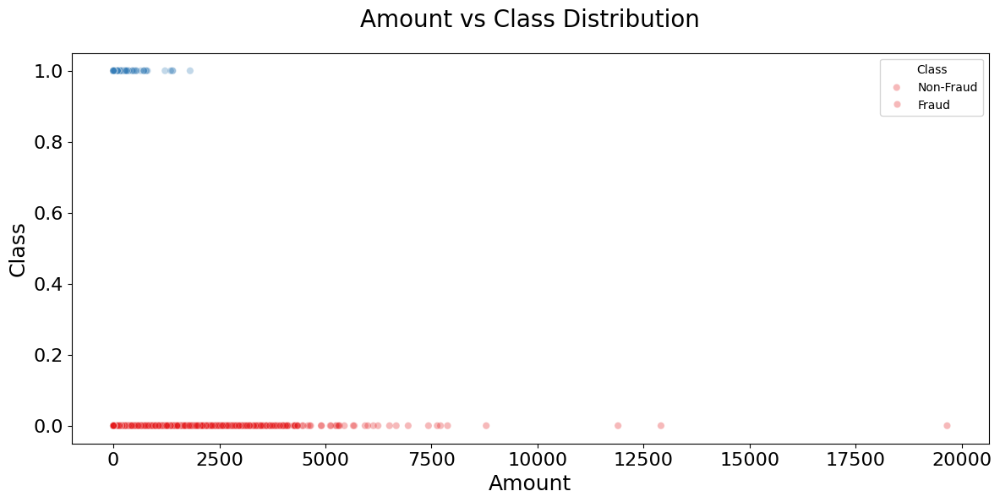

In [23]:
# Scatter plot to observe the distribution of classes with Amount

plt.figure(figsize=(14, 6))
sns.scatterplot(x='Amount', y='Class', hue='Class', palette='Set1', data=df, alpha=0.3)
plt.xlabel('Amount', fontsize=18)
plt.ylabel('Class', fontsize=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16)
plt.title('Amount vs Class Distribution', fontsize=20, y=1.05)
plt.legend(title='Class', labels=['Non-Fraud', 'Fraud'])
plt.show()

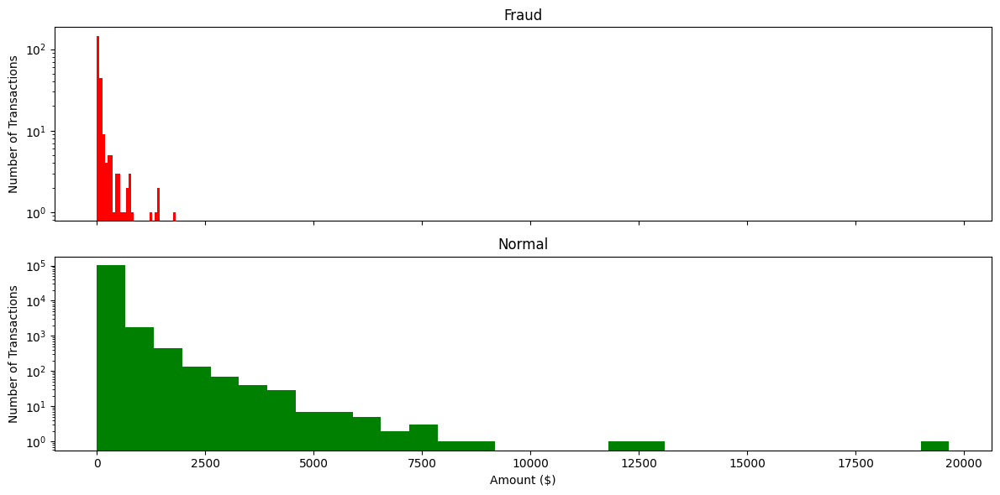

In [24]:
# Plot histograms of transaction amounts for fraudulent and normal transactions with a log scale

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 6))
bins = 30

# Fraudulent Transactions
ax1.hist(df.Amount[df.Class == 1], bins=bins, color='red')
ax1.set_title('Fraud')
ax1.set_ylabel('Number of Transactions')
ax1.set_yscale('log')

# Normal Transactions
ax2.hist(df.Amount[df.Class == 0], bins=bins, color='green')
ax2.set_title('Normal')
ax2.set_xlabel('Amount ($)')
ax2.set_ylabel('Number of Transactions')
ax2.set_yscale('log')

plt.tight_layout()
plt.show()

In [25]:
# Display the features most strongly correlated with the target variable 'Class'

print("Most important features relative to target variable Class")

# Calculate correlation of all features with 'Class'
corr_initial = df.corr()['Class']

# Convert the Series to a DataFrame for sorting and better display
corr_initial = pd.DataFrame(corr_initial)

# Rename the column for clarity
corr_initial.columns = ["Correlation"]

# Sort correlations in descending order to find the most important features
corr_initial2 = corr_initial.sort_values(by=['Correlation'], ascending=False)

# Display the top 5 features most positively correlated with 'Class'
corr_initial2.head(5)

Most important features relative to target variable Class


,Correlation
Class,1.000000
V11,0.182456
V4,0.162371
V2,0.122870
V21,0.089540


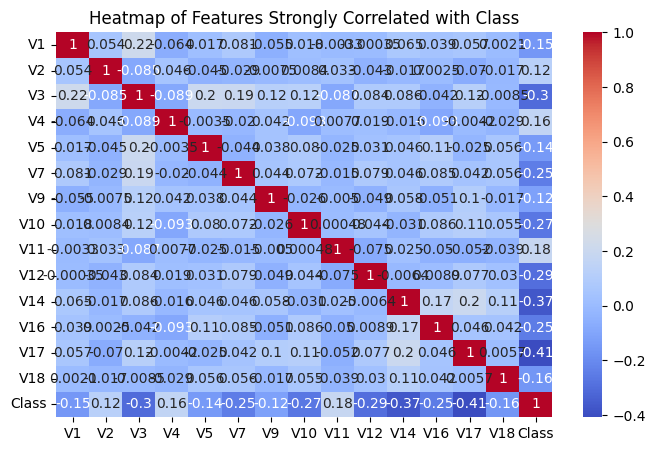

In [26]:
# Plot the heatmap for features with relatively strong correlation (>0.09) with the target variable

# Select features where the absolute correlation with 'Class' is greater than 0.09
top_feature = cor.index[abs(cor['Class']) > 0.09]

# Calculate correlation matrix for these features
top_corr = df[top_feature].corr()

# Plot heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(top_corr, annot=True, cmap='coolwarm')
plt.title('Heatmap of Features Strongly Correlated with Class')
plt.show()

### Plotting the distribution of a variable


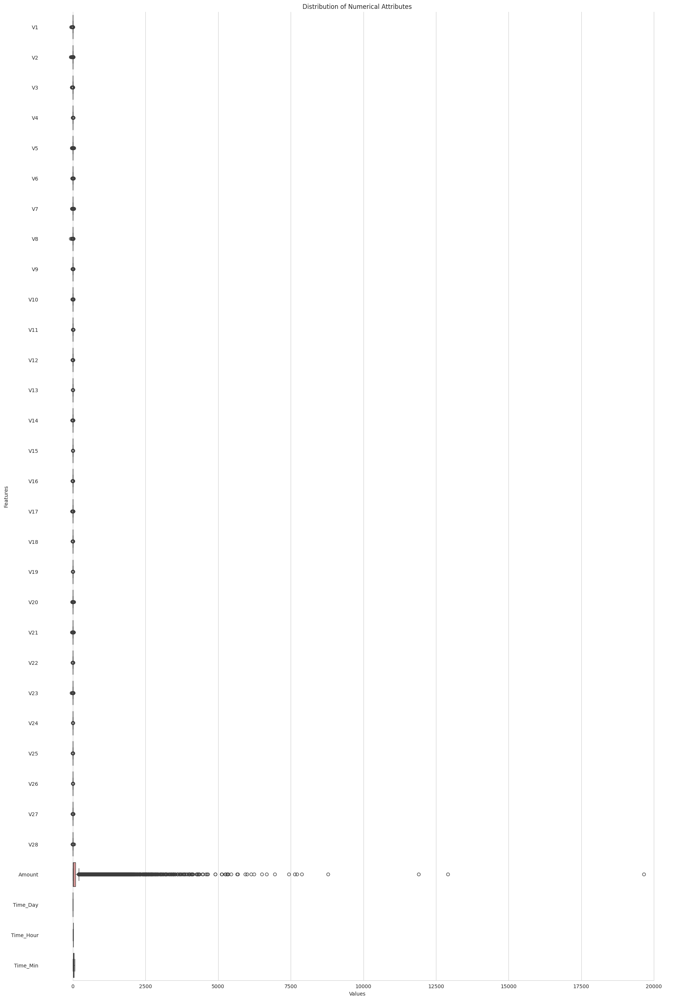

In [27]:
# Boxplot to understand the distribution of numerical attributes

import numpy as np

# Select only numerical features from the dataframe
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()

# Exclude binary target feature and 'Time' variable
li_not_plot = ['Class', 'Time']
li_transform_num_feats = [c for c in numeric_features if c not in li_not_plot]

# Set Seaborn style
sns.set_style("whitegrid")

# Create a figure for the boxplots
f, ax = plt.subplots(figsize=(22, 34))

# Draw horizontal boxplots for all selected numerical features
ax = sns.boxplot(data=df[li_transform_num_feats], orient="h", palette="Paired")
ax.set(ylabel="Features")
ax.set(xlabel="Values")
ax.set(title="Distribution of Numerical Attributes")

# Optional: remove the left spine for a cleaner look
sns.despine(trim=True, left=True)

plt.show()

In [28]:
# Drop unnecessary columns

# Drop the original 'Time' column since we have derived new features from it
df.drop('Time', axis=1, inplace=True)

# Drop 'Time_Day' and 'Time_Min' as they might not be useful for analysis
# (keeping only 'Time_Hour' as the relevant derived feature)
df.drop(['Time_Day', 'Time_Min'], axis=1, inplace=True)

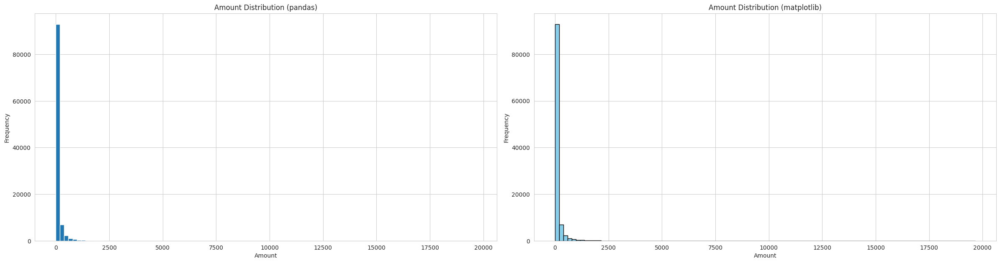

In [29]:
# Visualizing the distribution of the 'Amount' variable (not PCA-transformed)

plt.figure(figsize=(24, 12))

# Histogram using pandas plot
plt.subplot(2, 2, 1)
plt.title('Amount Distribution (pandas)')
df['Amount'].dropna().astype(int).plot.hist(bins=100)
plt.xlabel("Amount")
plt.ylabel("Frequency")

# Histogram using matplotlib
plt.subplot(2, 2, 2)
plt.title('Amount Distribution (matplotlib)')
plt.hist(df['Amount'].dropna(), bins=100, color='skyblue', edgecolor='black')
plt.xlabel("Amount")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

### Splitting the data into train & test data


In [30]:
# Create X (features) and y (target) datasets for modeling

y = df['Class']                  # Dependent variable (target)
X = df.drop(['Class'], axis=1)   # Independent variables (features)

In [31]:
X.head(10)           # First 10 rows
X[['Amount']].head() # Only the 'Amount' column

,Amount
0,149.62
1,2.69
2,378.66
3,123.50
4,69.99


In [32]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=100
)

##### Preserve X_test & y_test to evaluate on the test data once you build the model


In [33]:
# Print the total number of fraud cases in the whole dataset, training set, and test set

print("Total fraud cases in full dataset:", np.sum(y))
print("Total fraud cases in training set:", np.sum(y_train))
print("Total fraud cases in test set:", np.sum(y_test))

Total fraud cases in full dataset: 232.0
Total fraud cases in training set: 178.0
Total fraud cases in test set: 54.0


### Plotting the distribution of a variable


In [34]:
# Store all feature column names in a list
cols = list(X.columns.values)

In [35]:
# prints all the columns
cols

['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Time_Hour']

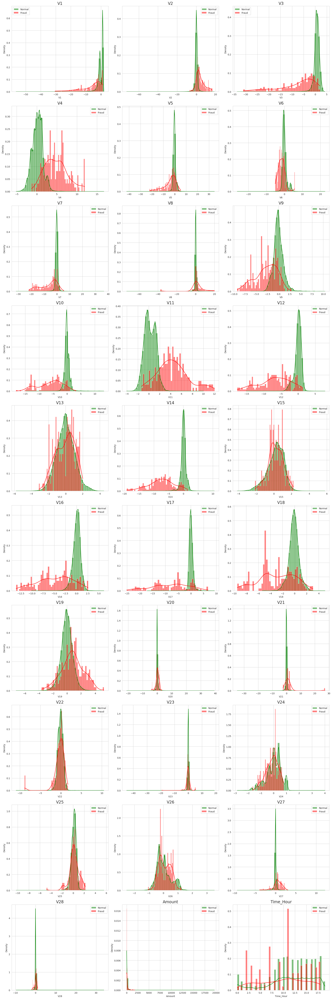

In [36]:
# Plot histograms of each feature to compare distributions (normal vs. fraud)
normal_records = df.Class == 0
fraud_records = df.Class == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10, 3, n+1)
    sns.histplot(X[col][normal_records], color='green', label='Normal', stat='density', bins=50, kde=True)
    sns.histplot(X[col][fraud_records], color='red', label='Fraud', stat='density', bins=50, kde=True)
    plt.title(col, fontsize=17)
    plt.legend()

plt.tight_layout()
plt.show()

#Create model functions for Logistic Regress, KNN, SVM, Decision Tree, Random Forest, XGBoost


In [37]:
# Create a dataframe to store model evaluation results
df_Results = pd.DataFrame(
    columns=['Data_Imbalance_Handiling', 'Model', 'Accuracy', 'roc_value', 'threshold']
)

In [38]:
def plot_confusion_matrix(y_true, y_pred):
    """
    Plots a labeled confusion matrix for binary classification results.

    Parameters:
    y_true: array-like
        True labels (ground truth).
    y_pred: array-like
        Predicted labels.
    """
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Create a new figure for the confusion matrix
    plt.figure(figsize=(5, 4))

    # Display the confusion matrix as an image with color mapping
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Accent)

    # Set class names for x and y axis labels
    class_names = ['Non-Fraudulent', 'Fraudulent']
    plt.title('Confusion Matrix - Test Data')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    # Set the tick marks and labels
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    # Labels for each cell in the matrix
    cell_labels = [['TN', 'FP'], ['FN', 'TP']]

    # Annotate each cell with the count and label
    for i in range(2):
        for j in range(2):
            plt.text(j, i, f'{cell_labels[i][j]} = {cm[i, j]}',
                     fontsize=12, ha='center', va='center')

    # Adjust layout to prevent label overlap
    plt.tight_layout()
    plt.show()

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn import metrics
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay

# Helper function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    """
    Plots the confusion matrix for classification results.
    """
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Accent')
    plt.show()

def build_and_run_logistic_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates Logistic Regression models (L1 and L2 regularization) using cross-validation.
    Appends results to the results DataFrame.
    """
    # Define grid of C values (inverse of regularization strength)
    num_C = list(np.power(10.0, np.arange(-10, 10)))
    # 10-fold cross-validation
    cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

    # Create pipeline for L2 regularization (Ridge)
    pipeline_l2 = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('logreg', LogisticRegressionCV(
            Cs=num_C, penalty='l2', scoring='roc_auc', cv=cv_num, random_state=42,
            max_iter=10000, fit_intercept=True, solver='newton-cg', tol=10))
    ])

    # Create pipeline for L1 regularization (Lasso)
    pipeline_l1 = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('logreg', LogisticRegressionCV(
            Cs=num_C, penalty='l1', scoring='roc_auc', cv=cv_num, random_state=42,
            max_iter=10000, fit_intercept=True, solver='liblinear', tol=10))
    ])

    # Fit both pipelines to the training data
    pipeline_l2.fit(X_train, y_train)
    pipeline_l1.fit(X_train, y_train)

    # Access the fitted LogisticRegressionCV objects
    searchCV_l2 = pipeline_l2.named_steps['logreg']
    searchCV_l1 = pipeline_l1.named_steps['logreg']

    # Print max ROC-AUC scores for both models
    print('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())
    print('Max auc_roc for l1:', searchCV_l1.scores_[1].mean(axis=0).max())

    # Print model parameters
    print("Parameters for l2 regularisation")
    print(searchCV_l2.coef_)
    print(searchCV_l2.intercept_)

    print("Parameters for l1 regularisation")
    print(searchCV_l1.coef_)
    print(searchCV_l1.intercept_)

    # Predict class labels and probabilities for test set
    y_pred_l2 = pipeline_l2.predict(X_test)
    y_pred_l1 = pipeline_l1.predict(X_test)
    y_pred_probs_l2 = pipeline_l2.predict_proba(X_test)[:, 1]
    y_pred_probs_l1 = pipeline_l1.predict_proba(X_test)[:, 1]

    # Calculate accuracy
    accuracy_l2 = metrics.accuracy_score(y_true=y_test, y_pred=y_pred_l2)
    accuracy_l1 = metrics.accuracy_score(y_true=y_test, y_pred=y_pred_l1)

    # Print L2 evaluation
    print("Accuracy of Logistic model with l2 regularisation : {:.4f}".format(accuracy_l2))
    plot_confusion_matrix(y_test, y_pred_l2)
    print("Classification Report for L2")
    print(classification_report(y_test, y_pred_l2))

    # Print L1 evaluation
    print("Accuracy of Logistic model with l1 regularisation : {:.4f}".format(accuracy_l1))
    plot_confusion_matrix(y_test, y_pred_l1)
    print("Classification Report for L1")
    print(classification_report(y_test, y_pred_l1))

    # Evaluate ROC, AUC, and optimal threshold for L2
    l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
    fpr_l2, tpr_l2, thresholds_l2 = metrics.roc_curve(y_test, y_pred_probs_l2)
    threshold_l2 = thresholds_l2[np.argmax(tpr_l2 - fpr_l2)]
    roc_auc_l2 = metrics.auc(fpr_l2, tpr_l2)

    print("L2 ROC AUC: {:.1%}".format(roc_auc_l2))
    print("L2 threshold: {:.4f}".format(threshold_l2))
    plt.plot(fpr_l2, tpr_l2, label="L2 Test, AUC={:.4f}".format(roc_auc_l2))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - L2 Regularisation")
    plt.legend(loc=4)
    plt.show()

    # Append L2 results to results DataFrame
    new_row_l2 = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['Logistic Regression with L2 Regularisation'],
        'Accuracy': [accuracy_l2],
        'roc_value': [l2_roc_value],
        'threshold': [threshold_l2]
    })
    df_results = pd.concat([df_results, new_row_l2], ignore_index=True)

    # Evaluate ROC, AUC, and optimal threshold for L1
    l1_roc_value = roc_auc_score(y_test, y_pred_probs_l1)
    fpr_l1, tpr_l1, thresholds_l1 = metrics.roc_curve(y_test, y_pred_probs_l1)
    threshold_l1 = thresholds_l1[np.argmax(tpr_l1 - fpr_l1)]
    roc_auc_l1 = metrics.auc(fpr_l1, tpr_l1)

    print("L1 ROC AUC: {:.1%}".format(roc_auc_l1))
    print("L1 threshold: {:.4f}".format(threshold_l1))
    plt.plot(fpr_l1, tpr_l1, label="L1 Test, AUC={:.4f}".format(roc_auc_l1))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - L1 Regularisation")
    plt.legend(loc=4)
    plt.show()

    # Append L1 results to results DataFrame
    new_row_l1 = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['Logistic Regression with L1 Regularisation'],
        'Accuracy': [accuracy_l1],
        'roc_value': [l1_roc_value],
        'threshold': [threshold_l1]
    })
    df_results = pd.concat([df_results, new_row_l1], ignore_index=True)

    return df_results

In [40]:
def build_and_run_knn_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates a K-Nearest Neighbors model, appends results to the results DataFrame.
    """
    # Initialize KNN with 5 neighbors. n_jobs=-1 uses all available processors for parallelism.
    knn = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
    knn.fit(X_train, y_train)

    # Predict on the test set
    y_pred = knn.predict(X_test)
    knn_accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
    print("KNN Accuracy on test set:", knn_accuracy)

    # Display confusion matrix and classification report
    print("Confusion Matrix:")
    plot_confusion_matrix(y_test, y_pred)
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Predict probabilities for ROC-AUC
    knn_probs = knn.predict_proba(X_test)[:, 1]
    knn_roc_value = roc_auc_score(y_test, knn_probs)
    print("KNN ROC AUC:", knn_roc_value)

    # Compute ROC curve and optimal threshold
    fpr, tpr, thresholds = roc_curve(y_test, knn_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]
    roc_auc = np.trapz(tpr, fpr)  # Alternative: metrics.auc(fpr, tpr)
    print("Optimal threshold:", threshold)
    print("ROC AUC for the test dataset: {:.1%}".format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="KNN Test, AUC={:.4f}".format(roc_auc))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - KNN")
    plt.legend(loc=4)
    plt.show()

    # Store results in a new row and append to results DataFrame
    new_row = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['KNN'],
        'Accuracy': [knn_accuracy],
        'roc_value': [knn_roc_value],
        'threshold': [threshold]
    })
    df_results = pd.concat([df_results, new_row], ignore_index=True)

    return df_results

In [41]:
def build_and_run_svm_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates an SVM model using a sigmoid kernel, appends results to the results DataFrame.
    """
    # Initialize SVM with sigmoid kernel and enable probability estimates
    clf = SVC(kernel='sigmoid', probability=True, random_state=42)
    clf.fit(X_train, y_train)

    # Predict class labels
    y_pred_svm = clf.predict(X_test)
    svm_score = accuracy_score(y_test, y_pred_svm)
    print("SVM accuracy_score: {:.4f}".format(svm_score))

    # Display confusion matrix and classification report
    print("Confusion Matrix:")
    plot_confusion_matrix(y_test, y_pred_svm)
    print("Classification Report:")
    print(classification_report(y_test, y_pred_svm))

    # Predict probabilities for ROC-AUC
    svm_probs = clf.predict_proba(X_test)[:, 1]
    roc_value = roc_auc_score(y_test, svm_probs)
    print("SVM ROC AUC: {:.4f}".format(roc_value))

    # Compute ROC curve and optimal threshold
    fpr, tpr, thresholds = roc_curve(y_test, svm_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]
    print("SVM threshold: {:.4f}".format(threshold))
    roc_auc = np.trapz(tpr, fpr)  # Alternative: metrics.auc(fpr, tpr)
    print("ROC for the test dataset: {:.1%}".format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="SVM Test, AUC={:.4f}".format(roc_auc))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - SVM")
    plt.legend(loc=4)
    plt.show()

    # Store results in a new row and append to results DataFrame
    new_row = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['SVM (Sigmoid Kernel)'],
        'Accuracy': [svm_score],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })
    df_results = pd.concat([df_results, new_row], ignore_index=True)

    return df_results

In [42]:
def build_and_run_tree_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates Decision Tree models (Gini and Entropy), appends results to the results DataFrame.
    """
    criteria = ['gini', 'entropy']

    for c in criteria:
        # Initialize and fit Decision Tree
        dt = DecisionTreeClassifier(criterion=c, random_state=42)
        dt.fit(X_train, y_train)

        # Predict class labels and probabilities
        y_pred = dt.predict(X_test)
        test_score = dt.score(X_test, y_test)  # Accuracy
        tree_preds = dt.predict_proba(X_test)[:, 1]
        tree_roc_value = roc_auc_score(y_test, tree_preds)

        # Print model evaluation
        print(f"{c} criterion - Accuracy: {test_score:.4f}")
        print("Confusion Matrix:")
        plot_confusion_matrix(y_test, y_pred)
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"{c} criterion - ROC AUC: {tree_roc_value:.4f}")

        # Compute ROC curve and optimal threshold
        fpr, tpr, thresholds = roc_curve(y_test, tree_preds)
        threshold = thresholds[np.argmax(tpr - fpr)]
        print(f"Optimal threshold: {threshold:.4f}")

        roc_auc = np.trapz(tpr, fpr)  # Alternative: metrics.auc(fpr, tpr)
        print("ROC for the test dataset: {:.1%}".format(roc_auc))

        # Plot ROC curve
        plt.plot(fpr, tpr, label=f"{c.capitalize()} Test, AUC={roc_auc:.4f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve - Decision Tree ({c.capitalize()})")
        plt.legend(loc=4)
        plt.show()

        # Store results in a new row and append to results DataFrame
        new_row = pd.DataFrame({
            'Data_Imbalance_Handiling': [data_imbalance],
            'Model': [f'Decision Tree ({c.capitalize()})'],
            'Accuracy': [test_score],
            'roc_value': [tree_roc_value],
            'threshold': [threshold]
        })
        df_results = pd.concat([df_results, new_row], ignore_index=True)

    return df_results

In [43]:
def build_and_run_random_forest_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates a Random Forest classifier, appends results to the results DataFrame.
    """
    # Initialize Random Forest classifier
    rf_model = RandomForestClassifier(
        n_estimators=100,
        bootstrap=True,
        max_features='sqrt',
        random_state=42
    )
    # Train the model
    rf_model.fit(X_train, y_train)

    # Predict on test set
    rf_predictions = rf_model.predict(X_test)
    rf_test_score = rf_model.score(X_test, y_test)  # Accuracy

    print(f"Random Forest Model Accuracy: {rf_test_score:.4f}")
    print("Confusion Matrix:")
    plot_confusion_matrix(y_test, rf_predictions)
    print("Classification Report:")
    print(classification_report(y_test, rf_predictions))

    # Predict probabilities for ROC-AUC
    rf_probs = rf_model.predict_proba(X_test)[:, 1]
    roc_value = roc_auc_score(y_test, rf_probs)
    print(f"Random Forest ROC AUC: {roc_value:.4f}")

    # Compute ROC curve and optimal threshold
    fpr, tpr, thresholds = roc_curve(y_test, rf_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]
    print(f"Random Forest optimal threshold: {threshold:.4f}")
    roc_auc = np.trapz(tpr, fpr)  # Alternatively: metrics.auc(fpr, tpr)
    print("ROC for the test dataset: {:.1%}".format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="Random Forest Test, AUC={:.4f}".format(roc_auc))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - Random Forest")
    plt.legend(loc=4)
    plt.show()

    # Store results in a new row and append to results DataFrame
    new_row = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['Random Forest'],
        'Accuracy': [rf_test_score],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })
    df_results = pd.concat([df_results, new_row], ignore_index=True)

    return df_results

In [44]:
def build_and_run_xgboost_models(df_results, data_imbalance, X_train, y_train, X_test, y_test):
    """
    Trains and evaluates an XGBoost classifier, appends results to the results DataFrame.
    """
    # Initialize XGBoost classifier
    xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
    xgb_model.fit(X_train, y_train)

    # Predict on test set
    y_pred = xgb_model.predict(X_test)
    xgb_test_score = xgb_model.score(X_test, y_test)

    print(f"XGBoost Model Accuracy: {xgb_test_score:.4f}")
    print("Confusion Matrix:")
    plot_confusion_matrix(y_test, y_pred)
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Predict probabilities for ROC-AUC
    xgb_probs = xgb_model.predict_proba(X_test)[:, 1]
    xgb_roc_value = roc_auc_score(y_test, xgb_probs)
    print(f"XGBoost ROC AUC: {xgb_roc_value:.4f}")

    # Compute ROC curve and optimal threshold
    fpr, tpr, thresholds = roc_curve(y_test, xgb_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]
    print(f"XGBoost optimal threshold: {threshold:.4f}")
    roc_auc = np.trapz(tpr, fpr)  # Alternatively: metrics.auc(fpr, tpr)
    print("ROC for the test dataset: {:.1%}".format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="XGBoost Test, AUC={:.4f}".format(roc_auc))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - XGBoost")
    plt.legend(loc=4)
    plt.show()

    # Store results in a new row and append to results DataFrame
    new_row = pd.DataFrame({
        'Data_Imbalance_Handiling': [data_imbalance],
        'Model': ['XGBoost'],
        'Accuracy': [xgb_test_score],
        'roc_value': [xgb_roc_value],
        'threshold': [threshold]
    })
    df_results = pd.concat([df_results, new_row], ignore_index=True)

    return df_results

### If there is skewness present in the distribution use:

- <b>Power Transformer</b> package present in the <b>preprocessing library provided by sklearn</b> to make distribution more gaussian


In [45]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer

# Drop rows with NaNs from X and keep y aligned with the filtered rows
X_train = X_train.dropna()
y_train = y_train.loc[X_train.index]  # Ensures y matches filtered X_train

X_test = X_test.dropna()
y_test = y_test.loc[X_test.index]     # Ensures y matches filtered X_test

# Fit the PowerTransformer on the training data and transform both train and test
pt = PowerTransformer(copy=False)
pt.fit(X_train)

X_train_pt = pt.transform(X_train)
X_test_pt = pt.transform(X_test)

# Convert transformed arrays back to DataFrames, preserving columns and indices
X_train_pt_df = pd.DataFrame(
    data=X_train_pt, columns=X_train.columns, index=X_train.index)
X_test_pt_df = pd.DataFrame(
    data=X_test_pt, columns=X_test.columns, index=X_test.index)

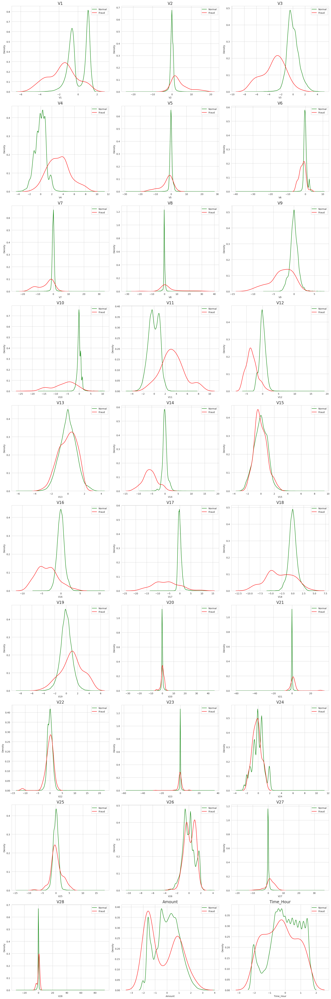

In [46]:
# Make sure you are indexing X_train_pt_df with the correct masks from y_train
normal_records_train = y_train == 0
fraud_records_train = y_train == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10, 3, n+1)
    # Plot KDE (smoothed density) for normal and fraud records
    sns.kdeplot(X_train_pt_df.loc[normal_records_train, col], color='green', label='Normal')
    sns.kdeplot(X_train_pt_df.loc[fraud_records_train, col], color='red', label='Fraud')
    plt.title(col, fontsize=17)
    plt.legend()
plt.tight_layout()
plt.show()

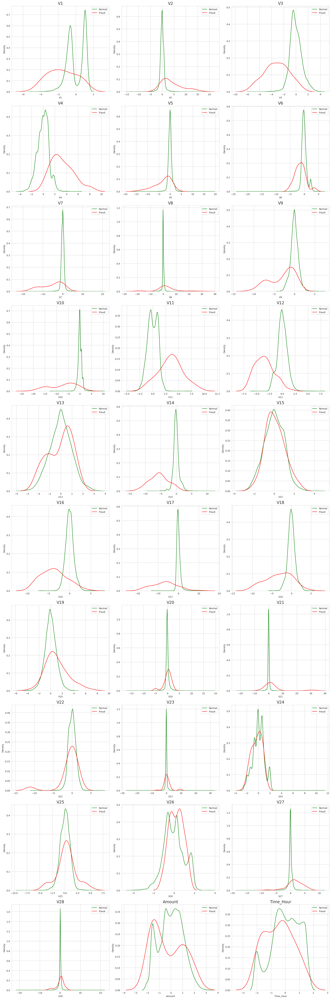

In [47]:
# Create boolean masks for normal and fraud records in the test set
normal_records_test = y_test == 0
fraud_records_test = y_test == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10, 3, n+1)
    # Use KDE plot for smooth distributions
    sns.kdeplot(X_test_pt_df.loc[normal_records_test, col], color='green', label='Normal')
    sns.kdeplot(X_test_pt_df.loc[fraud_records_test, col], color='red', label='Fraud')
    plt.title(col, fontsize=17)
    plt.legend()
plt.tight_layout()
plt.show()

## Model Building

- Build different models on the imbalanced dataset and see the result


In [69]:
def Plot_confusion_matrix(y_test, pred_test):
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import numpy as np

    # Compute the confusion matrix
    cm = confusion_matrix(y_test, pred_test)

    # Clear any existing figure
    plt.clf()

    # Display the confusion matrix as an image with a color map
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Accent)

    # Define class labels
    classNames = ['Non-Fraudalent', 'Fraudalent']

    # Set plot titles and axis labels
    plt.title('Confusion Matrix - Test Data')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    # Set tick marks for both axes
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)

    # Annotate the confusion matrix with label names and counts
    labels = [['TN', 'FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j, i, f"{labels[i][j]} = {cm[i][j]}", fontsize=12, ha='center', va='center')

    # Show the plot
    plt.tight_layout()
    plt.show()

In [82]:
def buildAndRunXGBoostModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Import necessary libraries
    from xgboost import XGBClassifier
    from sklearn.metrics import roc_auc_score, classification_report
    from sklearn import metrics
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    # Train the XGBoost classifier
    XGBmodel = XGBClassifier(random_state=42)
    XGBmodel.fit(X_train, y_train)

    # Predict class labels on the test set
    y_pred = XGBmodel.predict(X_test)

    # Calculate model accuracy
    accuracy = XGBmodel.score(X_test, y_test)
    print('Model Accuracy: {:.4f}'.format(accuracy))

    # Confusion matrix
    print("Confusion Matrix:")
    Plot_confusion_matrix(y_test, y_pred)

    # Classification report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Predict probabilities for ROC
    probs = XGBmodel.predict_proba(X_test)[:, 1]

    # ROC AUC score
    roc_value = roc_auc_score(y_test, probs)
    print("XGBoost ROC AUC Score: {:.4f}".format(roc_value))

    # ROC curve
    fpr, tpr, thresholds = metrics.roc_curve(y_test, probs)

    # Optimal threshold (Youden's J statistic)
    threshold = thresholds[np.argmax(tpr - fpr)]
    print("XGBoost Optimal Threshold: {:.4f}".format(threshold))

    # AUC
    roc_auc = metrics.auc(fpr, tpr)
    print("ROC AUC for Test Dataset: {:.1%}".format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="Test, AUC=" + str(round(roc_auc, 4)))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - XGBoost")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Append evaluation results using pd.concat
    new_row = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['XGBoost'],
        'Accuracy': [accuracy],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })

    df_Results = pd.concat([df_Results, new_row], ignore_index=True)

    return df_Results

In [83]:
def buildAndRunLogisticModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Import required libraries
    from sklearn import linear_model
    from sklearn.model_selection import KFold
    from sklearn import metrics
    from sklearn.metrics import classification_report, roc_auc_score
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    # Define range of C values (inverse of regularization strength)
    num_C = list(np.power(10.0, np.arange(-10, 10)))

    # 10-fold cross-validation
    cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

    # Logistic Regression with L2 regularization
    searchCV_l2 = linear_model.LogisticRegressionCV(
        Cs=num_C, penalty='l2', scoring='roc_auc', cv=cv_num,
        random_state=42, max_iter=10000, fit_intercept=True,
        solver='newton-cg', tol=10
    )

    # Logistic Regression with L1 regularization
    searchCV_l1 = linear_model.LogisticRegressionCV(
        Cs=num_C, penalty='l1', scoring='roc_auc', cv=cv_num,
        random_state=42, max_iter=10000, fit_intercept=True,
        solver='liblinear', tol=10
    )

    # Train both models
    searchCV_l2.fit(X_train, y_train)
    searchCV_l1.fit(X_train, y_train)

    # Print AUC scores
    print('Max AUC-ROC for L2:', searchCV_l2.scores_[1].mean(axis=0).max())
    print('Max AUC-ROC for L1:', searchCV_l1.scores_[1].mean(axis=0).max())

    # L2 parameters
    print("L2 Regularization Parameters")
    print("Coefficients:", searchCV_l2.coef_)
    print("Intercept:", searchCV_l2.intercept_)
    print("CV Scores:", searchCV_l2.scores_)

    # L1 parameters
    print("L1 Regularization Parameters")
    print("Coefficients:", searchCV_l1.coef_)
    print("Intercept:", searchCV_l1.intercept_)
    print("CV Scores:", searchCV_l1.scores_)

    # Predictions
    y_pred_l2 = searchCV_l2.predict(X_test)
    y_pred_l1 = searchCV_l1.predict(X_test)

    # Probabilities
    y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:, 1]
    y_pred_probs_l1 = searchCV_l1.predict_proba(X_test)[:, 1]

    # Accuracy
    Accuracy_l2 = metrics.accuracy_score(y_test, y_pred_l2)
    Accuracy_l1 = metrics.accuracy_score(y_test, y_pred_l1)

    # L2 Evaluation
    print("Accuracy of Logistic model with L2 regularization:", Accuracy_l2)
    print("Confusion Matrix (L2):")
    Plot_confusion_matrix(y_test, y_pred_l2)
    print("Classification Report (L2):")
    print(classification_report(y_test, y_pred_l2))

    # L1 Evaluation
    print("Accuracy of Logistic model with L1 regularization:", Accuracy_l1)
    print("Confusion Matrix (L1):")
    Plot_confusion_matrix(y_test, y_pred_l1)
    print("Classification Report (L1):")
    print(classification_report(y_test, y_pred_l1))

    # ROC & Threshold (L2)
    l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l2)
    threshold_l2 = thresholds[np.argmax(tpr - fpr)]
    print("L2 ROC AUC:", l2_roc_value)
    print("Optimal Threshold (L2):", threshold_l2)

    plt.plot(fpr, tpr, label="L2 ROC Curve, AUC=" + str(round(metrics.auc(fpr, tpr), 4)))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve (L2)")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Append L2 results
    l2_df = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['Logistic Regression with L2 Regularisation'],
        'Accuracy': [Accuracy_l2],
        'roc_value': [l2_roc_value],
        'threshold': [threshold_l2]
    })
    df_Results = pd.concat([df_Results, l2_df], ignore_index=True)

    # ROC & Threshold (L1)
    l1_roc_value = roc_auc_score(y_test, y_pred_probs_l1)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l1)
    threshold_l1 = thresholds[np.argmax(tpr - fpr)]
    print("L1 ROC AUC:", l1_roc_value)
    print("Optimal Threshold (L1):", threshold_l1)

    plt.plot(fpr, tpr, label="L1 ROC Curve, AUC=" + str(round(metrics.auc(fpr, tpr), 4)))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve (L1)")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Append L1 results
    l1_df = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['Logistic Regression with L1 Regularisation'],
        'Accuracy': [Accuracy_l1],
        'roc_value': [l1_roc_value],
        'threshold': [threshold_l1]
    })
    df_Results = pd.concat([df_Results, l1_df], ignore_index=True)

    return df_Results

In [84]:
def buildAndRunKNNModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Import required libraries
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.metrics import roc_auc_score, classification_report
    from sklearn import metrics
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np

    # Create KNN classifier with 5 neighbors and parallel jobs
    knn = KNeighborsClassifier(n_neighbors=5, n_jobs=16)

    # Train the KNN model
    knn.fit(X_train, y_train)

    # Evaluate accuracy score on the test set
    score = knn.score(X_test, y_test)
    print("Model Score (Accuracy):", score)

    # Predict class labels on test set
    y_pred = knn.predict(X_test)

    # Compute and print accuracy and confusion matrix
    KNN_Accuracy = metrics.accuracy_score(y_test, y_pred)
    print("Confusion Matrix:")
    Plot_confusion_matrix(y_test, y_pred)

    # Classification report includes precision, recall, F1-score, etc.
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Predict class probabilities for ROC calculation
    knn_probs = knn.predict_proba(X_test)[:, 1]

    # Compute ROC AUC score
    knn_roc_value = roc_auc_score(y_test, knn_probs)
    print("KNN ROC AUC Score:", knn_roc_value)

    # Generate ROC curve data
    fpr, tpr, thresholds = metrics.roc_curve(y_test, knn_probs)

    # Determine optimal threshold using Youden's J statistic
    threshold = thresholds[np.argmax(tpr - fpr)]
    print("Optimal Threshold:", threshold)

    # Calculate AUC from ROC curve
    roc_auc = metrics.auc(fpr, tpr)
    print("ROC AUC (from curve):", '{:.1%}'.format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label="Test, AUC=" + str(round(roc_auc, 4)))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - KNN")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Prepare results in a DataFrame
    knn_result_df = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['KNN'],
        'Accuracy': [score],
        'roc_value': [knn_roc_value],
        'threshold': [threshold]
    })

    # Append using pd.concat (recommended over .append)
    df_Results = pd.concat([df_Results, knn_result_df], ignore_index=True)

    return df_Results

In [85]:
def buildAndRunSVMModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    from sklearn.svm import SVC
    from sklearn.metrics import accuracy_score, roc_auc_score, classification_report
    from sklearn import metrics
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np

    # Initial SVM (no probability)
    clf = SVC(kernel='sigmoid', random_state=42)
    clf.fit(X_train, y_train)
    y_pred_SVM = clf.predict(X_test)

    SVM_Score = accuracy_score(y_test, y_pred_SVM)
    print("Accuracy Score:", SVM_Score)

    print("Confusion Matrix:")
    Plot_confusion_matrix(y_test, y_pred_SVM)

    print("Classification Report:")
    print(classification_report(y_test, y_pred_SVM))

    # SVM with probability for ROC
    classifier = SVC(kernel='sigmoid', probability=True, random_state=42)
    svm_probs = classifier.fit(X_train, y_train).predict_proba(X_test)[:, 1]

    roc_value = roc_auc_score(y_test, svm_probs)
    print("SVM ROC AUC Score:", roc_value)

    fpr, tpr, thresholds = metrics.roc_curve(y_test, svm_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]
    print("Optimal Threshold:", threshold)

    roc_auc = metrics.auc(fpr, tpr)
    print("ROC AUC (from curve):", '{:.1%}'.format(roc_auc))

    plt.plot(fpr, tpr, label="Test, AUC=" + str(round(roc_auc, 4)))
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - SVM")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Prepare and append results
    svm_result_df = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['SVM'],
        'Accuracy': [SVM_Score],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })

    df_Results = pd.concat([df_Results, svm_result_df], ignore_index=True)

    return df_Results

In [86]:
def buildAndRunTreeModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Import required libraries
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.metrics import roc_auc_score, classification_report
    from sklearn import metrics
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np

    # Criteria to evaluate
    criteria = ['gini', 'entropy']

    for c in criteria:
        # Initialize and train Decision Tree classifier
        dt = DecisionTreeClassifier(criterion=c, random_state=42)
        dt.fit(X_train, y_train)

        # Predict on test data
        y_pred = dt.predict(X_test)
        y_prob = dt.predict_proba(X_test)[:, 1]

        # Accuracy and ROC AUC
        accuracy = dt.score(X_test, y_test)
        roc_value = roc_auc_score(y_test, y_prob)

        print(f"\n--- Decision Tree ({c}) ---")
        print(f"Accuracy Score: {accuracy}")
        print("Confusion Matrix:")
        Plot_confusion_matrix(y_test, y_pred)
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"ROC AUC Score: {roc_value}")

        # Compute ROC Curve
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_prob)
        threshold = thresholds[np.argmax(tpr - fpr)]
        roc_auc = metrics.auc(fpr, tpr)

        print(f"Optimal Threshold: {threshold}")
        print(f"ROC AUC (from curve): {roc_auc:.1%}")

        # Plot ROC Curve
        plt.plot(fpr, tpr, label=f"Test AUC = {round(roc_auc, 4)}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve - Decision Tree ({c})")
        plt.legend(loc=4)
        plt.grid(True)
        plt.show()

        # Prepare row for results DataFrame
        row_df = pd.DataFrame({
            'Data_Imbalance_Handiling': [DataImabalance],
            'Model': [f'Tree Model with {c} criteria'],
            'Accuracy': [accuracy],
            'roc_value': [roc_value],
            'threshold': [threshold]
        })

        # Concatenate with results
        df_Results = pd.concat([df_Results, row_df], ignore_index=True)

    return df_Results

In [87]:
def buildAndRunRandomForestModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Import necessary libraries
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import roc_auc_score, classification_report
    from sklearn import metrics
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np

    # Initialize the Random Forest model
    RF_model = RandomForestClassifier(
        n_estimators=100,
        bootstrap=True,
        max_features='sqrt',
        random_state=42
    )

    # Train the model
    RF_model.fit(X_train, y_train)

    # Accuracy on test data
    accuracy = RF_model.score(X_test, y_test)
    print("Model Accuracy:", accuracy)

    # Predict class labels
    y_pred = RF_model.predict(X_test)

    # Display confusion matrix
    print("Confusion Matrix:")
    Plot_confusion_matrix(y_test, y_pred)

    # Display classification report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Predict probabilities for positive class
    probs = RF_model.predict_proba(X_test)[:, 1]

    # ROC AUC score
    roc_value = roc_auc_score(y_test, probs)
    print("Random Forest ROC AUC Score:", roc_value)

    # ROC curve data
    fpr, tpr, thresholds = metrics.roc_curve(y_test, probs)

    # Optimal threshold using Youden's J
    threshold = thresholds[np.argmax(tpr - fpr)]
    print("Optimal Threshold:", threshold)

    # Calculate AUC
    roc_auc = metrics.auc(fpr, tpr)
    print("ROC AUC (from curve):", '{:.1%}'.format(roc_auc))

    # Plot ROC curve
    plt.plot(fpr, tpr, label=f"Test, AUC={round(roc_auc, 4)}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - Random Forest")
    plt.legend(loc=4)
    plt.grid(True)
    plt.show()

    # Create a new DataFrame row and concatenate it to df_Results
    row_df = pd.DataFrame({
        'Data_Imbalance_Handiling': [DataImabalance],
        'Model': ['Random Forest'],
        'Accuracy': [accuracy],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })

    df_Results = pd.concat([df_Results, row_df], ignore_index=True)

    return df_Results

Logistic Regression with L1 and L2 Regularisation
Max AUC-ROC for L2: 0.5
Max AUC-ROC for L1: 0.9815558528209198
L2 Regularization Parameters
Coefficients: [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
Intercept: [0.]
CV Scores: {np.float64(1.0): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
 

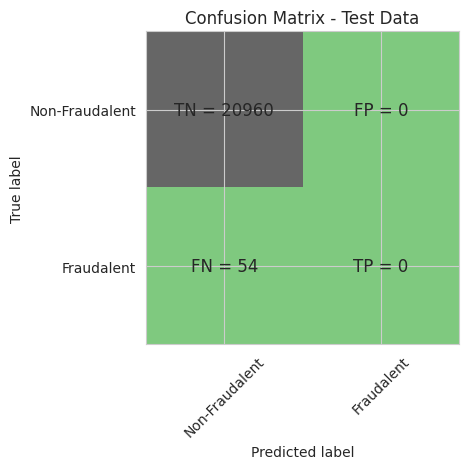

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.00      0.00      0.00        54

    accuracy                           1.00     21014
   macro avg       0.50      0.50      0.50     21014
weighted avg       0.99      1.00      1.00     21014

Accuracy of Logistic model with L1 regularization: 0.9984296183496717
Confusion Matrix (L1):


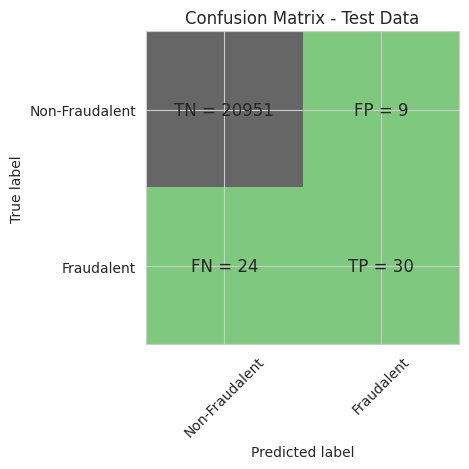

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.77      0.56      0.65        54

    accuracy                           1.00     21014
   macro avg       0.88      0.78      0.82     21014
weighted avg       1.00      1.00      1.00     21014

L2 ROC AUC: 0.5
Optimal Threshold (L2): inf


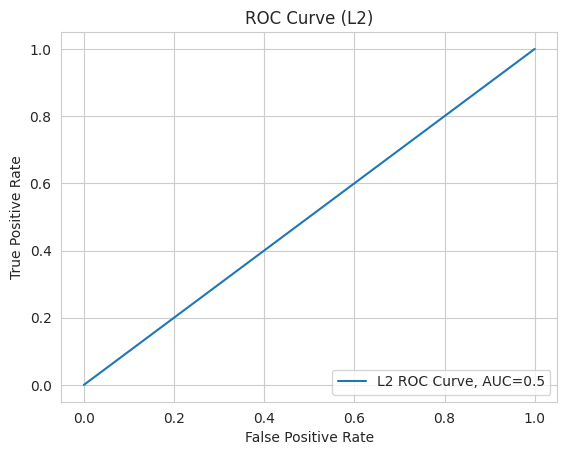

L1 ROC AUC: 0.9791251413627368
Optimal Threshold (L1): 0.009141268601775951


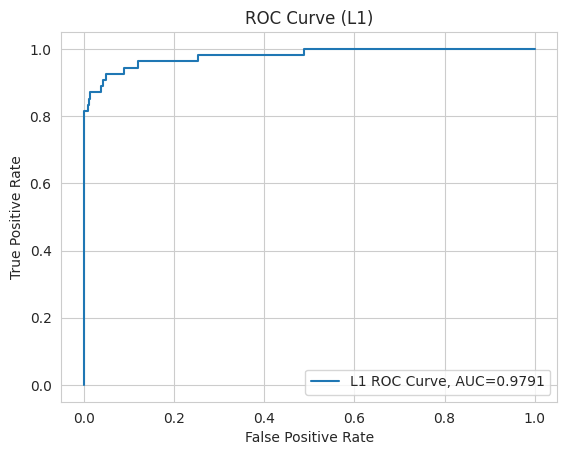

Time Taken by Model: --- 43.07 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9994289521271533
Confusion Matrix:


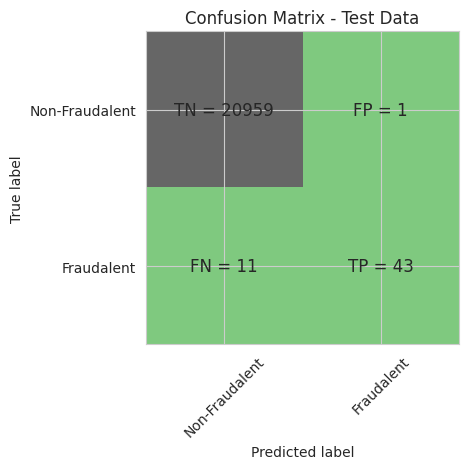

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.98      0.80      0.88        54

    accuracy                           1.00     21014
   macro avg       0.99      0.90      0.94     21014
weighted avg       1.00      1.00      1.00     21014

KNN ROC AUC Score: 0.9258062093582132
Optimal Threshold: 0.2
ROC AUC (from curve): 92.6%


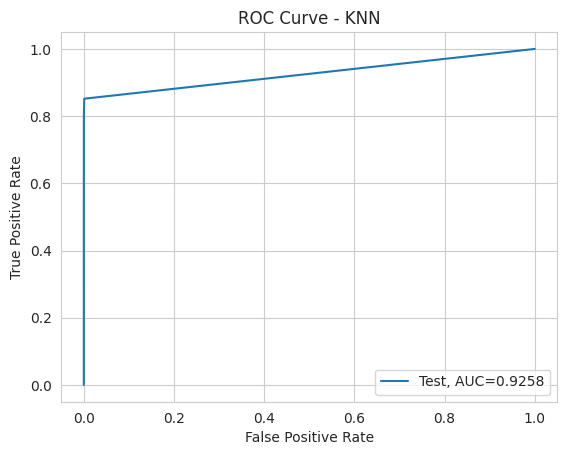

Time Taken by Model: --- 39.89 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9990958408679927
Confusion Matrix:


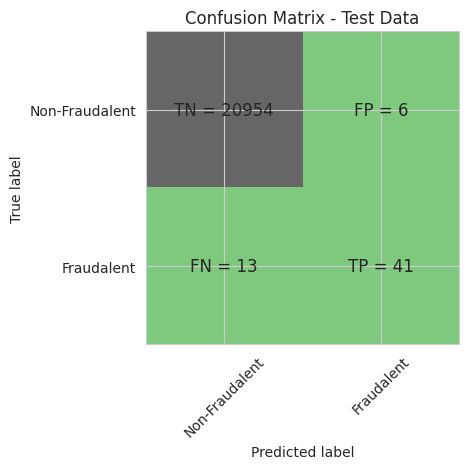

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.87      0.76      0.81        54

    accuracy                           1.00     21014
   macro avg       0.94      0.88      0.91     21014
weighted avg       1.00      1.00      1.00     21014

ROC AUC Score: 0.8794864998586372
Optimal Threshold: 1.0
ROC AUC (from curve): 87.9%


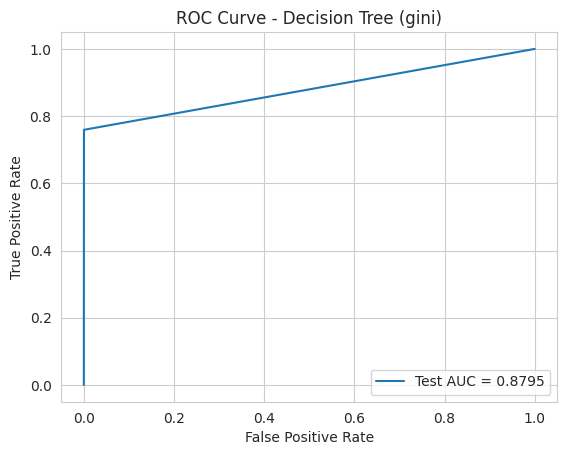


--- Decision Tree (entropy) ---
Accuracy Score: 0.9990958408679927
Confusion Matrix:


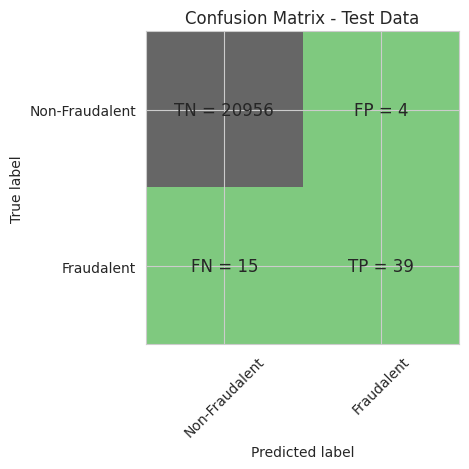

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.91      0.72      0.80        54

    accuracy                           1.00     21014
   macro avg       0.95      0.86      0.90     21014
weighted avg       1.00      1.00      1.00     21014

ROC AUC Score: 0.861015691263783
Optimal Threshold: 1.0
ROC AUC (from curve): 86.1%


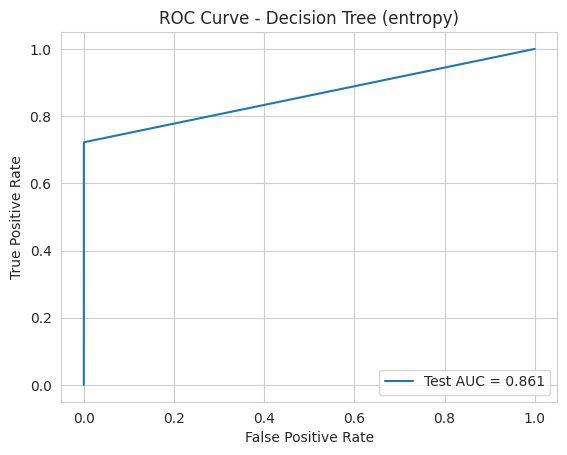

Time Taken by Model: --- 10.83 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9993813648044161
Confusion Matrix:


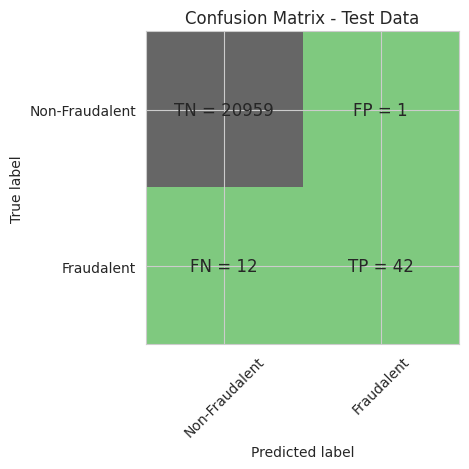

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.98      0.78      0.87        54

    accuracy                           1.00     21014
   macro avg       0.99      0.89      0.93     21014
weighted avg       1.00      1.00      1.00     21014

Random Forest ROC AUC Score: 0.9241376873056263
Optimal Threshold: 0.02
ROC AUC (from curve): 92.4%


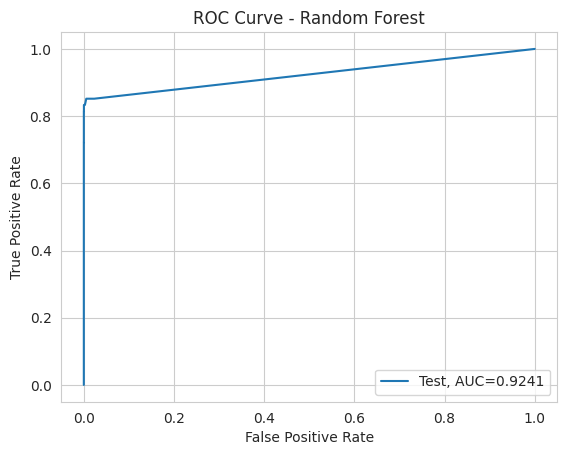

Time Taken by Model: --- 67.67 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9994
Confusion Matrix:


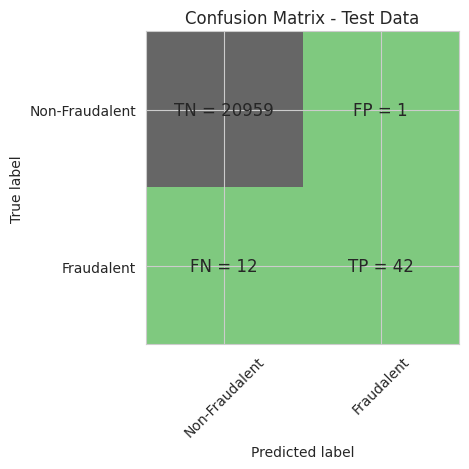

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.98      0.78      0.87        54

    accuracy                           1.00     21014
   macro avg       0.99      0.89      0.93     21014
weighted avg       1.00      1.00      1.00     21014

XGBoost ROC AUC Score: 0.9699
XGBoost Optimal Threshold: 0.0002
ROC AUC for Test Dataset: 97.0%


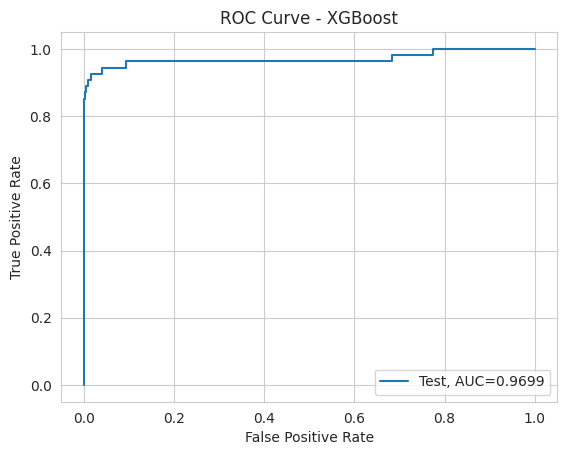

Time Taken by Model: --- 4.36 seconds ---
--------------------------------------------------------------------------------
SVM Model with Sigmoid Kernel
Accuracy Score: 0.9977158085086133
Confusion Matrix:


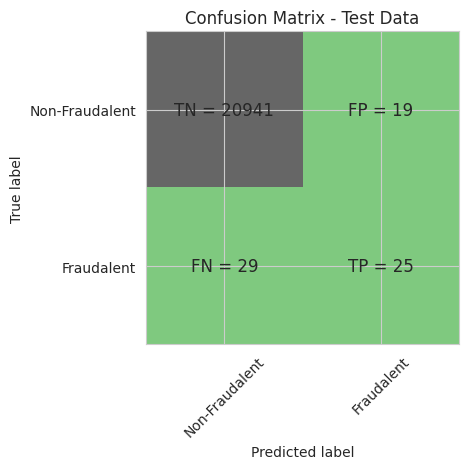

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.57      0.46      0.51        54

    accuracy                           1.00     21014
   macro avg       0.78      0.73      0.75     21014
weighted avg       1.00      1.00      1.00     21014

SVM ROC AUC Score: 0.909317571388182
Optimal Threshold: 0.002428925223930646
ROC AUC (from curve): 90.9%


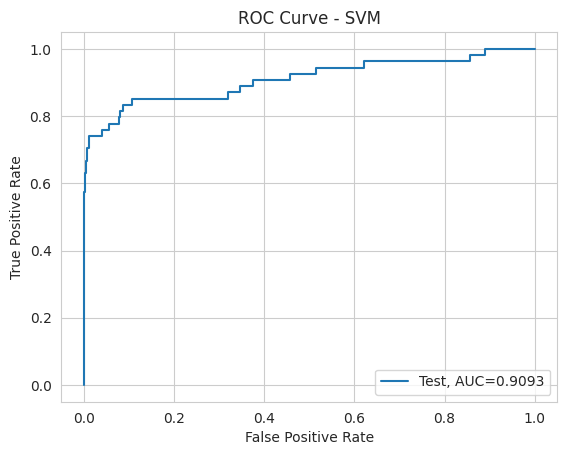

Time Taken by Model: --- 18.69 seconds ---
--------------------------------------------------------------------------------


In [88]:
# Run Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 and L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Run Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(
    df_Results, "Power Transformer", X_train_pt_df, y_train, X_test_pt_df, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [89]:
df_Results.head()

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000


# Perform cross validation with RepeatedKFold


In [92]:
# Import required libraries
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.impute import SimpleImputer
import numpy as np
import pandas as pd

# Step 1: Drop rows where target 'y' is NaN
valid_rows = ~y.isna()
X_clean = X.loc[valid_rows]
y_clean = y.loc[valid_rows]

# Step 2: Impute missing values in X
imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X_clean), columns=X_clean.columns)

# Step 3: Initialize Repeated K-Fold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)

# Step 4: Containers for metrics
accuracies = []
roc_aucs = []

# Step 5: Cross-validation loop
for fold, (train_index, test_index) in enumerate(rkf.split(X_imputed, y_clean), 1):
    X_train_cv, X_test_cv = X_imputed.iloc[train_index], X_imputed.iloc[test_index]
    y_train_cv, y_test_cv = y_clean.iloc[train_index], y_clean.iloc[test_index]

    model = LogisticRegression(max_iter=1000)
    model.fit(X_train_cv, y_train_cv)

    y_pred = model.predict(X_test_cv)
    y_prob = model.predict_proba(X_test_cv)[:, 1]

    acc = accuracy_score(y_test_cv, y_pred)
    auc = roc_auc_score(y_test_cv, y_prob)
    accuracies.append(acc)
    roc_aucs.append(auc)

    print(f"Fold {fold}: Accuracy={acc:.4f}, ROC_AUC={auc:.4f}")

# Step 6: Print summary
print(f"\nMean Accuracy: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Mean ROC_AUC: {np.mean(roc_aucs):.4f} ± {np.std(roc_aucs):.4f}")

Fold 1: Accuracy=0.9989, ROC_AUC=0.9721
Fold 2: Accuracy=0.9990, ROC_AUC=0.9559
Fold 3: Accuracy=0.9987, ROC_AUC=0.9573
Fold 4: Accuracy=0.9980, ROC_AUC=0.9516
Fold 5: Accuracy=0.9990, ROC_AUC=0.9606
Fold 6: Accuracy=0.9986, ROC_AUC=0.9461
Fold 7: Accuracy=0.9989, ROC_AUC=0.9786
Fold 8: Accuracy=0.9983, ROC_AUC=0.9623
Fold 9: Accuracy=0.9990, ROC_AUC=0.9579
Fold 10: Accuracy=0.9987, ROC_AUC=0.9306
Fold 11: Accuracy=0.9985, ROC_AUC=0.9693
Fold 12: Accuracy=0.9986, ROC_AUC=0.9297
Fold 13: Accuracy=0.9991, ROC_AUC=0.9986
Fold 14: Accuracy=0.9987, ROC_AUC=0.9244
Fold 15: Accuracy=0.9989, ROC_AUC=0.9573
Fold 16: Accuracy=0.9984, ROC_AUC=0.9756
Fold 17: Accuracy=0.9985, ROC_AUC=0.9304
Fold 18: Accuracy=0.9989, ROC_AUC=0.9373
Fold 19: Accuracy=0.9988, ROC_AUC=0.9387
Fold 20: Accuracy=0.9991, ROC_AUC=0.9995
Fold 21: Accuracy=0.9988, ROC_AUC=0.9943
Fold 22: Accuracy=0.9987, ROC_AUC=0.9703
Fold 23: Accuracy=0.9990, ROC_AUC=0.9367
Fold 24: Accuracy=0.9985, ROC_AUC=0.9577
Fold 25: Accuracy=0.9987,

Logistic Regression with L1 and L2 Regularisation
Max AUC-ROC for L2: 0.5826533510519452
Max AUC-ROC for L1: 0.9640565226425805
L2 Regularization Parameters
Coefficients: [[ 7.76099618e-07  1.60013084e-07 -2.35397091e-06 -4.44711381e-07
   8.81022706e-07 -3.36770562e-07  2.87164684e-07 -1.74999020e-07
   1.24834979e-07 -1.92880454e-08 -7.30027939e-07  8.04384454e-08
   1.10648540e-08 -2.66117687e-07 -6.14218194e-07 -5.23462629e-08
  -3.06349964e-07  2.75118789e-07  6.93019687e-08 -1.46799093e-07
   1.21509830e-07  3.40156758e-07  1.24931325e-07 -3.06978860e-08
  -4.37735036e-07 -8.82064545e-08 -1.84127478e-09 -6.10615989e-09
  -3.17729458e-04 -3.81643816e-05]]
Intercept: [-3.27524302e-06]
CV Scores: {np.float64(1.0): array([[0.59323277, 0.59284522, 0.59205223, 0.59053184, 0.59053184,
        0.59053184, 0.59053184, 0.59053184, 0.59053184, 0.59053184,
        0.59053184, 0.59053184, 0.59053184, 0.59053184, 0.59053184,
        0.59053184, 0.59053184, 0.59053184, 0.59053184, 0.59053184],


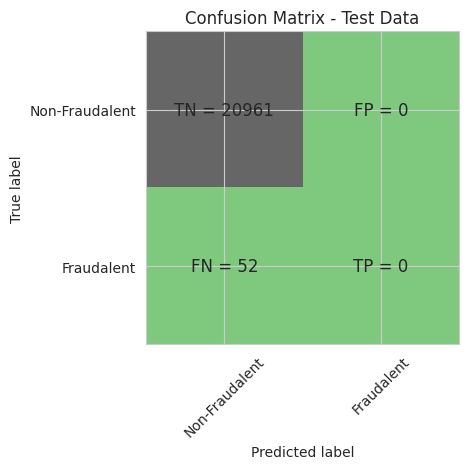

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.00      0.00      0.00        52

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

Accuracy of Logistic model with L1 regularization: 0.9982391852662638
Confusion Matrix (L1):


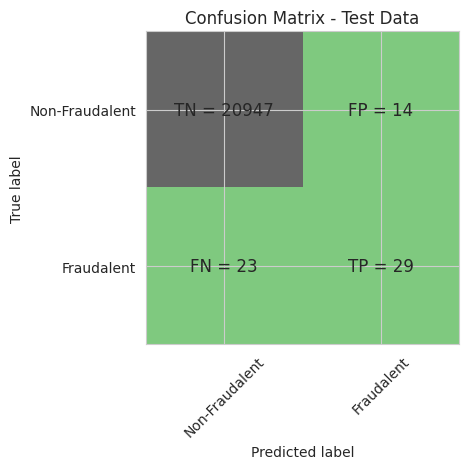

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.67      0.56      0.61        52

    accuracy                           1.00     21013
   macro avg       0.84      0.78      0.80     21013
weighted avg       1.00      1.00      1.00     21013

L2 ROC AUC: 0.5918996084303083
Optimal Threshold (L2): 0.4997507134235401


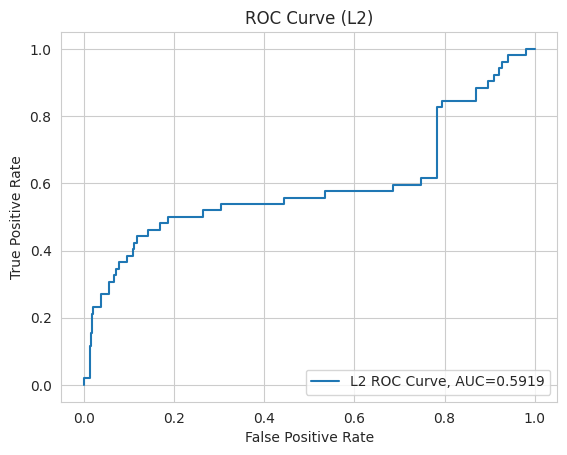

L1 ROC AUC: 0.905538857878918
Optimal Threshold (L1): 0.06929549151668594


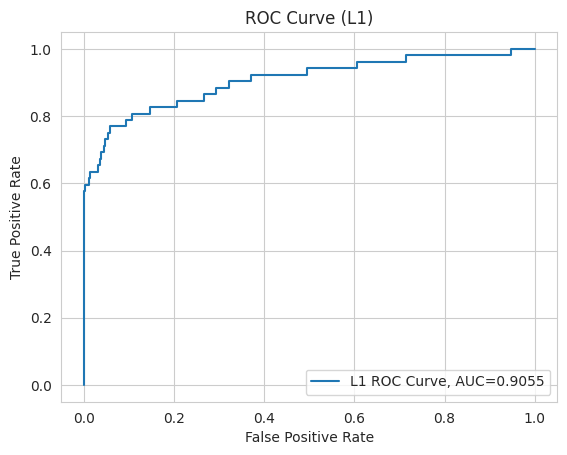

Time Taken by Model: --- 43.10 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9989054394898397
Confusion Matrix:


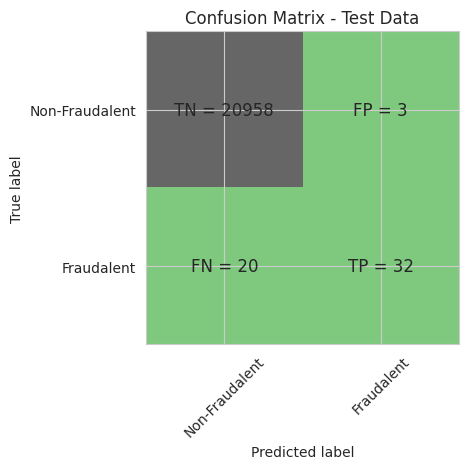

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.91      0.62      0.74        52

    accuracy                           1.00     21013
   macro avg       0.96      0.81      0.87     21013
weighted avg       1.00      1.00      1.00     21013

KNN ROC AUC Score: 0.9132927267856422
Optimal Threshold: 0.2
ROC AUC (from curve): 91.3%


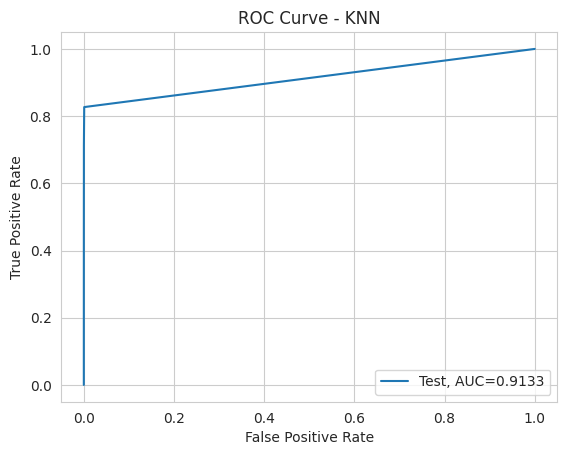

Time Taken by Model: --- 39.39 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9987150811402465
Confusion Matrix:


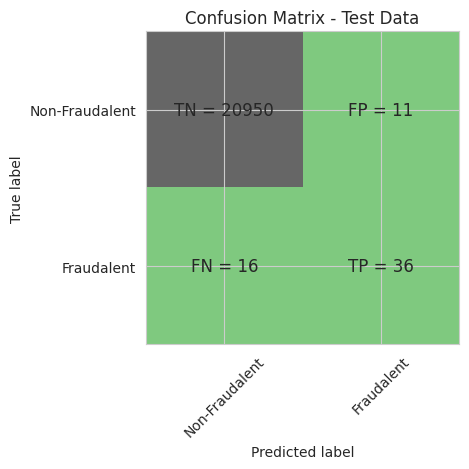

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.77      0.69      0.73        52

    accuracy                           1.00     21013
   macro avg       0.88      0.85      0.86     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8458914540923986
Optimal Threshold: 1.0
ROC AUC (from curve): 84.6%


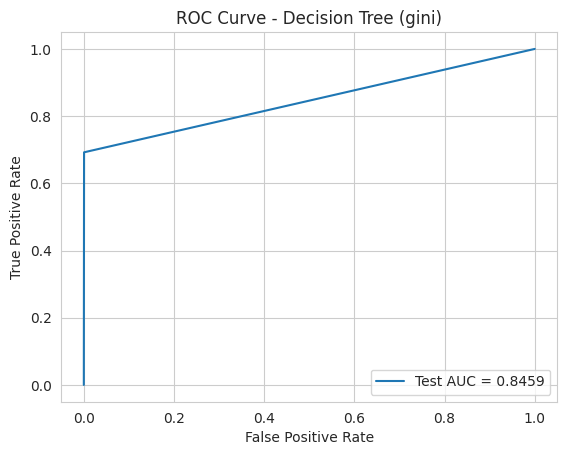


--- Decision Tree (entropy) ---
Accuracy Score: 0.9989054394898397
Confusion Matrix:


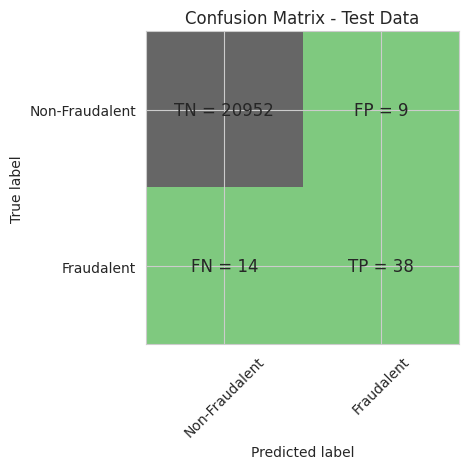

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.81      0.73      0.77        52

    accuracy                           1.00     21013
   macro avg       0.90      0.87      0.88     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8651699309707039
Optimal Threshold: 1.0
ROC AUC (from curve): 86.5%


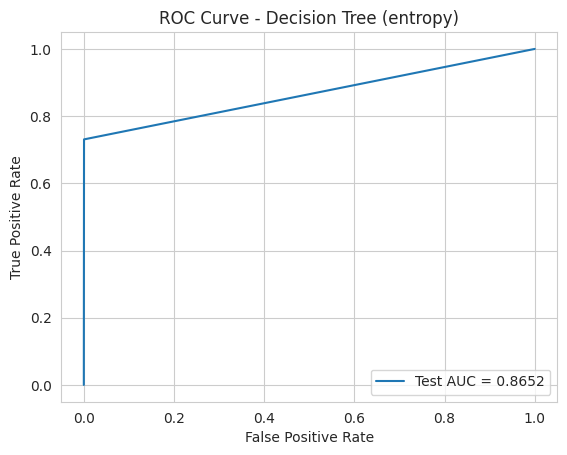

Time Taken by Model: --- 11.61 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9993337457764241
Confusion Matrix:


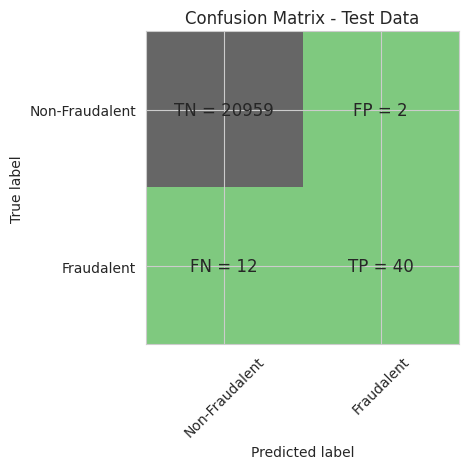

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.95      0.77      0.85        52

    accuracy                           1.00     21013
   macro avg       0.98      0.88      0.93     21013
weighted avg       1.00      1.00      1.00     21013

Random Forest ROC AUC Score: 0.9407260003009251
Optimal Threshold: 0.05
ROC AUC (from curve): 94.1%


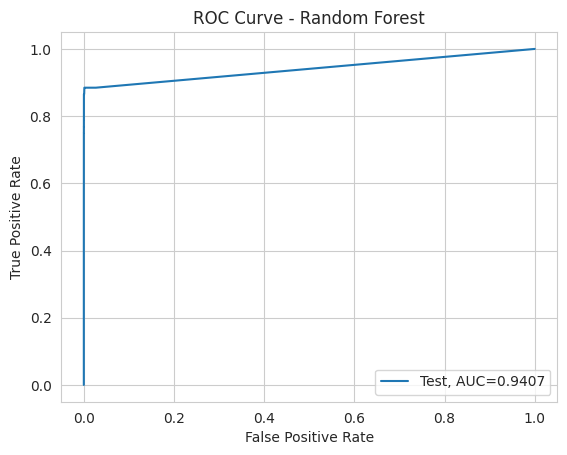

Time Taken by Model: --- 66.08 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9995
Confusion Matrix:


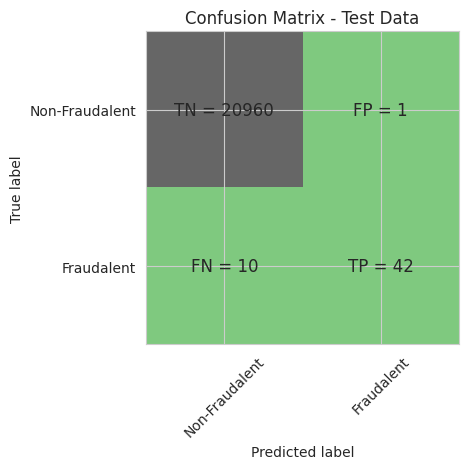

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.98      0.81      0.88        52

    accuracy                           1.00     21013
   macro avg       0.99      0.90      0.94     21013
weighted avg       1.00      1.00      1.00     21013

XGBoost ROC AUC Score: 0.9640
XGBoost Optimal Threshold: 0.0001
ROC AUC for Test Dataset: 96.4%


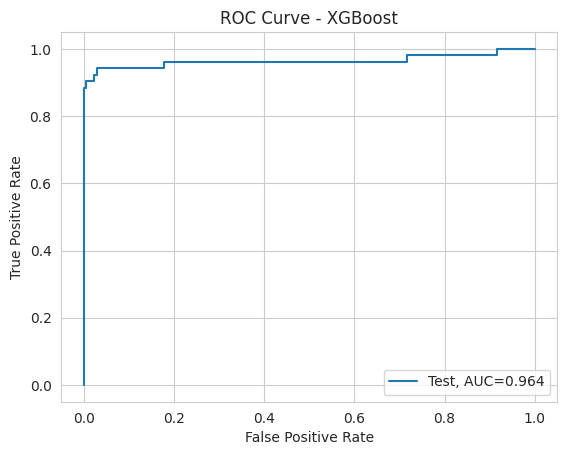

Time Taken by Model: --- 2.19 seconds ---
--------------------------------------------------------------------------------
SVM Model with Sigmoid Kernel
Accuracy Score: 0.9967639080569172
Confusion Matrix:


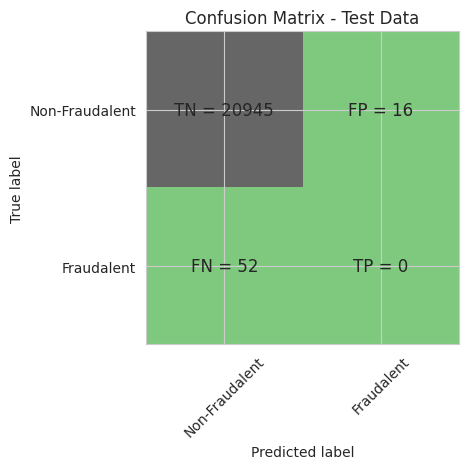

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20961
         1.0       0.00      0.00      0.00        52

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

SVM ROC AUC Score: 0.6849442004014782
Optimal Threshold: 0.004515416257539696
ROC AUC (from curve): 68.5%


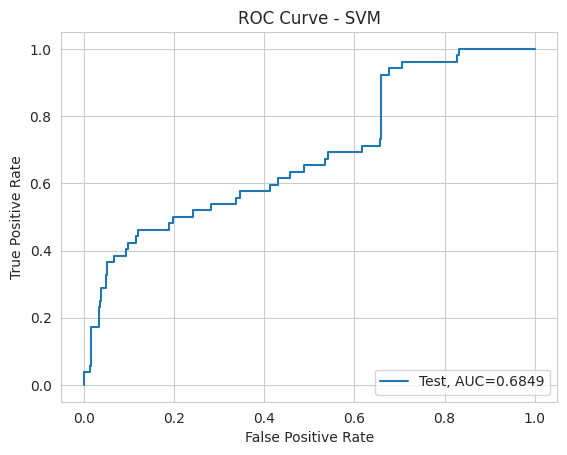

Time Taken by Model: --- 30.77 seconds ---
--------------------------------------------------------------------------------


In [93]:
from sklearn.impute import SimpleImputer
import time

# ---------------------------------------------
# Impute missing values for the current CV split
# ---------------------------------------------

# Drop rows with NaNs in features, and keep target aligned
X_train_cv = X_train_cv.dropna()
y_train_cv = y_train_cv.loc[X_train_cv.index]

X_test_cv = X_test_cv.dropna()
y_test_cv = y_test_cv.loc[X_test_cv.index]

# Initialize mean imputer and fit on training data, then transform both sets
imputer = SimpleImputer(strategy='mean')
X_train_cv_imputed = pd.DataFrame(
    imputer.fit_transform(X_train_cv),
    columns=X_train_cv.columns,
    index=X_train_cv.index
)
X_test_cv_imputed = pd.DataFrame(
    imputer.transform(X_test_cv),
    columns=X_test_cv.columns,
    index=X_test_cv.index
)

# --------------------------------------------------
# Run Logistic Regression with L1 and L2 Regularisation
# --------------------------------------------------
print("Logistic Regression with L1 and L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# ---------------
# Run KNN Model
# ---------------
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# ----------------------------------------------------
# Run Decision Tree Models with 'gini' & 'entropy' criteria
# ----------------------------------------------------
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# ----------------------
# Run Random Forest Model
# ----------------------
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# -----------------
# Run XGBoost Model
# -----------------
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# --------------------------------------
# Run SVM Model with Sigmoid Kernel
# --------------------------------------
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(
    df_Results,
    "RepeatedKFold Cross Validation",
    X_train_cv_imputed,
    y_train_cv,
    X_test_cv_imputed,
    y_test_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [94]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
5,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
6,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
7,Power Transformer,KNN,0.999429,0.925806,0.200000
8,Power Transformer,Tree Model with gini criteria,0.999096,0.879486,1.000000
9,Power Transformer,Tree Model with entropy criteria,0.999096,0.861016,1.000000


## It seems XGBOost with Repeated KFold cross validation has provided us wih best results with ROC_Value of 0.984352


In [95]:
from xgboost import XGBClassifier
import pandas as pd
import numpy as np

# Fit XGBoost model on training fold
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_train_cv, y_train_cv)

# Create a DataFrame of feature importances
# Use X_train_cv.columns to ensure alignment if feature set changes
coefficients = pd.DataFrame({
    'Feature': X_train_cv.columns,
    'feature_importances': XGBmodel.feature_importances_
})

# Display the feature importances
print(coefficients.sort_values(by='feature_importances', ascending=False).head(10))

   Feature  feature_importances
16     V17             0.288782
9      V10             0.210240
13     V14             0.099909
11     V12             0.055866
26     V27             0.049420
8       V9             0.031324
25     V26             0.025023
3       V4             0.021955
17     V18             0.021458
2       V3             0.019484


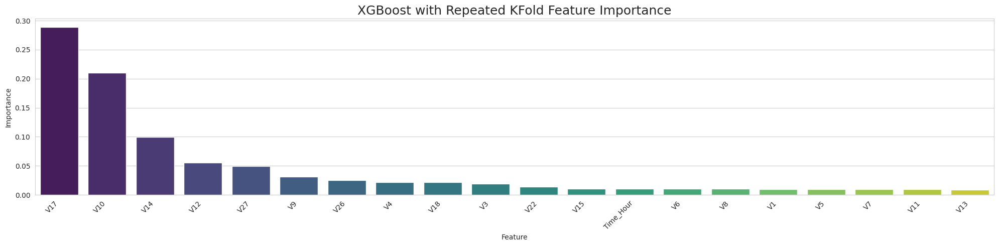

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by importance and select top 20 features (or adjust as needed)
top_n = 20
coefficients_sorted = coefficients.sort_values(by='feature_importances', ascending=False).head(top_n)

plt.figure(figsize=(20, 5))
sns.barplot(
    x='Feature',
    y='feature_importances',
    data=coefficients_sorted,
    palette='viridis'
)
plt.title("XGBoost with Repeated KFold Feature Importance", fontsize=18)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Perform cross validation with StratifiedKFold


In [97]:
from sklearn.model_selection import StratifiedKFold

# Remove rows where y is NaN to keep X and y aligned
mask = y.notna()
X = X.loc[mask]
y = y.loc[mask]

# Initialize StratifiedKFold to preserve class proportions in each split
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate through each fold and get train/test indices
for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
    print(f"Fold {fold}:")
    print("  TRAIN indices:", train_index)
    print("  TEST indices:", test_index)

    # Split data into training and test sets for this fold
    X_train_SKF_cv, X_test_SKF_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_SKF_cv, y_test_SKF_cv = y.iloc[train_index], y.iloc[test_index]

    # You can now fit your models using X_train_SKF_cv, y_train_SKF_cv and evaluate on X_test_SKF_cv, y_test_SKF_cv
    # Example:
    # model.fit(X_train_SKF_cv, y_train_SKF_cv)
    # y_pred = model.predict(X_test_SKF_cv)
    # ... (evaluate performance here)

    print("-" * 40)

Fold 1:
  TRAIN indices: [     0      2      4 ... 105061 105062 105063]
  TEST indices: [     1      3      9 ... 105060 105064 105065]
----------------------------------------
Fold 2:
  TRAIN indices: [     0      1      2 ... 105063 105064 105065]
  TEST indices: [     6      8     10 ... 105039 105053 105058]
----------------------------------------
Fold 3:
  TRAIN indices: [     1      2      3 ... 105063 105064 105065]
  TEST indices: [     0     14     16 ... 105055 105056 105061]
----------------------------------------
Fold 4:
  TRAIN indices: [     0      1      3 ... 105063 105064 105065]
  TEST indices: [     2     22     26 ... 105052 105059 105062]
----------------------------------------
Fold 5:
  TRAIN indices: [     0      1      2 ... 105062 105064 105065]
  TEST indices: [     4      5      7 ... 105044 105057 105063]
----------------------------------------


### Similarly explore other algorithms by building models like:

- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost


Logistic Regression with L1 and L2 Regularisation
Max AUC-ROC for L2: 0.5912095412379288
Max AUC-ROC for L1: 0.9545864818378996
L2 Regularization Parameters
Coefficients: [[ 7.71908521e-07  1.65337728e-07 -2.36339493e-06 -4.54048730e-07
   8.68927581e-07 -3.36935633e-07  2.89371611e-07 -1.61668859e-07
   1.20608791e-07 -2.12334415e-08 -7.26296708e-07  1.02757688e-07
   1.06406564e-08 -2.66652266e-07 -6.12025240e-07 -6.34803094e-08
  -3.13832129e-07  2.77436890e-07  5.95723795e-08 -1.39614475e-07
   1.17994112e-07  3.41211480e-07  1.17044582e-07 -3.14566987e-08
  -4.36423400e-07 -8.17950251e-08 -9.35957110e-10 -5.65541666e-09
  -3.15816862e-04 -3.81127405e-05]]
Intercept: [-3.27416827e-06]
CV Scores: {np.float64(1.0): array([[0.64711435, 0.64713268, 0.64653695, 0.64571209, 0.64571209,
        0.64571209, 0.64571209, 0.64571209, 0.64571209, 0.64571209,
        0.64571209, 0.64571209, 0.64571209, 0.64571209, 0.64571209,
        0.64571209, 0.64571209, 0.64571209, 0.64571209, 0.64571209],


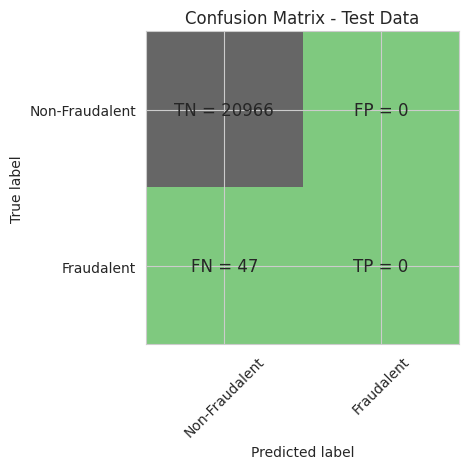

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

Accuracy of Logistic model with L1 regularization: 0.9983819540284585
Confusion Matrix (L1):


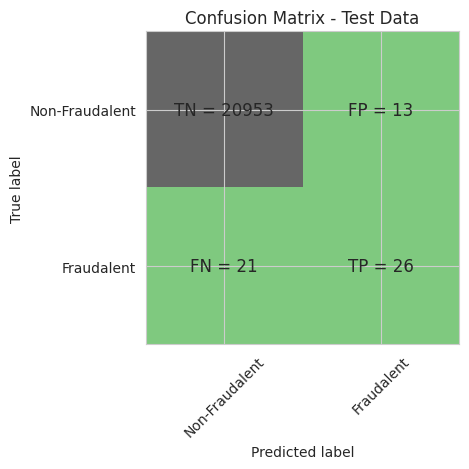

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.67      0.55      0.60        47

    accuracy                           1.00     21013
   macro avg       0.83      0.78      0.80     21013
weighted avg       1.00      1.00      1.00     21013

L2 ROC AUC: 0.5249096307902765
Optimal Threshold (L2): 0.4995965760150056


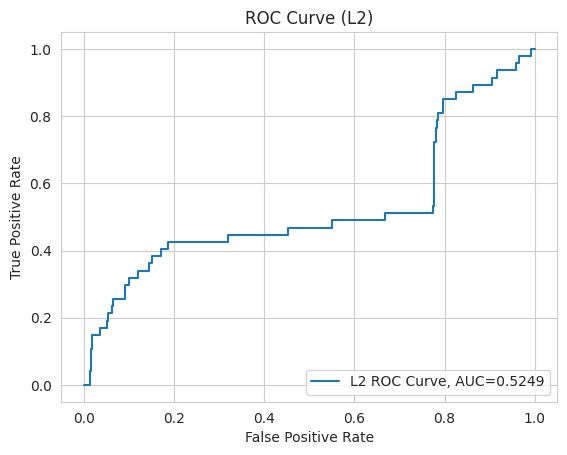

L1 ROC AUC: 0.9216614133115216
Optimal Threshold (L1): 0.06075950071652883


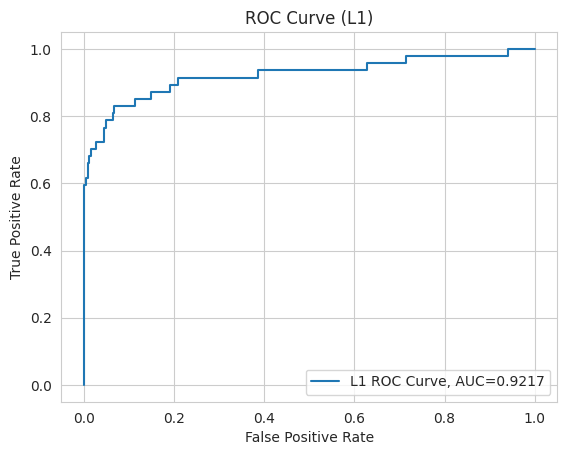

Time Taken by Model: --- 50.44 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9991433874268311
Confusion Matrix:


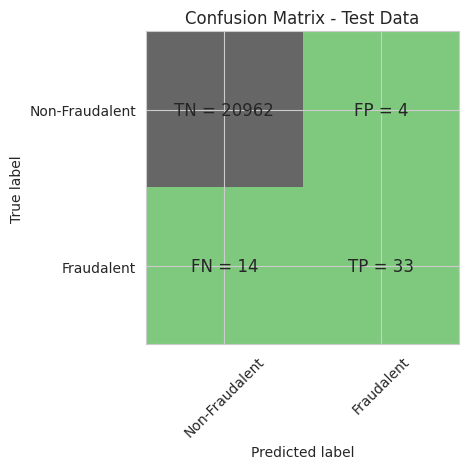

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.89      0.70      0.79        47

    accuracy                           1.00     21013
   macro avg       0.95      0.85      0.89     21013
weighted avg       1.00      1.00      1.00     21013

KNN ROC AUC Score: 0.8934840806087262
Optimal Threshold: 0.2
ROC AUC (from curve): 89.3%


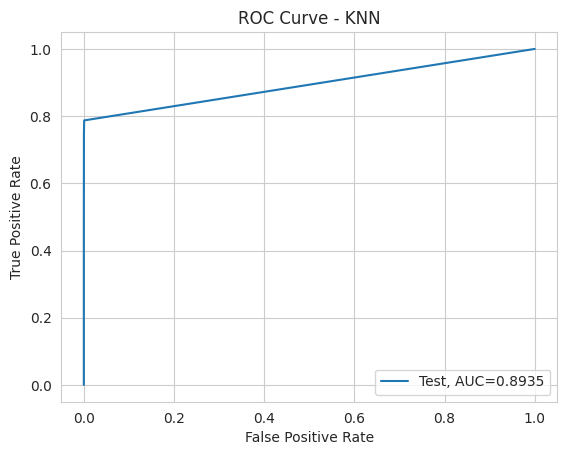

Time Taken by Model: --- 39.36 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9990957978394327
Confusion Matrix:


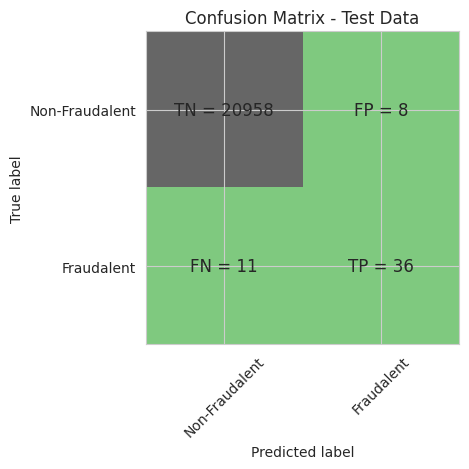

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.82      0.77      0.79        47

    accuracy                           1.00     21013
   macro avg       0.91      0.88      0.90     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8827879383236485
Optimal Threshold: 1.0
ROC AUC (from curve): 88.3%


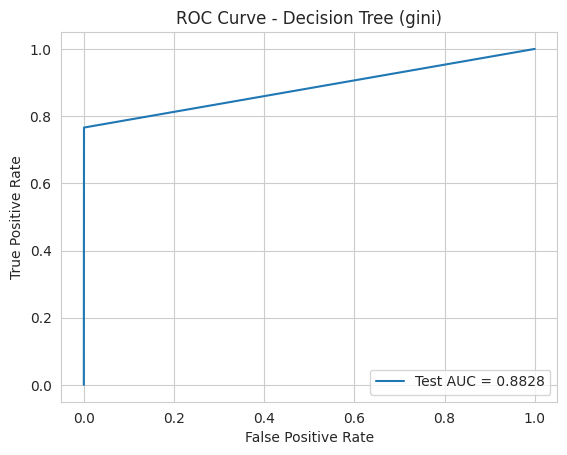


--- Decision Tree (entropy) ---
Accuracy Score: 0.9987150811402465
Confusion Matrix:


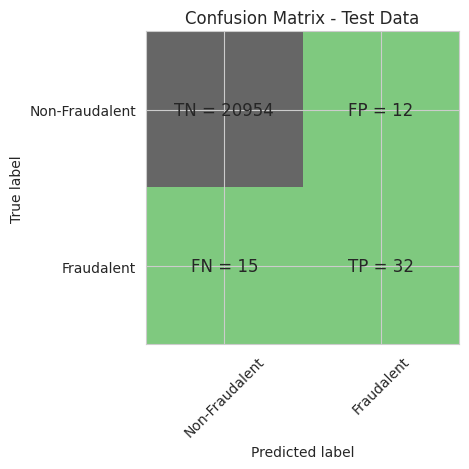

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.73      0.68      0.70        47

    accuracy                           1.00     21013
   macro avg       0.86      0.84      0.85     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8401393542939836
Optimal Threshold: 1.0
ROC AUC (from curve): 84.0%


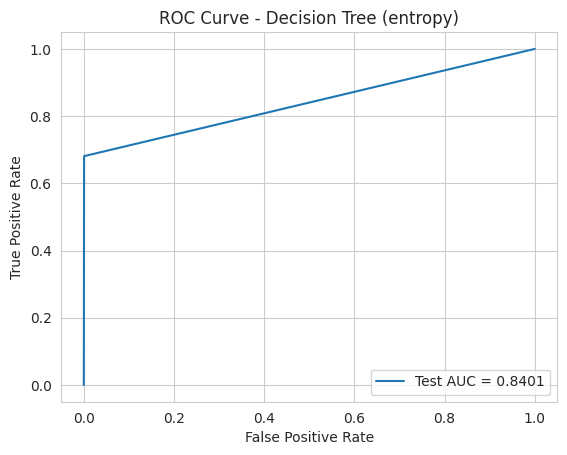

Time Taken by Model: --- 10.56 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9996192833008137
Confusion Matrix:


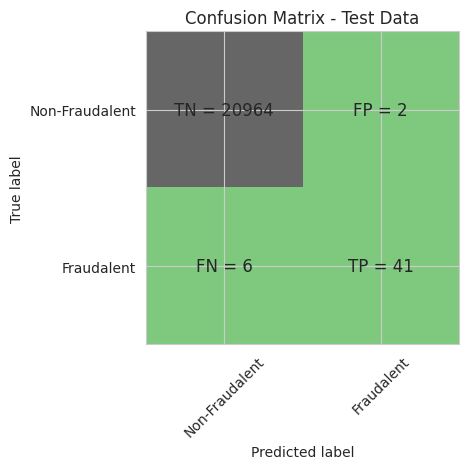

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.95      0.87      0.91        47

    accuracy                           1.00     21013
   macro avg       0.98      0.94      0.96     21013
weighted avg       1.00      1.00      1.00     21013

Random Forest ROC AUC Score: 0.9561595166236723
Optimal Threshold: 0.31
ROC AUC (from curve): 95.6%


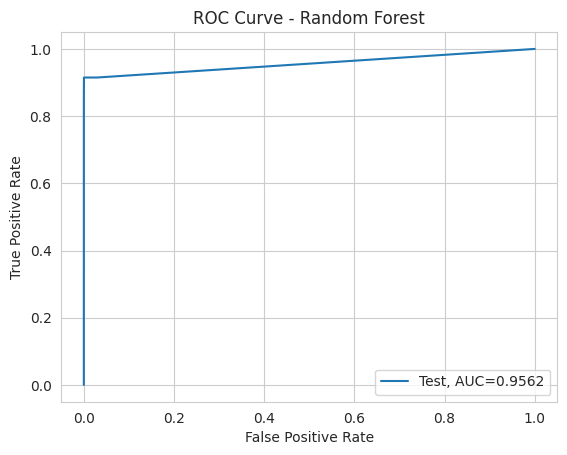

Time Taken by Model: --- 68.10 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9997
Confusion Matrix:


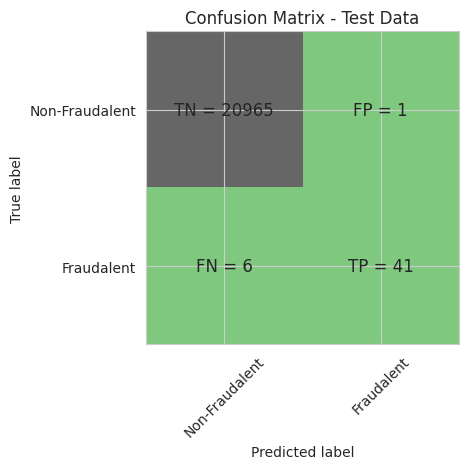

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.98      0.87      0.92        47

    accuracy                           1.00     21013
   macro avg       0.99      0.94      0.96     21013
weighted avg       1.00      1.00      1.00     21013

XGBoost ROC AUC Score: 0.9654
XGBoost Optimal Threshold: 0.0067
ROC AUC for Test Dataset: 96.5%


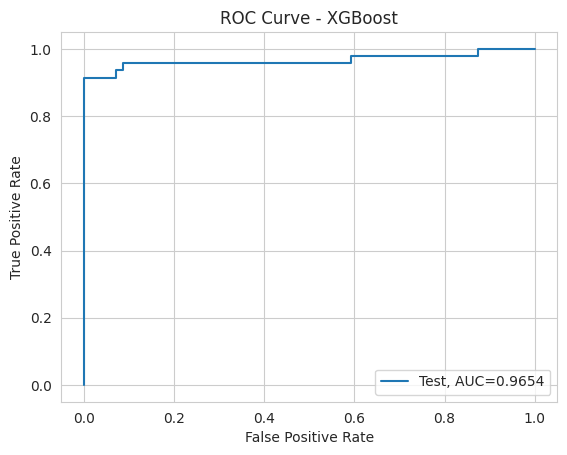

Time Taken by Model: --- 4.42 seconds ---
--------------------------------------------------------------------------------
SVM Model with Sigmoid Kernel
Accuracy Score: 0.9971922143435017
Confusion Matrix:


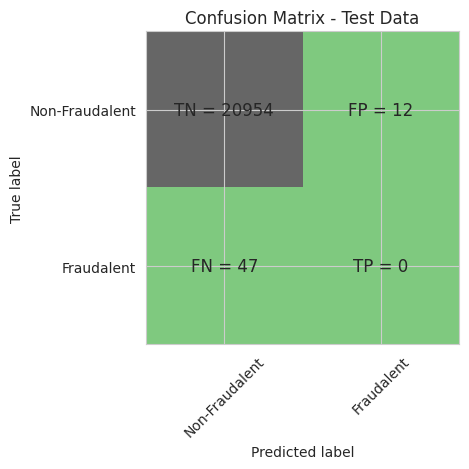

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

SVM ROC AUC Score: 0.6352118221801863
Optimal Threshold: 0.003654773956714648
ROC AUC (from curve): 63.5%


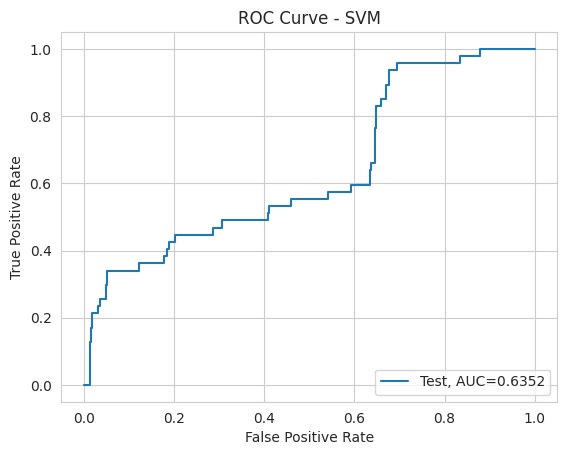

Time Taken by Model: --- 41.28 seconds ---
--------------------------------------------------------------------------------


In [98]:
import time

# Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 and L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(
    df_Results, "StratifiedKFold Cross Validation",
    X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [99]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
5,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
6,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
7,Power Transformer,KNN,0.999429,0.925806,0.200000
8,Power Transformer,Tree Model with gini criteria,0.999096,0.879486,1.000000
9,Power Transformer,Tree Model with entropy criteria,0.999096,0.861016,1.000000


**As the results show Logistic Regression with L2 Regularisation for StratifiedFold cross validation provided best results**


#### Proceed with the model which shows the best result

- Apply the best hyperparameter on the model
- Predict on the test dataset


In [100]:
import numpy as np
import pandas as pd
from sklearn import linear_model
from sklearn.model_selection import KFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn import metrics
from sklearn.metrics import roc_auc_score

# Step 0: Clean Training Data - Remove rows with NaNs and align indices
if isinstance(X_train, pd.DataFrame) and isinstance(y_train, pd.Series):
    # Align y_train to X_train's index (may introduce NaNs in y_train)
    y_train = y_train.reindex(X_train.index)

    # Mask for rows in X_train without any NaNs
    mask = ~X_train.isnull().any(axis=1)

    # Apply mask to both X_train and y_train to keep them aligned
    X_train_clean = X_train.loc[mask]
    y_train_clean = y_train.loc[mask]

    # Drop any NaNs in y_train_clean (in case reindexing created them)
    valid_mask = y_train_clean.notnull()
    X_train_clean = X_train_clean.loc[valid_mask]
    y_train_clean = y_train_clean.loc[valid_mask]
else:
    # For numpy arrays
    mask = ~np.isnan(X_train).any(axis=1)
    X_train_clean = X_train[mask]
    y_train_clean = y_train[mask]

print(f"Original shapes: X_train={X_train.shape}, y_train={y_train.shape}")
print(f"Cleaned shapes: X_train={X_train_clean.shape}, y_train={y_train_clean.shape}")

# Step 1: Define Hyperparameter Range and Cross-Validation Strategy
num_C = list(np.power(10.0, np.arange(-10, 10)))
cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 2: Build Pipeline (Imputation + Logistic Regression with L2 Regularization)
pipeline = make_pipeline(
    SimpleImputer(strategy='mean'),
    linear_model.LogisticRegressionCV(
        Cs=num_C,
        penalty='l2',
        scoring='roc_auc',
        cv=cv_num,
        random_state=42,
        max_iter=10000,
        fit_intercept=True,
        solver='newton-cg',
        tol=10
    )
)

# Step 3: Fit Pipeline on Cleaned Training Data
pipeline.fit(X_train_clean, y_train_clean)
searchCV_l2 = pipeline.named_steps['logisticregressioncv']

# Step 4: Output Model Performance on Training (CV) Data
print('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())
print("Parameters for l2 regularisation:")
print(searchCV_l2.coef_)
print(searchCV_l2.intercept_)

# Step 5: Predict and Evaluate on Test Set
y_pred_l2 = pipeline.predict(X_test)
y_pred_probs_l2 = pipeline.predict_proba(X_test)[:, 1]

Accuracy_l2 = metrics.accuracy_score(y_true=y_test, y_pred=y_pred_l2)
print(f"Accuracy of Logistic model with l2 regularisation : {Accuracy_l2:.4f}")

l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
print(f"l2 roc_value: {l2_roc_value:.4f}")

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l2)
threshold = thresholds[np.argmax(tpr - fpr)]
print(f"l2 threshold: {threshold:.4f}")

Original shapes: X_train=(84052, 30), y_train=(84052,)
Cleaned shapes: X_train=(84052, 30), y_train=(84052,)
Max auc_roc for l2: 0.5879742235834601
Parameters for l2 regularisation:
[[ 7.61565833e-07  1.54526968e-07 -2.37313770e-06 -4.46990544e-07
   8.76440879e-07 -3.54527582e-07  2.85300241e-07 -1.56642014e-07
   1.30546944e-07 -1.15224490e-08 -7.18667360e-07  8.78424833e-08
   7.62234139e-09 -2.71452333e-07 -6.13550780e-07 -5.07351397e-08
  -3.06170806e-07  2.76361453e-07  7.34899251e-08 -1.34506987e-07
   1.17424898e-07  3.43434917e-07  1.16009629e-07 -2.68382132e-08
  -4.35640299e-07 -8.72573679e-08 -8.63460594e-10 -4.51640316e-09
  -3.16615708e-04 -3.81295121e-05]]
[-3.27458581e-06]
Accuracy of Logistic model with l2 regularisation : 0.9974
l2 roc_value: 0.5839
l2 threshold: 0.4997


In [101]:
searchCV_l2.coef_

array([[ 7.61565833e-07,  1.54526968e-07, -2.37313770e-06,
        -4.46990544e-07,  8.76440879e-07, -3.54527582e-07,
         2.85300241e-07, -1.56642014e-07,  1.30546944e-07,
        -1.15224490e-08, -7.18667360e-07,  8.78424833e-08,
         7.62234139e-09, -2.71452333e-07, -6.13550780e-07,
        -5.07351397e-08, -3.06170806e-07,  2.76361453e-07,
         7.34899251e-08, -1.34506987e-07,  1.17424898e-07,
         3.43434917e-07,  1.16009629e-07, -2.68382132e-08,
        -4.35640299e-07, -8.72573679e-08, -8.63460594e-10,
        -4.51640316e-09, -3.16615708e-04, -3.81295121e-05]])

In [102]:
import pandas as pd
import numpy as np

feature_names = X_train_clean.columns if isinstance(X_train_clean, pd.DataFrame) else X.columns

# For binary classification
coef = searchCV_l2.coef_.ravel()

coefficients = pd.DataFrame({
    'Feature': feature_names,
    'Importance Coefficient': coef
})

print(coefficients.sort_values(by='Importance Coefficient', ascending=False))

      Feature  Importance Coefficient
4          V5            8.764409e-07
0          V1            7.615658e-07
21        V22            3.434349e-07
6          V7            2.853002e-07
17        V18            2.763615e-07
1          V2            1.545270e-07
8          V9            1.305469e-07
20        V21            1.174249e-07
22        V23            1.160096e-07
11        V12            8.784248e-08
18        V19            7.348993e-08
12        V13            7.622341e-09
26        V27           -8.634606e-10
27        V28           -4.516403e-09
9         V10           -1.152245e-08
23        V24           -2.683821e-08
15        V16           -5.073514e-08
25        V26           -8.725737e-08
19        V20           -1.345070e-07
7          V8           -1.566420e-07
13        V14           -2.714523e-07
16        V17           -3.061708e-07
5          V6           -3.545276e-07
24        V25           -4.356403e-07
3          V4           -4.469905e-07
14        V1

In [103]:
coefficients

,Feature,Importance Coefficient
0,V1,7.615658e-07
1,V2,1.545270e-07
2,V3,-2.373138e-06
3,V4,-4.469905e-07
4,V5,8.764409e-07
5,V6,-3.545276e-07
6,V7,2.853002e-07
7,V8,-1.566420e-07
8,V9,1.305469e-07
9,V10,-1.152245e-08


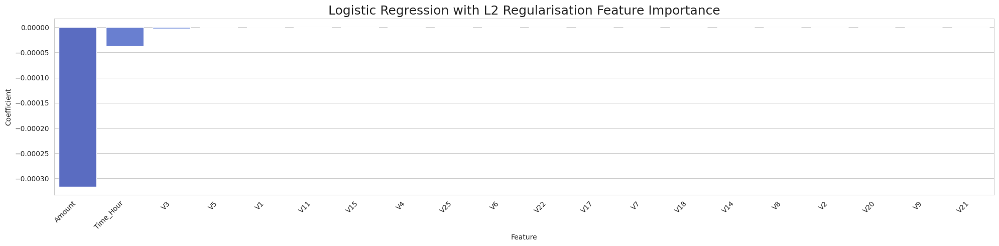

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by absolute coefficient value and select top 20 features
top_n = 20
coefficients_sorted = coefficients.reindex(coefficients['Importance Coefficient'].abs().sort_values(ascending=False).index).head(top_n)

plt.figure(figsize=(20, 5))
sns.barplot(
    x='Feature',
    y='Importance Coefficient',
    data=coefficients_sorted,
    palette='coolwarm'
)
plt.title("Logistic Regression with L2 Regularisation Feature Importance", fontsize=18)
plt.xlabel("Feature")
plt.ylabel("Coefficient")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Its is evident that V4, V11, v5 has + ve imporatnce whereas V14, V12, V10 seems to have -ve impact on the predictaions**


#As the models Oversampling data, take significantly longer time to run.
We will try with undersampling methods


In [105]:
from imblearn.under_sampling import RandomUnderSampler
import pandas as pd

# 1. Remove NaNs from y_train and X_train
print("Number of NaNs in y_train before cleaning:", y_train.isna().sum())

mask = y_train.notna()
X_train_clean = X_train[mask]
y_train_clean = y_train[mask]

print("Number of NaNs in y_train after cleaning:", y_train_clean.isna().sum())

# 2. Apply RandomUnderSampler
RUS = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
X_Under, y_Under = RUS.fit_resample(X_train_clean, y_train_clean)

# Ensure columns from the input are preserved in the DataFrame
X_Under = pd.DataFrame(data=X_Under, columns=X_train_clean.columns)  # safer than 'cols'

# 3. Print resulting shapes
print(f"Resampling complete. Shapes: X_Under={X_Under.shape}, y_Under={y_Under.shape}")

# Optionally, check the class balance after undersampling
print("Class distribution after undersampling:")
print(pd.Series(y_Under).value_counts())

Number of NaNs in y_train before cleaning: 0
Number of NaNs in y_train after cleaning: 0
Resampling complete. Shapes: X_Under=(534, 30), y_Under=(534,)
Class distribution after undersampling:
Class
0.0    356
1.0    178
Name: count, dtype: int64


Logistic Regression with L1 and L2 Regularisation
Max AUC-ROC for L2: 0.6616498974333708
Max AUC-ROC for L1: 0.5
L2 Regularization Parameters
Coefficients: [[-1.61765904e-04  1.19583108e-04 -2.62090651e-04  1.30672602e-04
  -1.07956675e-04 -4.32326885e-05 -1.73892438e-04  5.04902128e-05
  -7.13051026e-05 -1.71166562e-04  1.06737139e-04 -1.94637545e-04
   1.05215731e-06 -2.07407983e-04 -4.06687490e-06 -1.39708809e-04
  -2.26456695e-04 -7.33497088e-05  2.24781344e-05  3.18175627e-06
   3.61772335e-05 -2.76216879e-06 -8.48916625e-06 -1.99147838e-06
  -8.89494849e-07  2.15016733e-07  1.65196582e-05  1.37011170e-06
  -4.92910845e-04 -3.32777407e-04]]
Intercept: [-2.80418617e-05]
CV Scores: {np.float64(1.0): array([[0.71701113, 0.71701113, 0.71701113, 0.72019078, 0.72019078,
        0.72019078, 0.72019078, 0.72019078, 0.72019078, 0.72019078,
        0.72019078, 0.72019078, 0.72019078, 0.72019078, 0.72019078,
        0.72019078, 0.72019078, 0.72019078, 0.72019078, 0.72019078],
       [0.63116

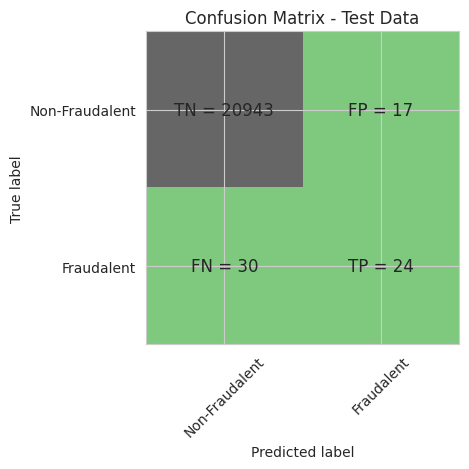

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.59      0.44      0.51        54

    accuracy                           1.00     21014
   macro avg       0.79      0.72      0.75     21014
weighted avg       1.00      1.00      1.00     21014

Accuracy of Logistic model with L1 regularization: 0.99743028457219
Confusion Matrix (L1):


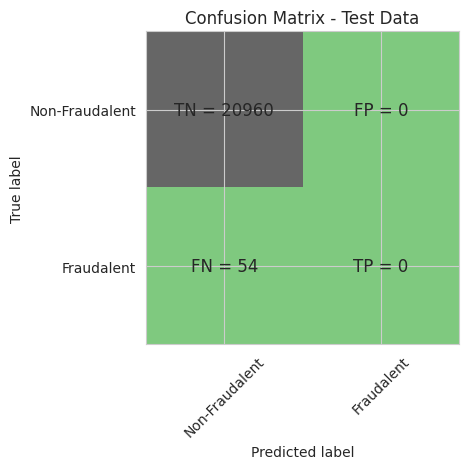

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.00      0.00      0.00        54

    accuracy                           1.00     21014
   macro avg       0.50      0.50      0.50     21014
weighted avg       0.99      1.00      1.00     21014

L2 ROC AUC: 0.6846939496748656
Optimal Threshold (L2): 0.49902409895729716


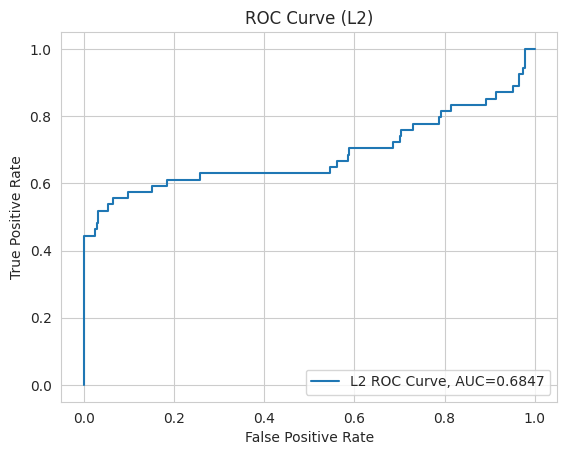

L1 ROC AUC: 0.5
Optimal Threshold (L1): inf


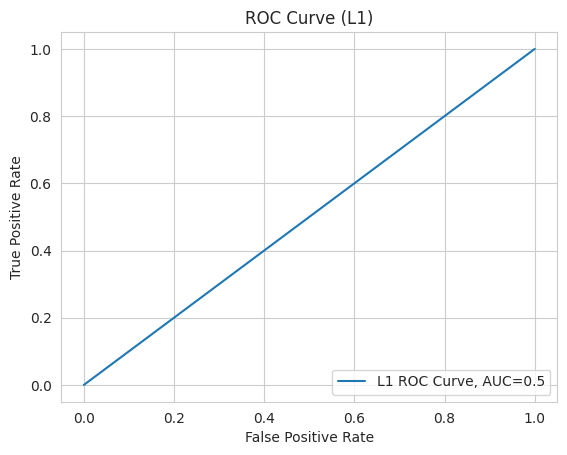

Time Taken by Model: --- 1.41 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9792043399638336
Confusion Matrix:


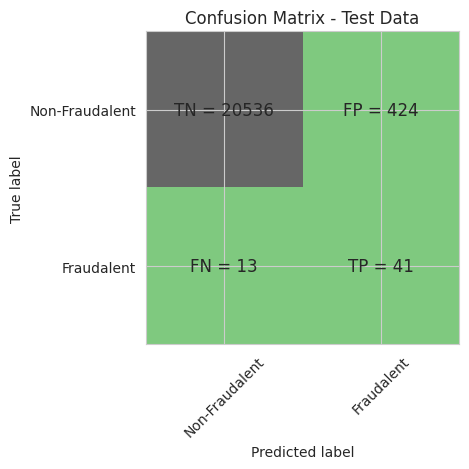

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99     20960
         1.0       0.09      0.76      0.16        54

    accuracy                           0.98     21014
   macro avg       0.54      0.87      0.57     21014
weighted avg       1.00      0.98      0.99     21014

KNN ROC AUC Score: 0.908790111676562
Optimal Threshold: 0.4
ROC AUC (from curve): 90.9%


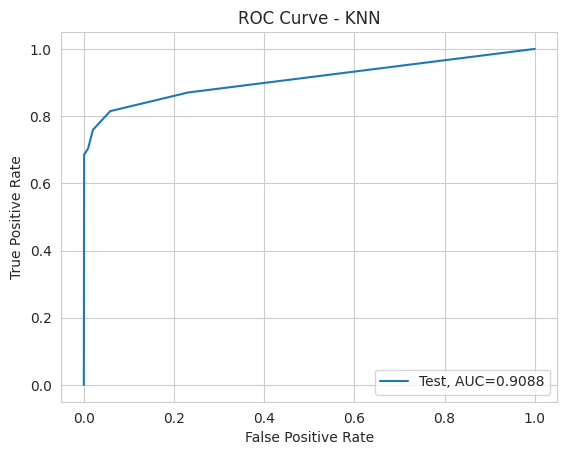

Time Taken by Model: --- 2.82 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.941039307128581
Confusion Matrix:


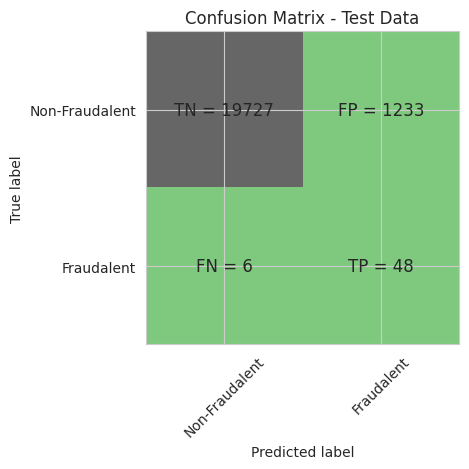

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97     20960
         1.0       0.04      0.89      0.07        54

    accuracy                           0.94     21014
   macro avg       0.52      0.92      0.52     21014
weighted avg       1.00      0.94      0.97     21014

ROC AUC Score: 0.9150312765055131
Optimal Threshold: 1.0
ROC AUC (from curve): 91.5%


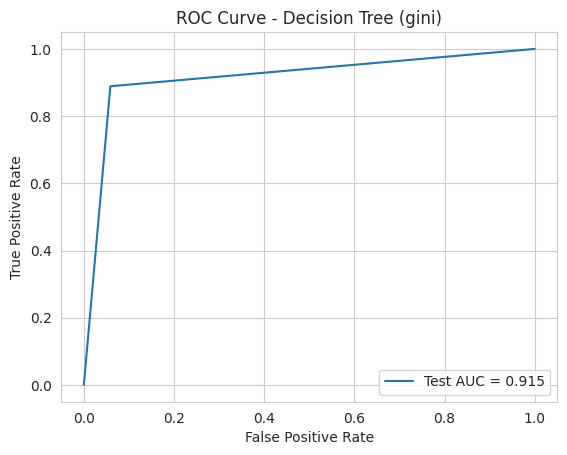


--- Decision Tree (entropy) ---
Accuracy Score: 0.9472256590844199
Confusion Matrix:


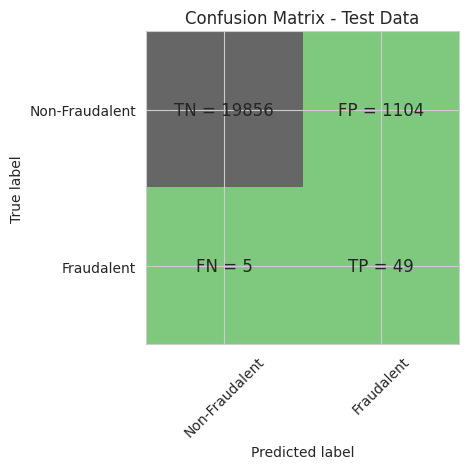

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97     20960
         1.0       0.04      0.91      0.08        54

    accuracy                           0.95     21014
   macro avg       0.52      0.93      0.53     21014
weighted avg       1.00      0.95      0.97     21014

ROC AUC Score: 0.9273678258411083
Optimal Threshold: 1.0
ROC AUC (from curve): 92.7%


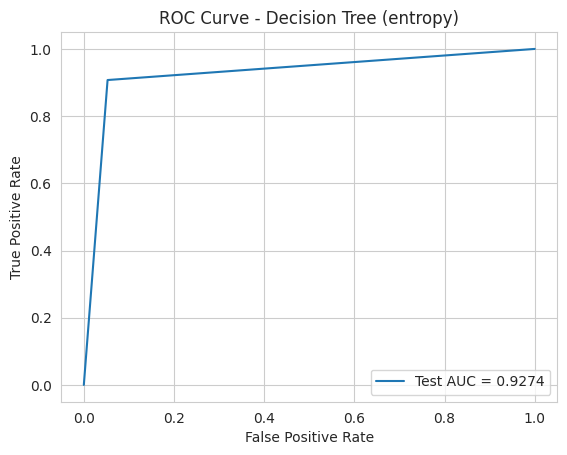

Time Taken by Model: --- 0.61 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9958123155991244
Confusion Matrix:


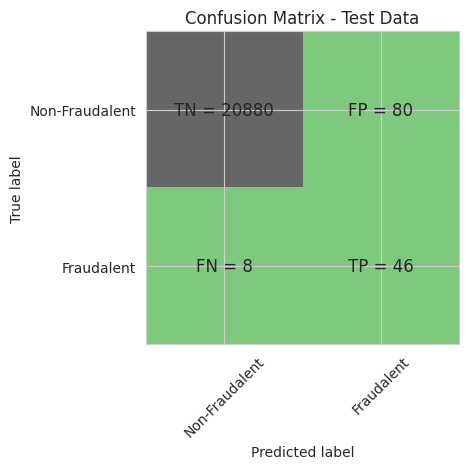

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20960
         1.0       0.37      0.85      0.51        54

    accuracy                           1.00     21014
   macro avg       0.68      0.92      0.75     21014
weighted avg       1.00      1.00      1.00     21014

Random Forest ROC AUC Score: 0.9562583934124966
Optimal Threshold: 0.51
ROC AUC (from curve): 95.6%


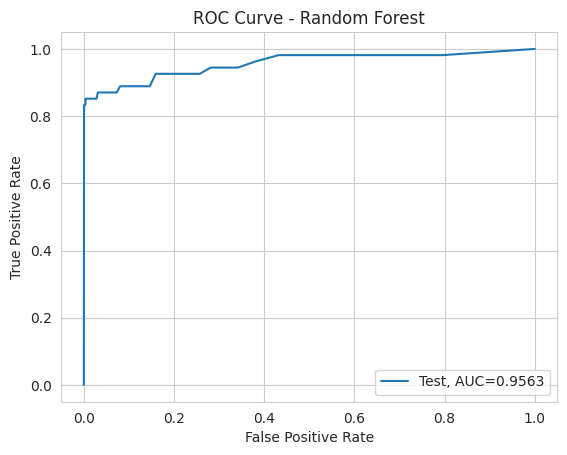

Time Taken by Model: --- 0.95 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9889
Confusion Matrix:


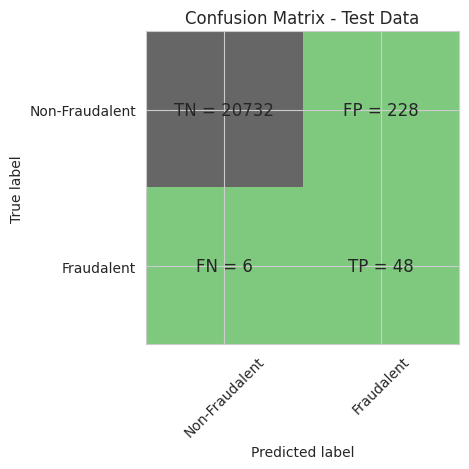

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99     20960
         1.0       0.17      0.89      0.29        54

    accuracy                           0.99     21014
   macro avg       0.59      0.94      0.64     21014
weighted avg       1.00      0.99      0.99     21014

XGBoost ROC AUC Score: 0.9736
XGBoost Optimal Threshold: 0.4467
ROC AUC for Test Dataset: 97.4%


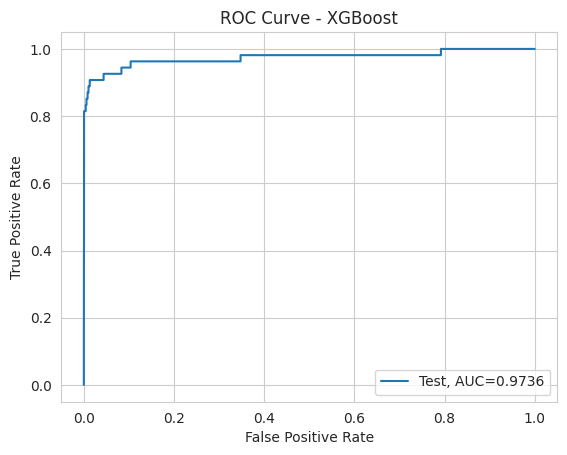

Time Taken by Model: --- 2.13 seconds ---
--------------------------------------------------------------------------------
SVM Model with Sigmoid Kernel
Accuracy Score: 0.6644142000571048
Confusion Matrix:


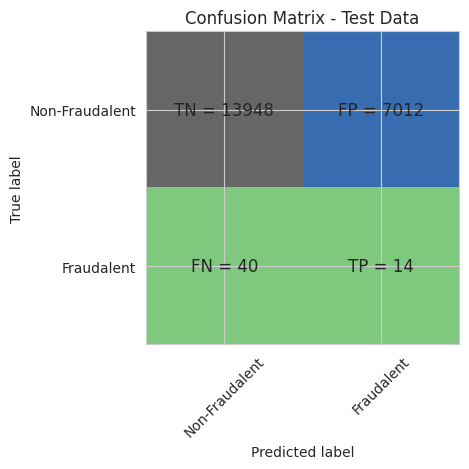

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80     20960
         1.0       0.00      0.26      0.00        54

    accuracy                           0.66     21014
   macro avg       0.50      0.46      0.40     21014
weighted avg       0.99      0.66      0.80     21014

SVM ROC AUC Score: 0.48104679106587506
Optimal Threshold: 0.34897560112528486
ROC AUC (from curve): 48.1%


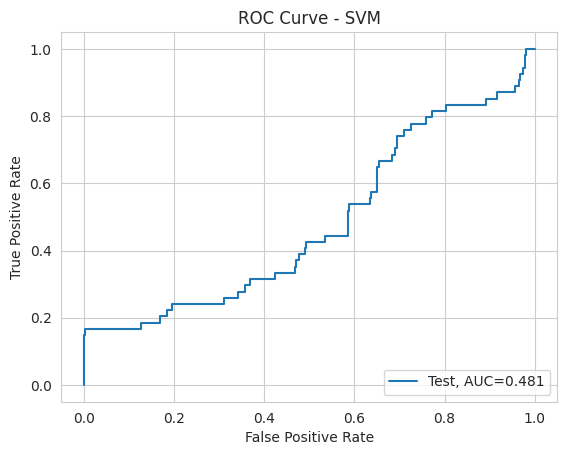

Time Taken by Model: --- 1.10 seconds ---
--------------------------------------------------------------------------------


In [106]:
import time

# Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 and L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(
    df_Results, "Random Undersampling", X_Under, y_Under, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [107]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
5,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
6,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
7,Power Transformer,KNN,0.999429,0.925806,0.200000
8,Power Transformer,Tree Model with gini criteria,0.999096,0.879486,1.000000
9,Power Transformer,Tree Model with entropy criteria,0.999096,0.861016,1.000000


**It seems Undersampling has impoved the XGBoost Results**


## Model building with balancing Classes

##### Perform class balancing with :

- Random Oversampling
- SMOTE
- ADASYN


# Oversampling with RandomOverSampler and StratifiedKFold Cross Validation


**We will use Random Oversampling to handle class imbalance.**

1. First, we will display the class distribution _before_ and _after_ applying Random Oversampling.

2. Then, we will use the oversampled data with **StratifiedKFold cross-validation** to generate train and test datasets.

---

Once we have the train and test datasets, we will feed the data to the following models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. K-Nearest Neighbors (KNN)
4. Decision Tree (Gini criterion)
5. Decision Tree (Entropy criterion)
6. Random Forest
7. XGBoost

> **Note:**  
> We also tried the SVM (Support Vector Machine) model, but due to its high computational requirements, we did not include it in the final analysis.

---

After obtaining results for the above models, we will compare their performance and select the model which provides the best results with the Random Oversampling technique.


In [108]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler
import pandas as pd

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # shuffle for randomness

for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
    print(f'Fold {fold}')

    # Split using iloc for position-based indexing
    X_train = X.iloc[train_index]
    y_train = y.iloc[train_index]
    X_test = X.iloc[test_index]
    y_test = y.iloc[test_index]

    # Apply RandomOverSampler to the training fold only
    ROS = RandomOverSampler(sampling_strategy=0.5, random_state=42)
    X_over, y_over = ROS.fit_resample(X_train, y_train)

    # Convert oversampled matrix back to DataFrame with training columns
    X_over = pd.DataFrame(data=X_over, columns=X_train.columns, index=None)
    y_over = pd.Series(y_over)

    print(f"Oversampled X shape: {X_over.shape}, y shape: {y_over.shape}")
    print(f"Class distribution after oversampling:\n{y_over.value_counts()}")
    print('-'*50)

# After the loop, X_over and y_over only correspond to the last fold.

Fold 1
Oversampled X shape: (125800, 30), y shape: (125800,)
Class distribution after oversampling:
Class
0.0    83867
1.0    41933
Name: count, dtype: int64
--------------------------------------------------
Fold 2
Oversampled X shape: (125800, 30), y shape: (125800,)
Class distribution after oversampling:
Class
0.0    83867
1.0    41933
Name: count, dtype: int64
--------------------------------------------------
Fold 3
Oversampled X shape: (125800, 30), y shape: (125800,)
Class distribution after oversampling:
Class
0.0    83867
1.0    41933
Name: count, dtype: int64
--------------------------------------------------
Fold 4
Oversampled X shape: (125800, 30), y shape: (125800,)
Class distribution after oversampling:
Class
0.0    83867
1.0    41933
Name: count, dtype: int64
--------------------------------------------------
Fold 5
Oversampled X shape: (125802, 30), y shape: (125802,)
Class distribution after oversampling:
Class
0.0    83868
1.0    41934
Name: count, dtype: int64
------

Logistic Regression with L1 and L2 Regularisation
Max AUC-ROC for L2: 0.8303823821817549
Max AUC-ROC for L1: 0.5
L2 Regularization Parameters
Coefficients: [[-4.48688869e-03  3.32088978e-03 -7.47956495e-03  3.91654722e-03
  -3.16798212e-03 -1.33979018e-03 -4.99624299e-03  9.60954003e-04
  -2.34336806e-03 -5.19251157e-03  3.33247504e-03 -5.80713868e-03
  -6.97904833e-05 -6.57628031e-03 -8.76742776e-05 -4.14343741e-03
  -6.94905398e-03 -2.31883970e-03  7.26444143e-04  1.26135945e-04
   1.27133306e-03 -9.71734067e-05  1.90591453e-05 -9.43352275e-05
  -9.37811161e-05  5.04805529e-05  4.34172475e-04  2.10284523e-05
  -5.79118048e-04 -1.01468040e-02]]
Intercept: [-0.00076881]
CV Scores: {np.float64(1.0): array([[0.64099136, 0.64099136, 0.64099136, 0.64099136, 0.64099136,
        0.64099136, 0.64099136, 0.64099136, 0.64099136, 0.64099136,
        0.64099136, 0.64099136, 0.64099136, 0.64099136, 0.64099136,
        0.64099136, 0.64099136, 0.64099136, 0.64099136, 0.64099136],
       [0.63404172,

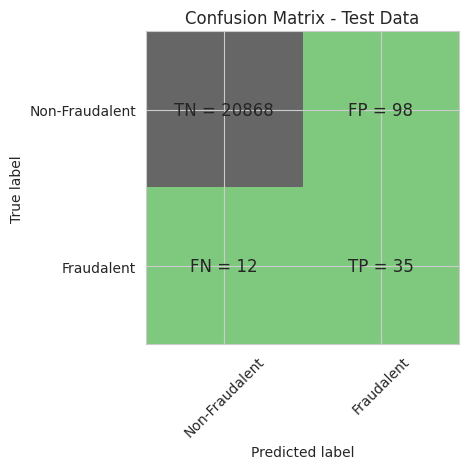

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.26      0.74      0.39        47

    accuracy                           0.99     21013
   macro avg       0.63      0.87      0.69     21013
weighted avg       1.00      0.99      1.00     21013

Accuracy of Logistic model with L1 regularization: 0.997763289392281
Confusion Matrix (L1):


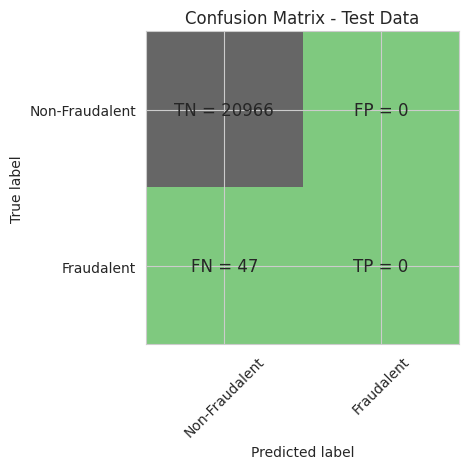

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

L2 ROC AUC: 0.9228091682379373
Optimal Threshold (L2): 0.4848423211961238


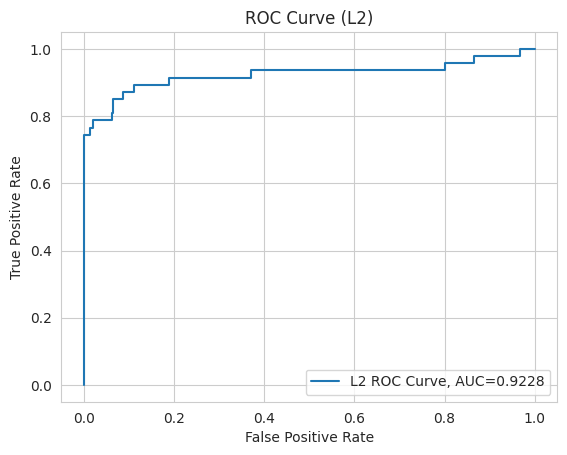

L1 ROC AUC: 0.5
Optimal Threshold (L1): inf


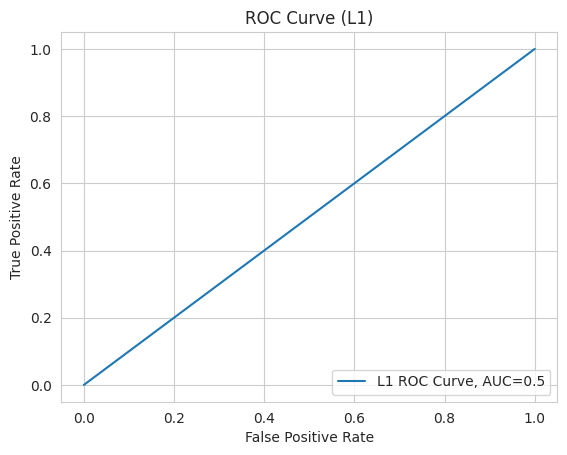

Time Taken by Model: --- 43.74 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9989530290772379
Confusion Matrix:


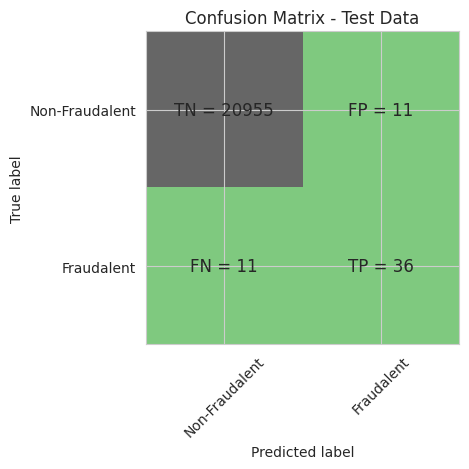

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.77      0.77      0.77        47

    accuracy                           1.00     21013
   macro avg       0.88      0.88      0.88     21013
weighted avg       1.00      1.00      1.00     21013

KNN ROC AUC Score: 0.8935043768938971
Optimal Threshold: 0.4
ROC AUC (from curve): 89.4%


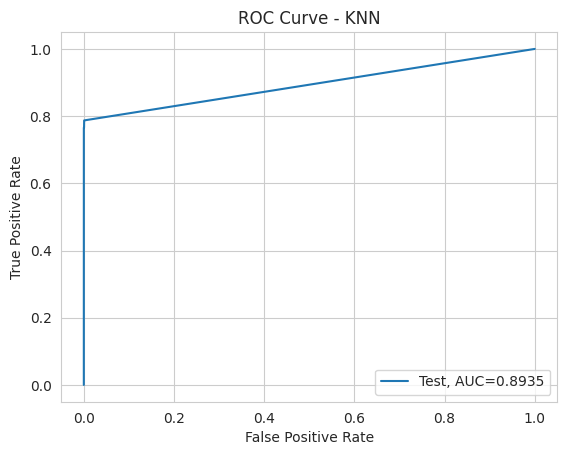

Time Taken by Model: --- 61.89 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9989530290772379
Confusion Matrix:


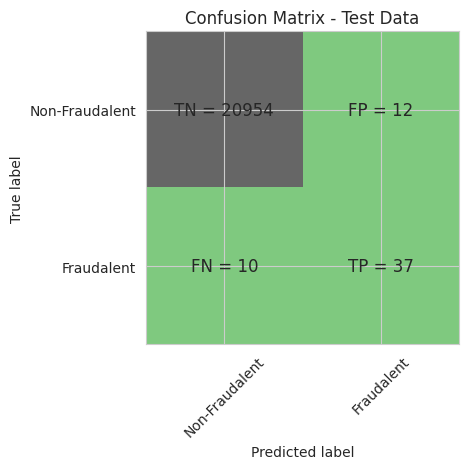

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.76      0.79      0.77        47

    accuracy                           1.00     21013
   macro avg       0.88      0.89      0.89     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8933308436556857
Optimal Threshold: 1.0
ROC AUC (from curve): 89.3%


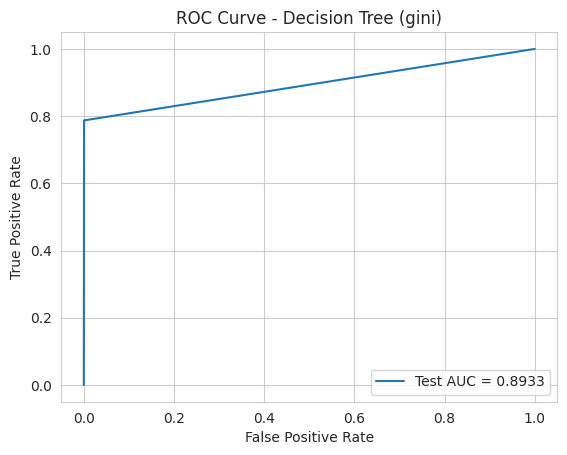


--- Decision Tree (entropy) ---
Accuracy Score: 0.9991433874268311
Confusion Matrix:


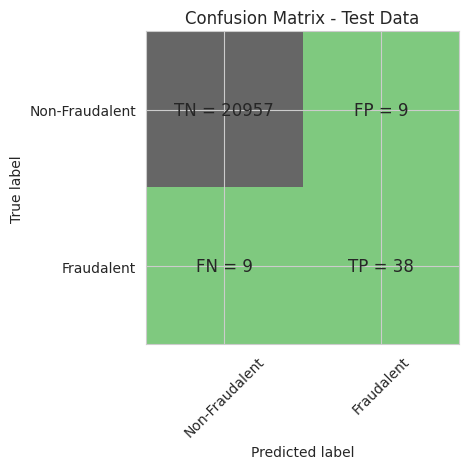

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.81      0.81      0.81        47

    accuracy                           1.00     21013
   macro avg       0.90      0.90      0.90     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.9040406859332537
Optimal Threshold: 1.0
ROC AUC (from curve): 90.4%


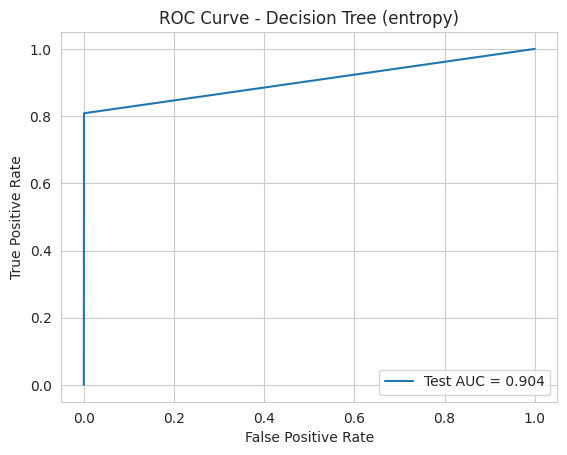

Time Taken by Model: --- 8.82 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9995241041260172
Confusion Matrix:


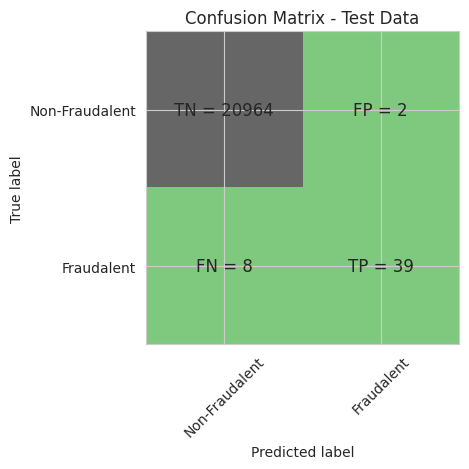

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.95      0.83      0.89        47

    accuracy                           1.00     21013
   macro avg       0.98      0.91      0.94     21013
weighted avg       1.00      1.00      1.00     21013

Random Forest ROC AUC Score: 0.9666988701058045
Optimal Threshold: 0.22
ROC AUC (from curve): 96.7%


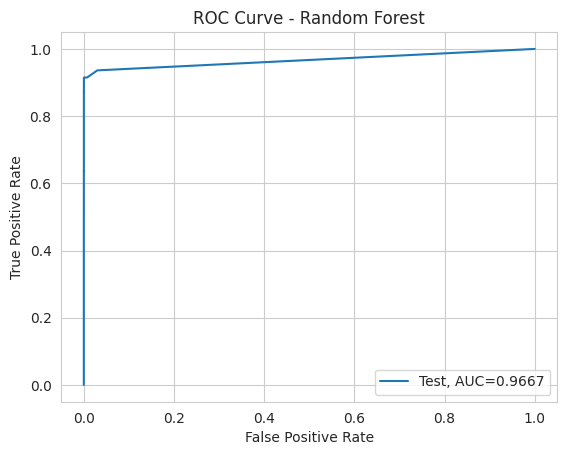

Time Taken by Model: --- 50.75 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9995
Confusion Matrix:


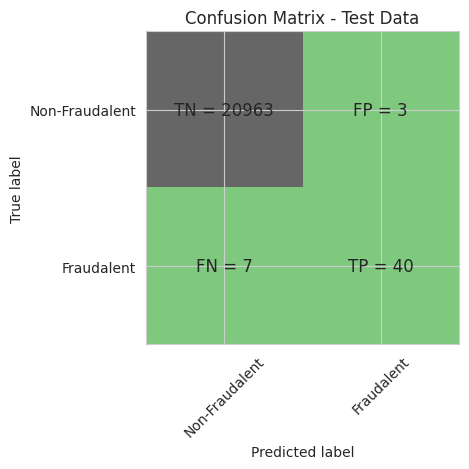

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.93      0.85      0.89        47

    accuracy                           1.00     21013
   macro avg       0.96      0.93      0.94     21013
weighted avg       1.00      1.00      1.00     21013

XGBoost ROC AUC Score: 0.9706
XGBoost Optimal Threshold: 0.0039
ROC AUC for Test Dataset: 97.1%


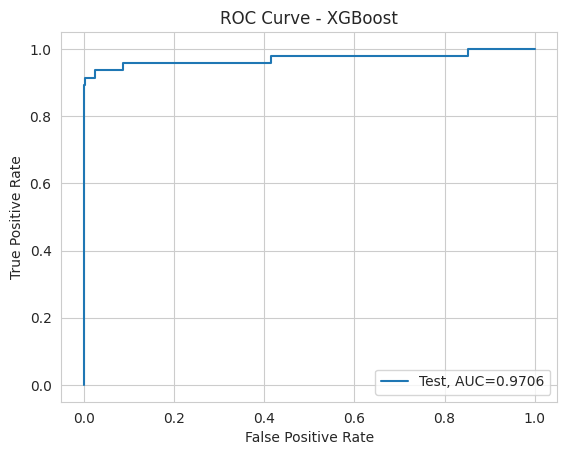

Time Taken by Model: --- 2.56 seconds ---
--------------------------------------------------------------------------------


In [109]:
Data_Imbalance_Handiling = "Random Oversampling with StratifiedKFold CV"

# Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 and L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, Data_Imbalance_Handiling, X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, Data_Imbalance_Handiling, X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, Data_Imbalance_Handiling, X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, Data_Imbalance_Handiling, X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, Data_Imbalance_Handiling, X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [110]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
5,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
6,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
7,Power Transformer,KNN,0.999429,0.925806,0.200000
8,Power Transformer,Tree Model with gini criteria,0.999096,0.879486,1.000000
9,Power Transformer,Tree Model with entropy criteria,0.999096,0.861016,1.000000


## Results for Random Oversampling:

**Random Oversampling seems to have +ve change in prediction for XGBoost**
Looking at Accuracy and ROC value we have XGBoost which has provided best results for SMOTE oversampling technique


### Similarly explore other algorithms on balanced dataset by building models like:

- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost


# Oversampling with SMOTE Oversamplng


**We will use the SMOTE Oversampling method to handle class imbalance:**

- **Display class distribution** before and after applying SMOTE Oversampling.
- **Use StratifiedKFold cross-validation** with the oversampled data to generate train and test datasets.
- **Train and evaluate the following models:**
  1. Logistic Regression with L2 Regularisation
  2. Logistic Regression with L1 Regularisation
  3. KNN (K-Nearest Neighbors)
  4. Decision Tree (Gini criterion)
  5. Decision Tree (Entropy criterion)
  6. Random Forest
  7. XGBoost
- _Note: We attempted to use the SVM (Support Vector Machine) model, but due to its high computational requirements, it was excluded from this comparison._
- **Compare the results** for all models and select the one that provides the best performance with the SMOTE oversampling technique.


### Print the class distribution after applying SMOTE


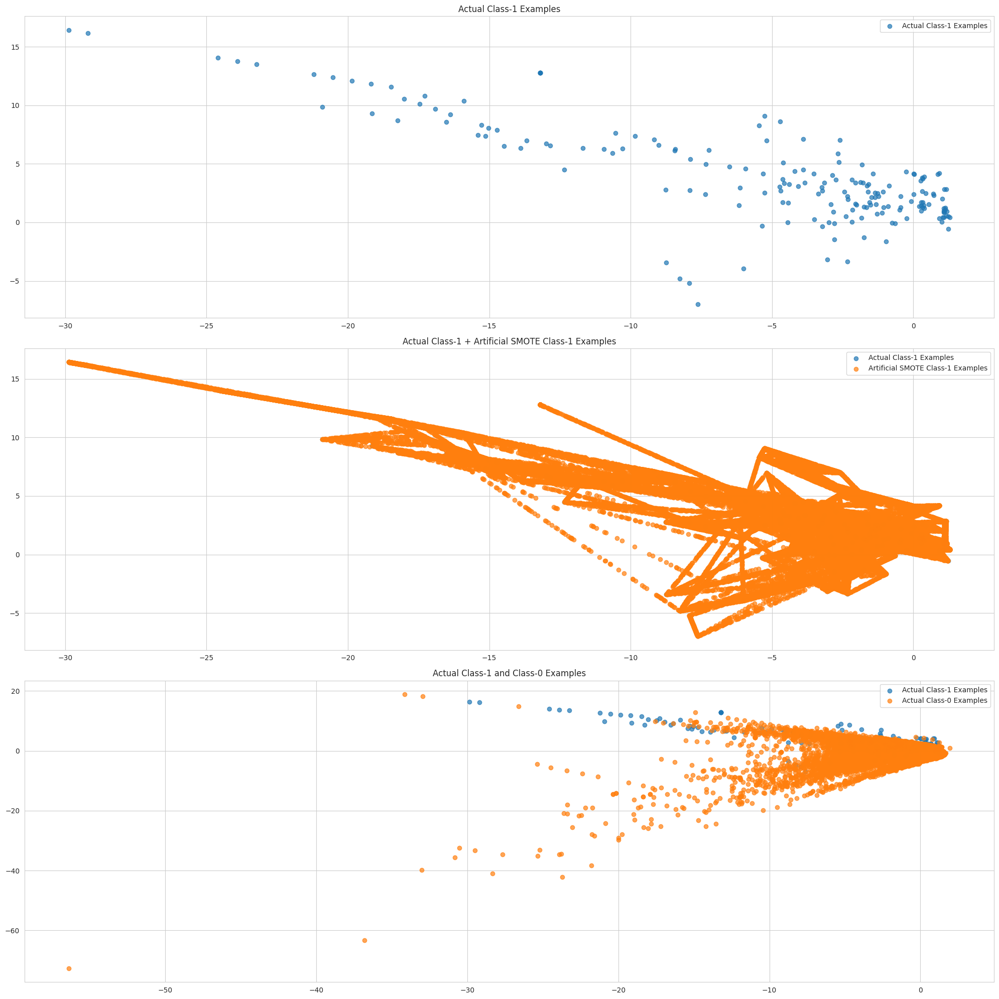

In [111]:
from imblearn.over_sampling import SMOTE
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# --- SMOTE Oversampling ---
# Initialize SMOTE
smote = SMOTE(random_state=0)

# Apply SMOTE to resample the training data
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Convert back to DataFrame for convenience
X_train_smote_df = pd.DataFrame(data=X_train_smote, columns=cols)

# Extract only the synthetic minority samples added by SMOTE
n_original = X_train.shape[0]
X_train_smote_only = X_train_smote_df.iloc[n_original:]

# Separate actual class 1 and class 0 examples for plotting
X_train_1 = X_train[y_train == 1].values
X_train_0 = X_train[y_train == 0].values

# --- Plotting ---
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

# 1) Actual Class-1 examples only
plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.legend()
plt.title("Actual Class-1 Examples")

# 2) Actual Class-1 + Artificial SMOTE Class-1 examples
plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.scatter(X_train_smote_only.values[:, 0], X_train_smote_only.values[:, 1],
            label='Artificial SMOTE Class-1 Examples', alpha=0.7)
plt.legend()
plt.title("Actual Class-1 + Artificial SMOTE Class-1 Examples")

# 3) Actual Class-1 and Actual Class-0 examples
plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.scatter(X_train_0[:, 0], X_train_0[:, 1], label='Actual Class-0 Examples', alpha=0.7)
plt.legend()
plt.title("Actual Class-1 and Class-0 Examples")

plt.tight_layout()
plt.show()

In [112]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
import pandas as pd

# Set up Stratified K-Fold (shuffle for better splits, random_state for reproducibility)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
    print(f'Fold {fold}')

    # Use iloc for position-based indexing
    X_train = X.iloc[train_index]
    y_train = y.iloc[train_index]
    X_test = X.iloc[test_index]
    y_test = y.iloc[test_index]

    # Apply SMOTE to training data only
    smote = SMOTE(random_state=0)
    X_train_Smote, y_train_Smote = smote.fit_resample(X_train, y_train)

    # Convert the SMOTE output to a DataFrame with original column names
    X_train_Smote = pd.DataFrame(data=X_train_Smote, columns=X_train.columns)

    print(f"SMOTE-Resampled Training Shape: {X_train_Smote.shape}, {y_train_Smote.shape}")
    print(f"Class distribution after SMOTE:\n{pd.Series(y_train_Smote).value_counts()}")
    print('-'*50)

Fold 1
SMOTE-Resampled Training Shape: (167734, 30), (167734,)
Class distribution after SMOTE:
Class
0.0    83867
1.0    83867
Name: count, dtype: int64
--------------------------------------------------
Fold 2
SMOTE-Resampled Training Shape: (167734, 30), (167734,)
Class distribution after SMOTE:
Class
0.0    83867
1.0    83867
Name: count, dtype: int64
--------------------------------------------------
Fold 3
SMOTE-Resampled Training Shape: (167734, 30), (167734,)
Class distribution after SMOTE:
Class
0.0    83867
1.0    83867
Name: count, dtype: int64
--------------------------------------------------
Fold 4
SMOTE-Resampled Training Shape: (167734, 30), (167734,)
Class distribution after SMOTE:
Class
0.0    83867
1.0    83867
Name: count, dtype: int64
--------------------------------------------------
Fold 5
SMOTE-Resampled Training Shape: (167736, 30), (167736,)
Class distribution after SMOTE:
Class
0.0    83868
1.0    83868
Name: count, dtype: int64
-------------------------------

Logistic Regression with L1 And L2 Regularisation
Max AUC-ROC for L2: 0.5
Max AUC-ROC for L1: 0.5
L2 Regularization Parameters
Coefficients: [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
Intercept: [0.]
CV Scores: {np.float64(1.0): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5

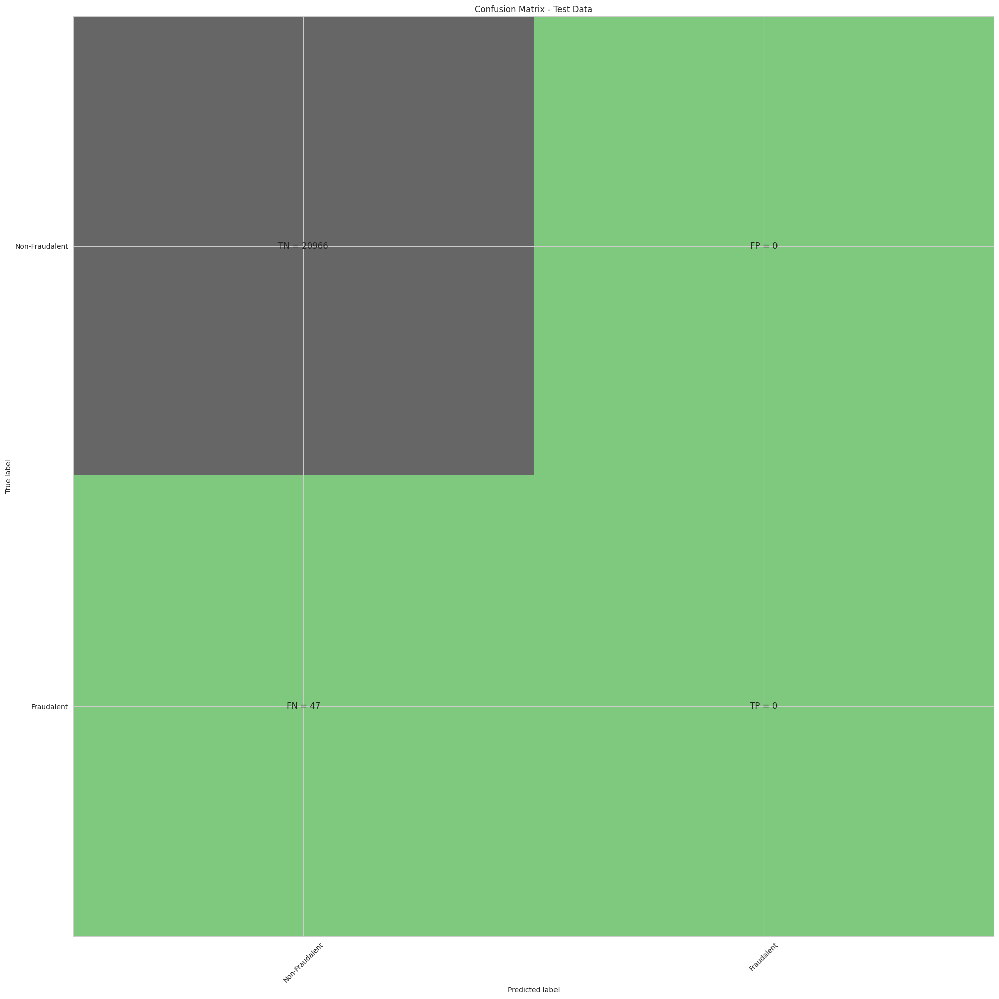

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

Accuracy of Logistic model with L1 regularization: 0.997763289392281
Confusion Matrix (L1):


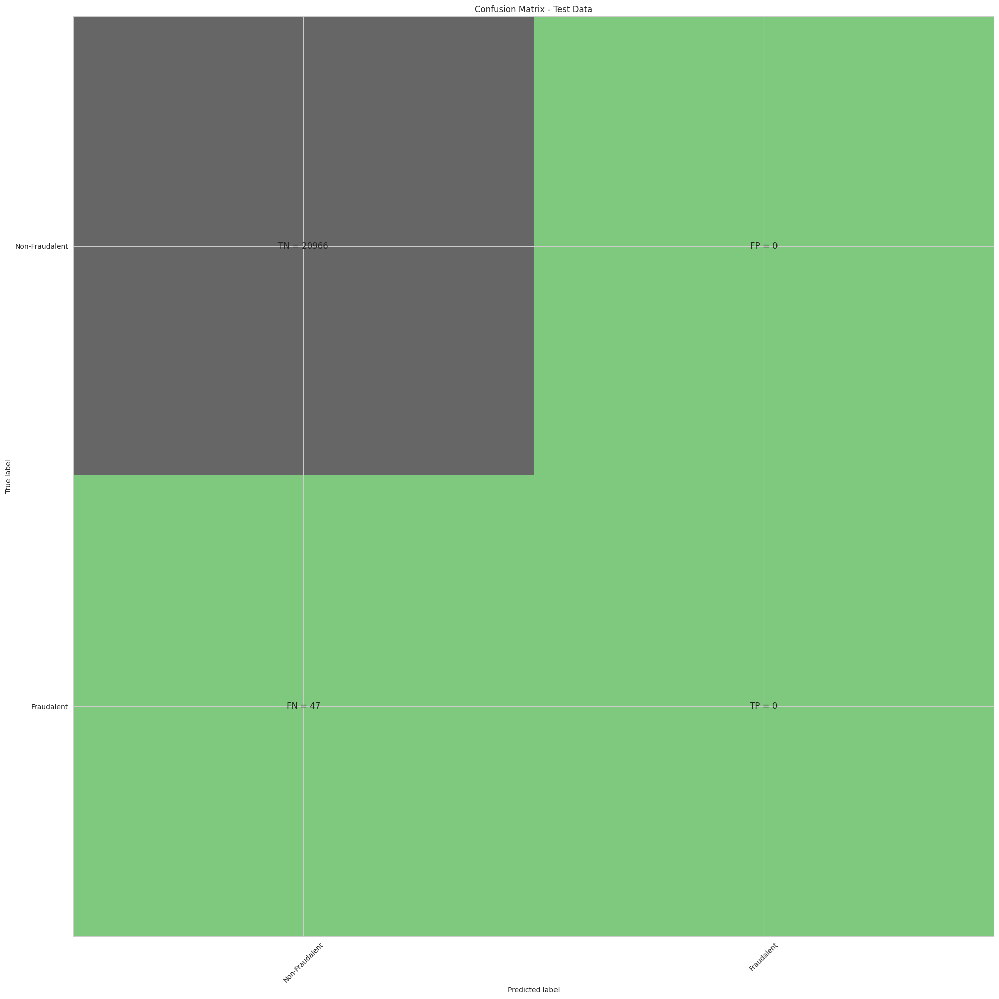

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

L2 ROC AUC: 0.5
Optimal Threshold (L2): inf


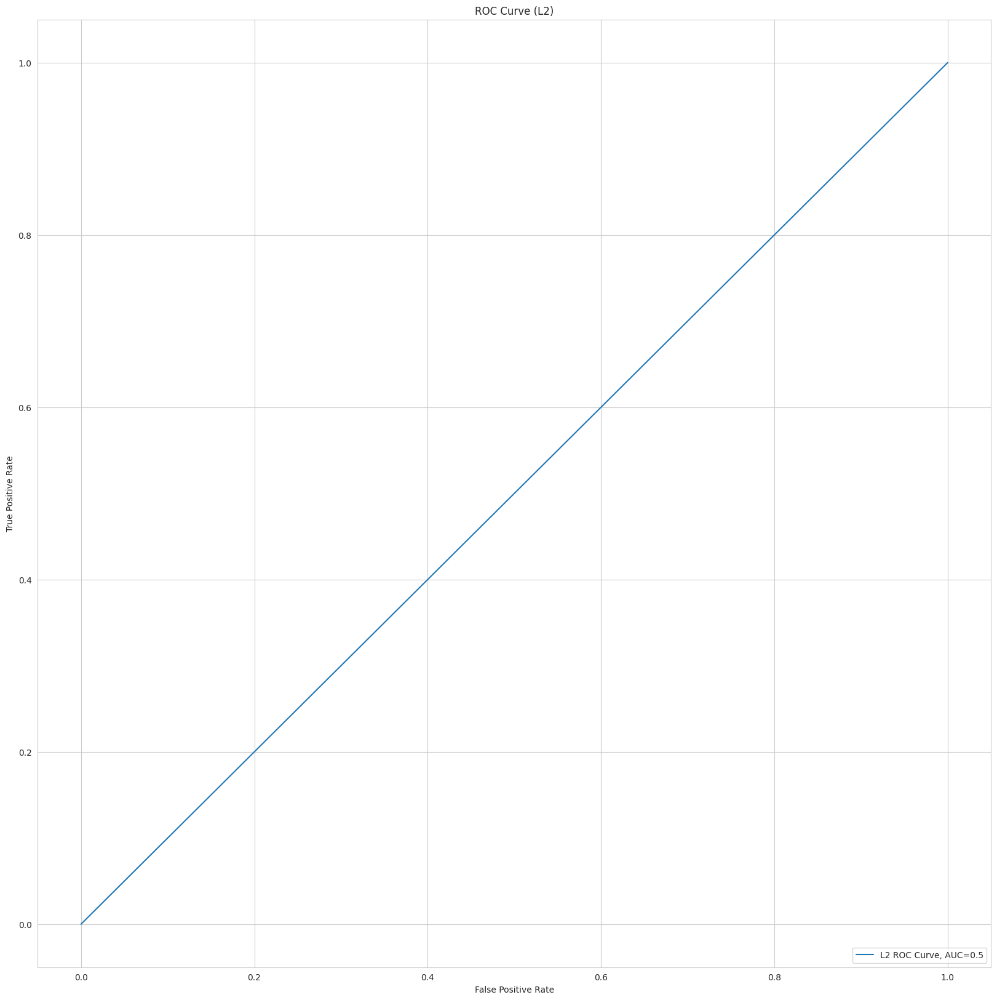

L1 ROC AUC: 0.5
Optimal Threshold (L1): inf


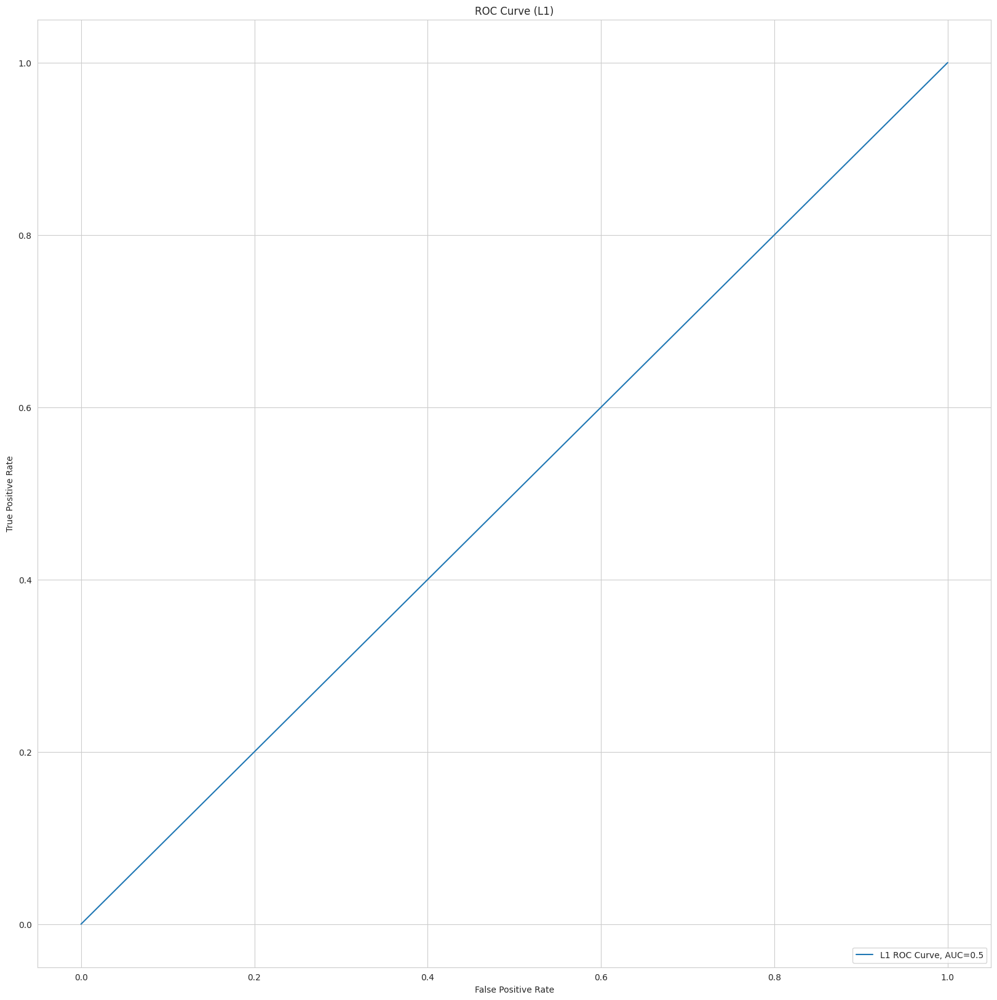

Time Taken by Model: --- 59.69 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.996050064245943
Confusion Matrix:


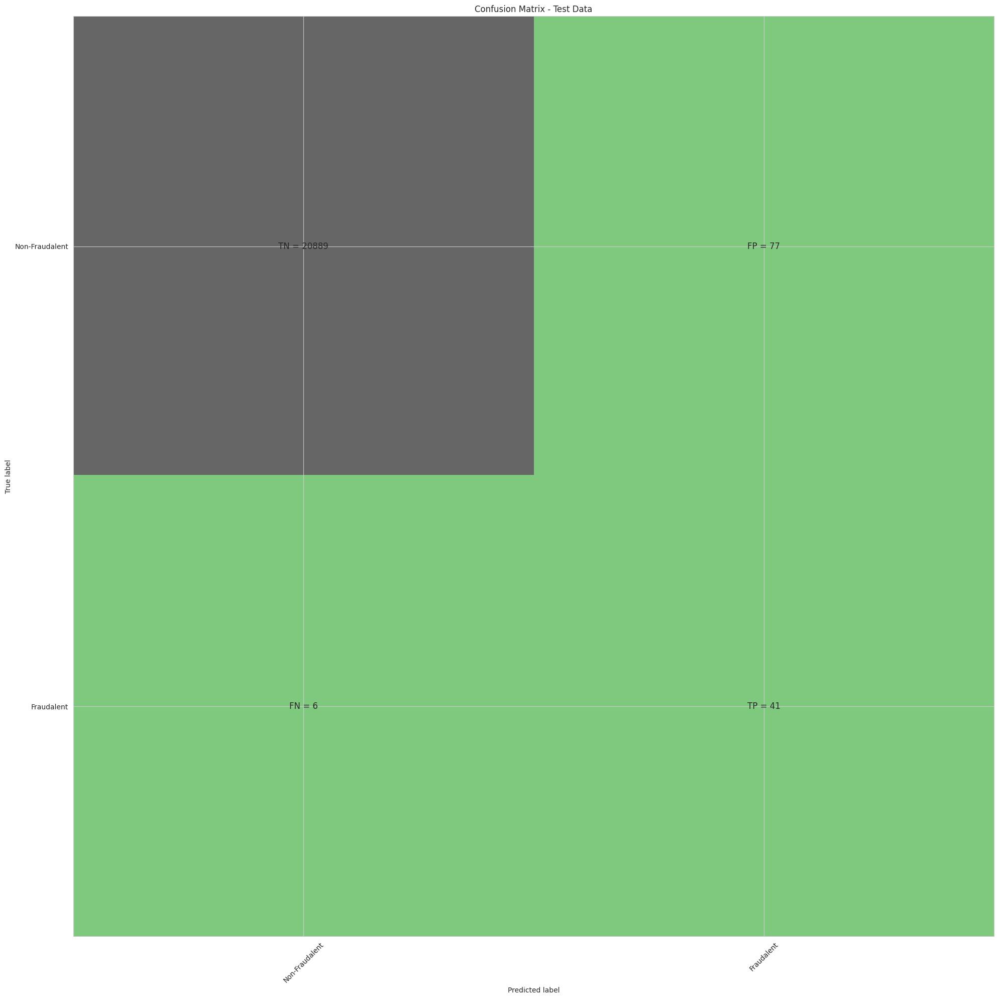

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.35      0.87      0.50        47

    accuracy                           1.00     21013
   macro avg       0.67      0.93      0.75     21013
weighted avg       1.00      1.00      1.00     21013

KNN ROC AUC Score: 0.9352355688338363
Optimal Threshold: 0.8
ROC AUC (from curve): 93.5%


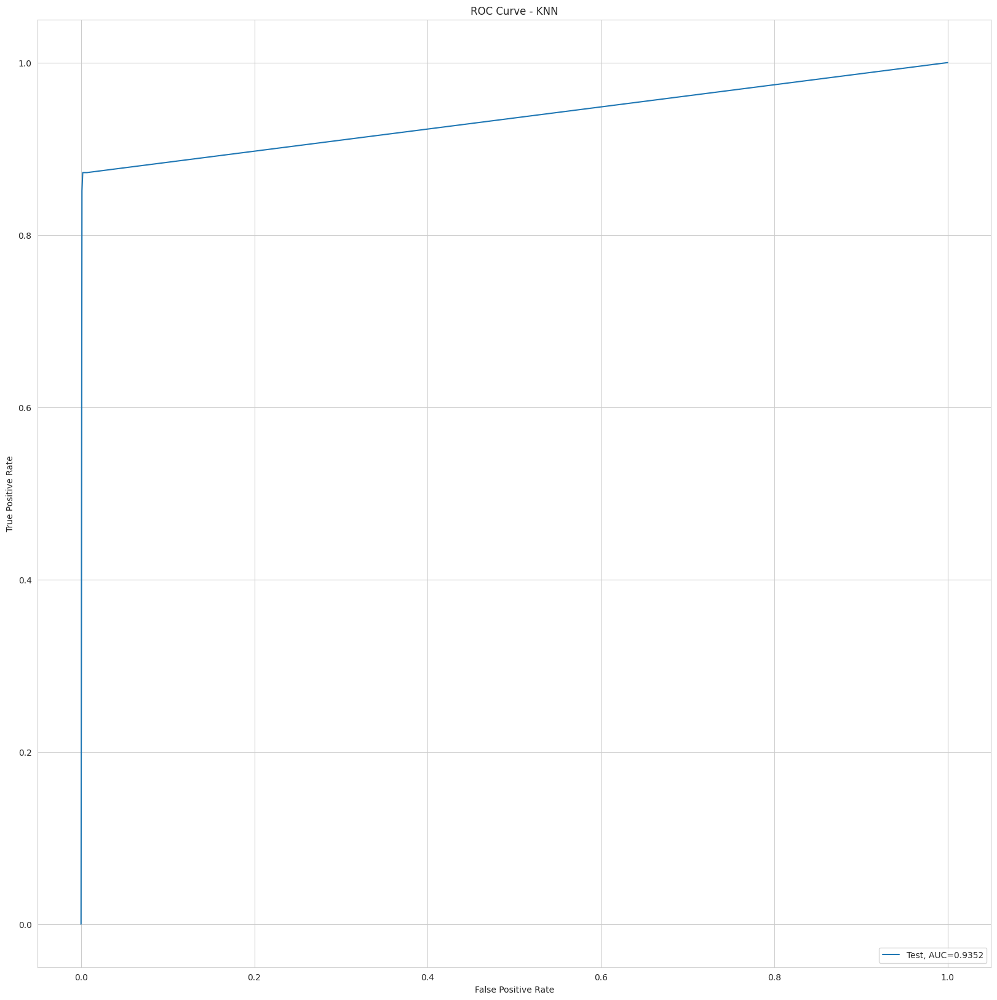

Time Taken by Model: --- 77.91 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9980488269166706
Confusion Matrix:


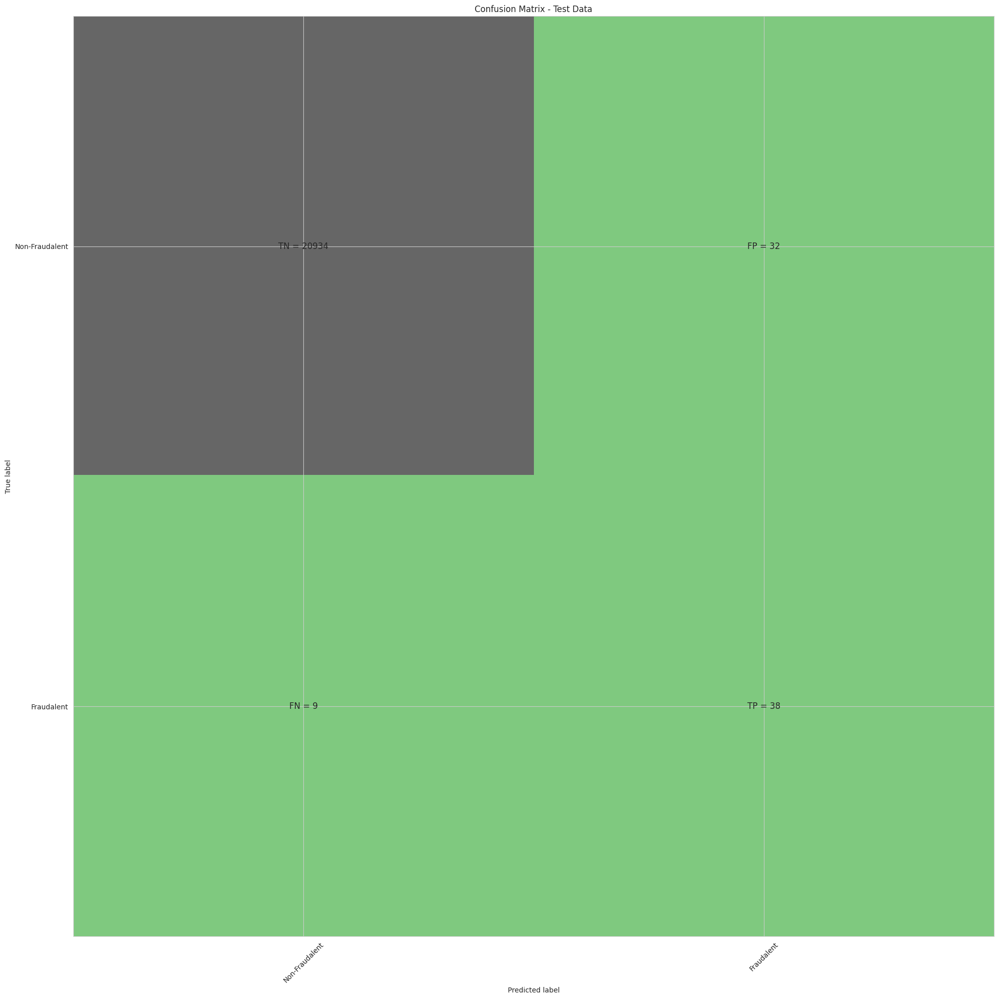

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.54      0.81      0.65        47

    accuracy                           1.00     21013
   macro avg       0.77      0.90      0.82     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.9034921788265093
Optimal Threshold: 1.0
ROC AUC (from curve): 90.3%


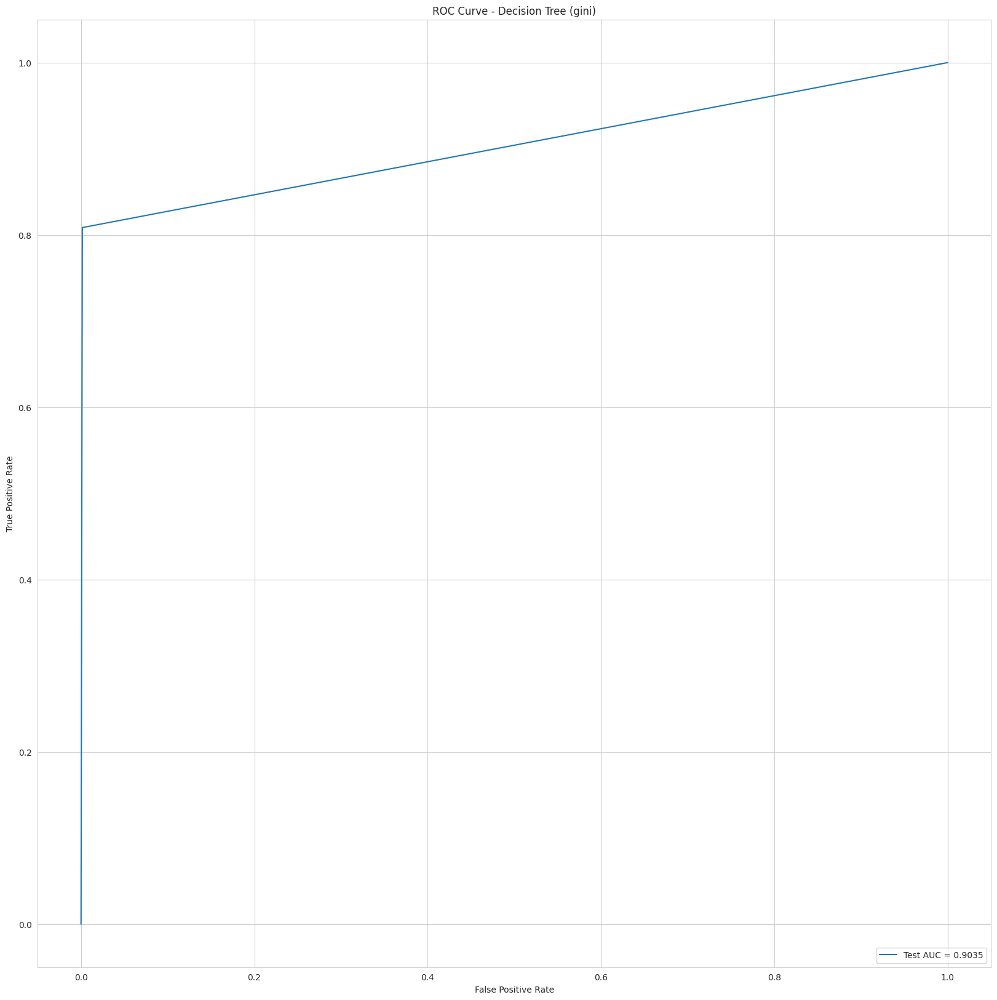


--- Decision Tree (entropy) ---
Accuracy Score: 0.9985247227906534
Confusion Matrix:


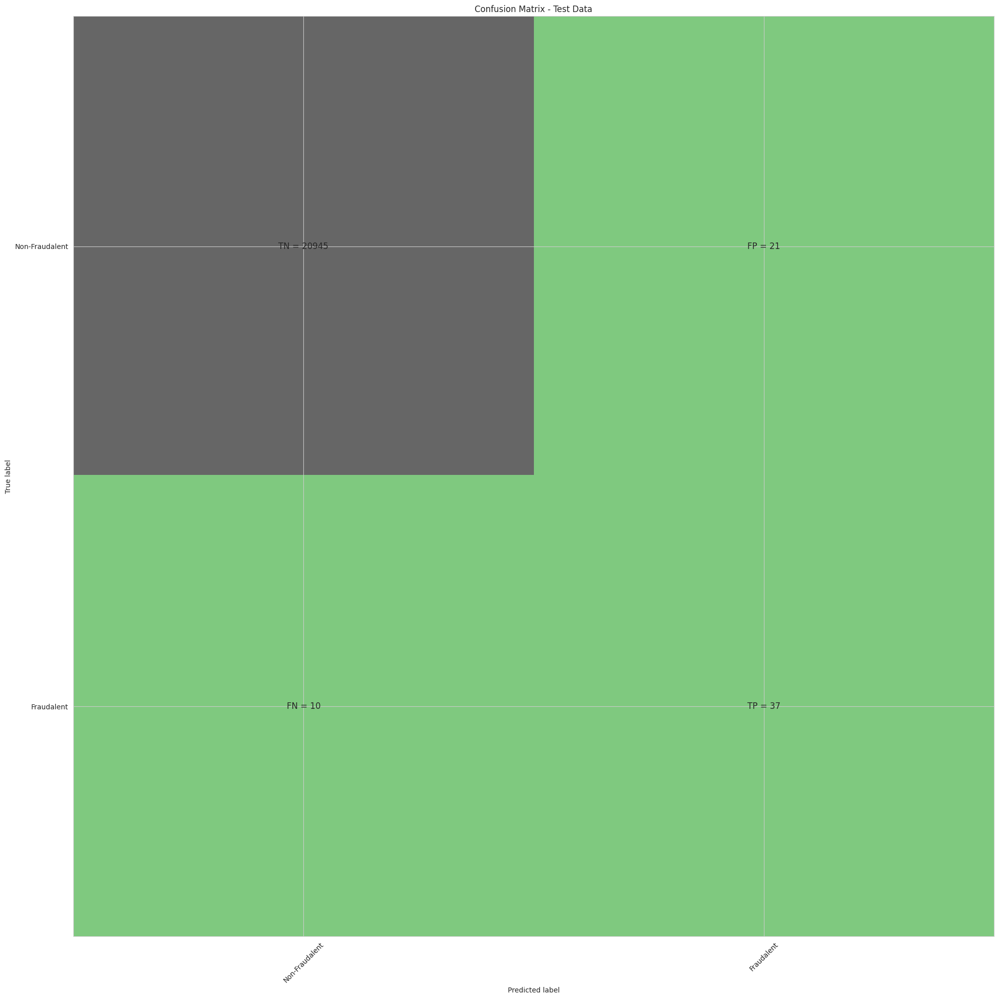

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.64      0.79      0.70        47

    accuracy                           1.00     21013
   macro avg       0.82      0.89      0.85     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8931162104400031
Optimal Threshold: 1.0
ROC AUC (from curve): 89.3%


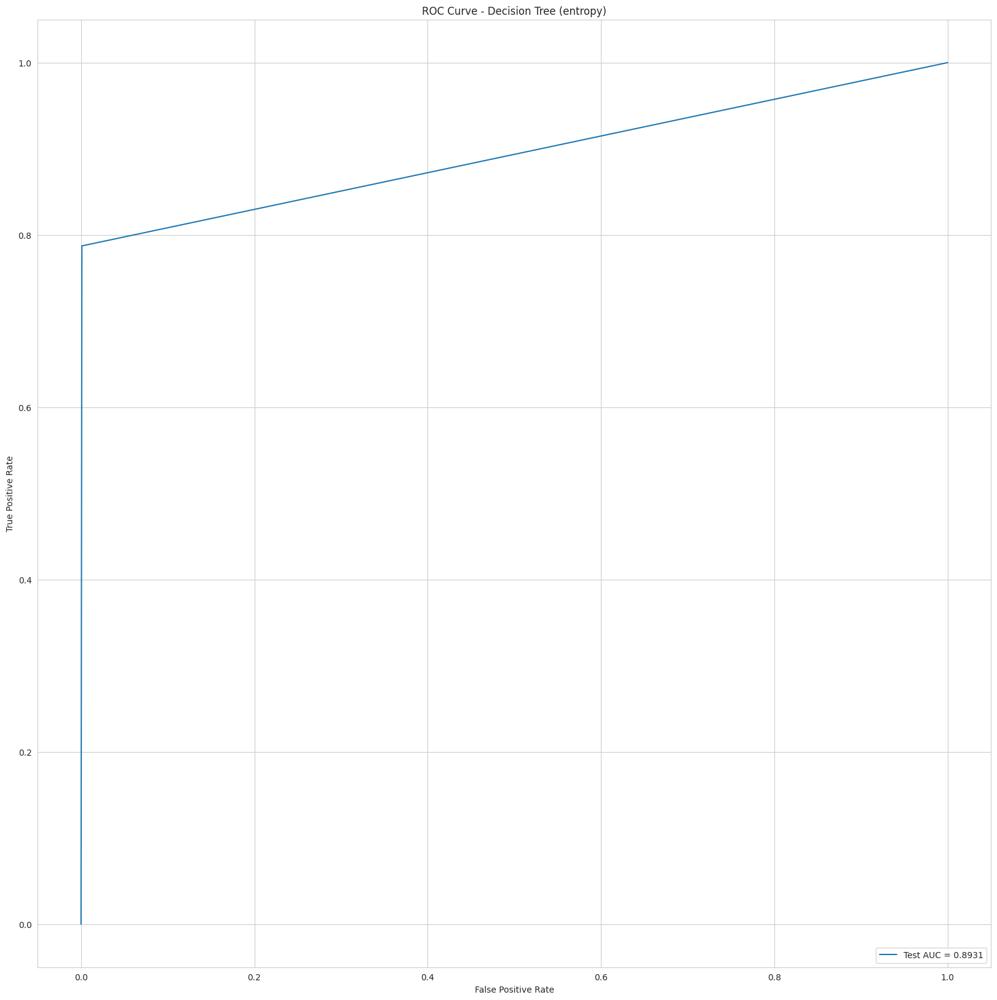

Time Taken by Model: --- 24.59 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9995241041260172
Confusion Matrix:


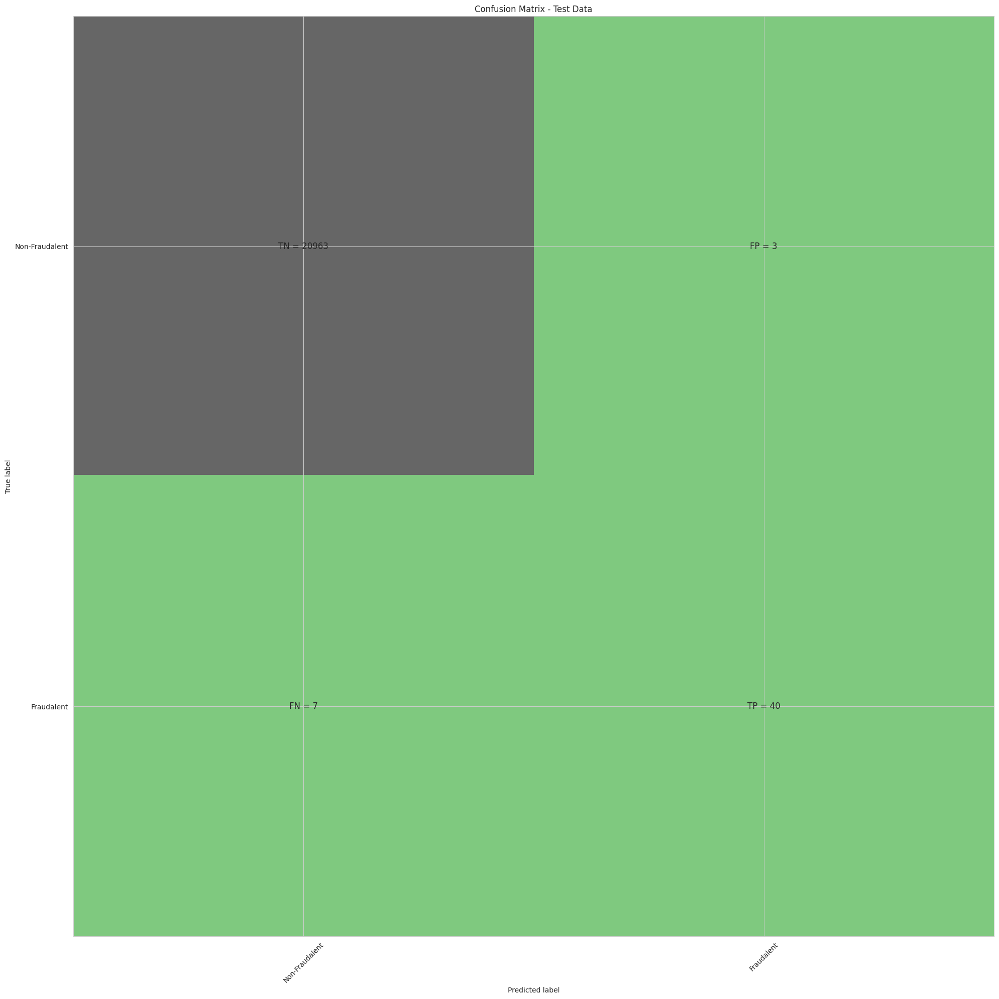

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.93      0.85      0.89        47

    accuracy                           1.00     21013
   macro avg       0.96      0.93      0.94     21013
weighted avg       1.00      1.00      1.00     21013

Random Forest ROC AUC Score: 0.9626908611916761
Optimal Threshold: 0.3
ROC AUC (from curve): 96.3%


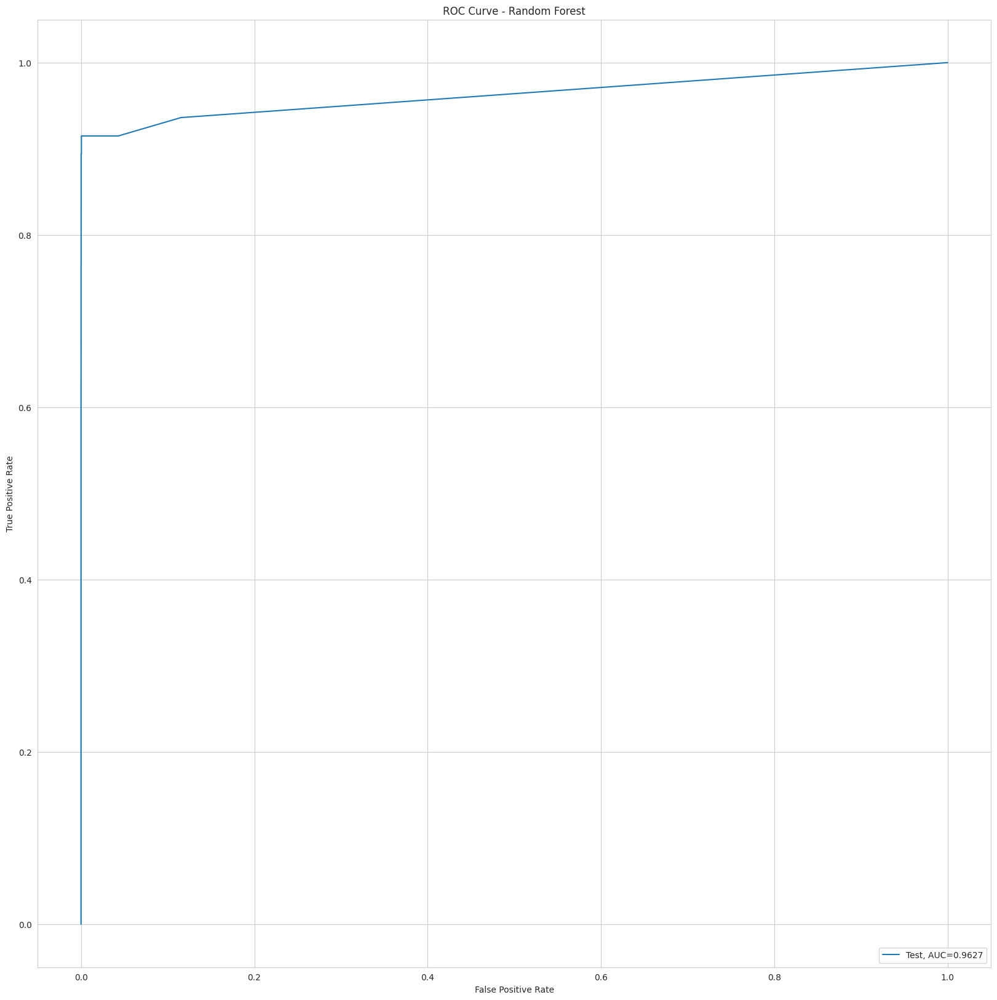

Time Taken by Model: --- 131.72 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9996
Confusion Matrix:


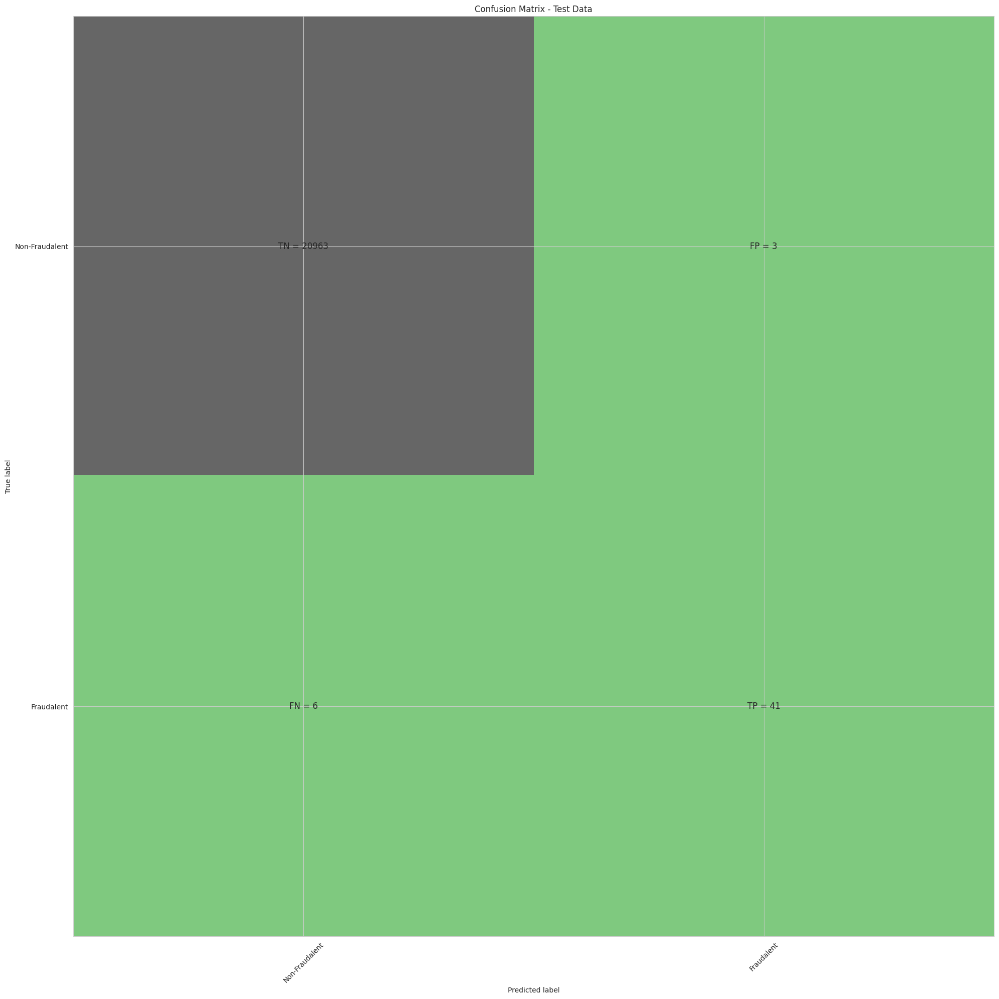

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.93      0.87      0.90        47

    accuracy                           1.00     21013
   macro avg       0.97      0.94      0.95     21013
weighted avg       1.00      1.00      1.00     21013

XGBoost ROC AUC Score: 0.9617
XGBoost Optimal Threshold: 0.0001
ROC AUC for Test Dataset: 96.2%


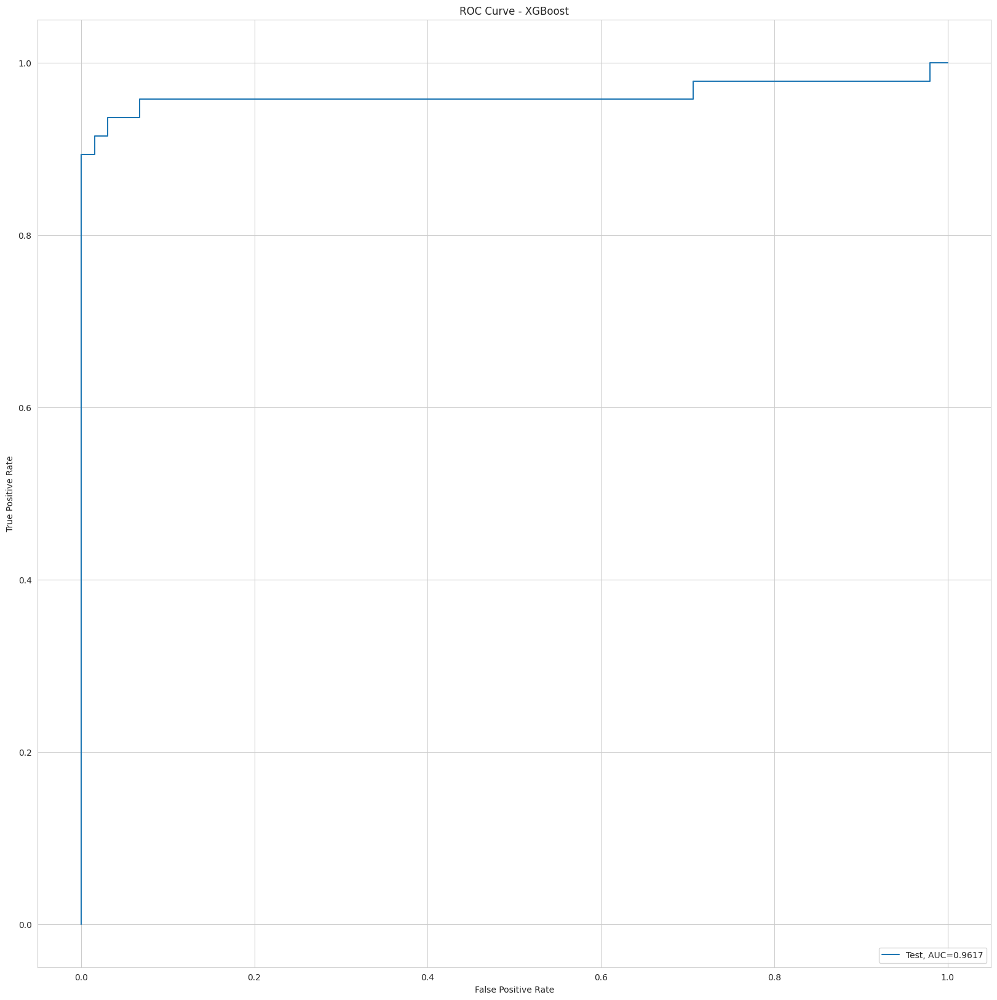

Time Taken by Model: --- 4.44 seconds ---
--------------------------------------------------------------------------------


In [113]:
Data_Imbalance_Handiling = "SMOTE Oversampling with StratifiedKFold CV"

# Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_Smote, y_train_Smote, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_Smote, y_train_Smote, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_Smote, y_train_Smote, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_Smote, y_train_Smote, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_Smote, y_train_Smote, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

##### Build models on other algorithms to see the better performing on SMOTE


In [114]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
5,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
6,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
7,Power Transformer,KNN,0.999429,0.925806,0.200000
8,Power Transformer,Tree Model with gini criteria,0.999096,0.879486,1.000000
9,Power Transformer,Tree Model with entropy criteria,0.999096,0.861016,1.000000


## Results for SMOTE Oversampling:

Looking at Accuracy and ROC value we have XGBoost which has provided best results for SMOTE oversampling technique


# Oversampling with ADASYN Oversampling


**We will use the ADASYN Oversampling method to handle class imbalance**

- First, we will display the class distribution **before and after applying ADASYN oversampling**.
- Then, we will use the **oversampled data with StratifiedKFold cross-validation** to generate train and test datasets.

Once we have the train and test datasets, we will train and evaluate the following models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. KNN (K-Nearest Neighbors)
4. Decision Tree model with Gini criterion
5. Decision Tree model with Entropy criterion
6. Random Forest
7. XGBoost

- We also attempted to use the SVM (Support Vector Machine) model, but due to its high computational requirements, we decided not to include it.

- After obtaining results for all the above models, we will **compare their performances** and select the model that provides the best results with the ADASYN oversampling technique.


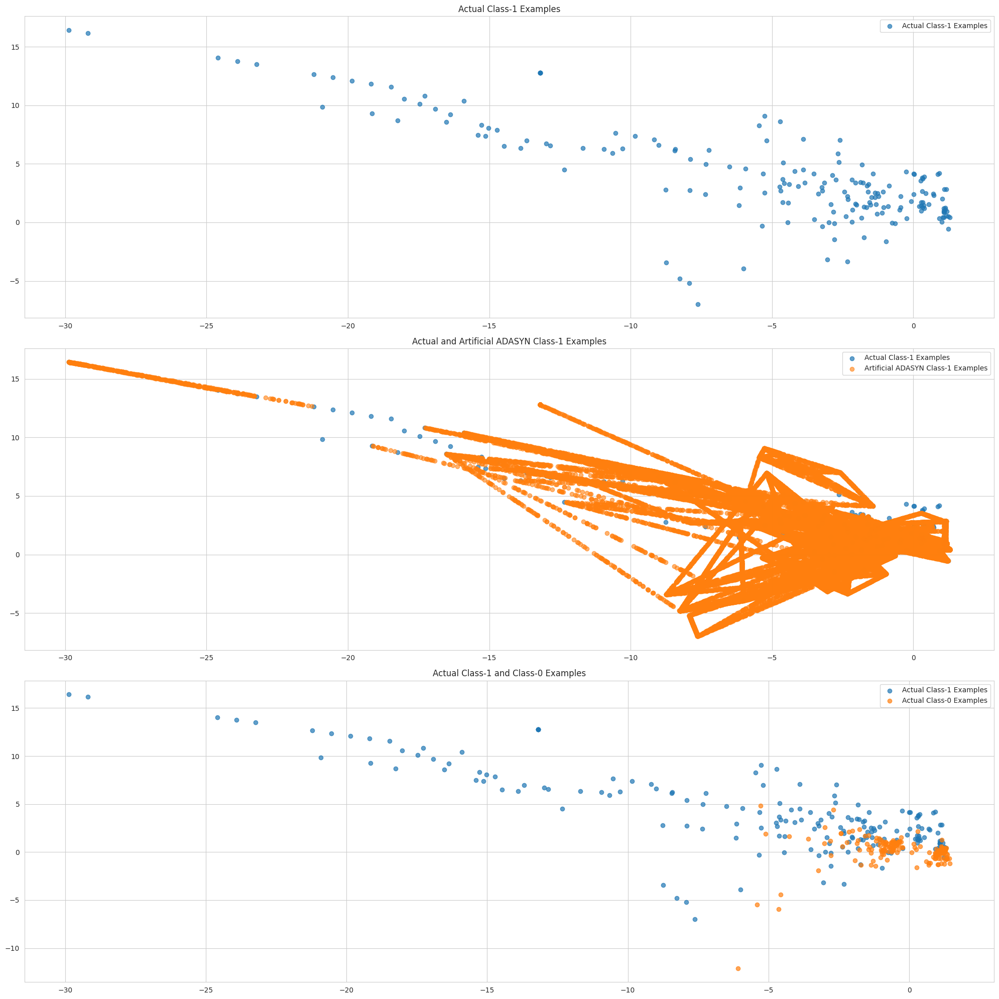

In [115]:
import matplotlib.pyplot as plt
import numpy as np
from imblearn.over_sampling import ADASYN
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# --- ADASYN Oversampling ---
# Initialize ADASYN
adasyn = ADASYN(random_state=0)

# Apply ADASYN to resample the training data
X_train_ADASYN, y_train_ADASYN = adasyn.fit_resample(X_train, y_train)

# Extract only the synthetic minority samples added by ADASYN
n_original = X_train.shape[0]
X_train_adasyn_1 = X_train_ADASYN[n_original:]

# Convert to numpy array if still DataFrame
if hasattr(X_train_adasyn_1, 'to_numpy'):
    X_train_adasyn_1 = X_train_adasyn_1.to_numpy()

# Convert original training data to numpy arrays if needed
X_train_np = X_train.to_numpy() if hasattr(X_train, 'to_numpy') else X_train
y_train_np = y_train.to_numpy() if hasattr(y_train, 'to_numpy') else y_train

# Separate actual class-1 and class-0 examples
X_train_1 = X_train_np[y_train_np == 1.0]
X_train_0 = X_train_np[y_train_np == 0.0]

# --- Plotting ---
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

# 1) Actual Class-1 examples only
plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.legend()
plt.title('Actual Class-1 Examples')

# 2) Actual + Artificial ADASYN Class-1 examples
plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.scatter(X_train_adasyn_1[:, 0], X_train_adasyn_1[:, 1],
            label='Artificial ADASYN Class-1 Examples', alpha=0.6)
plt.legend()
plt.title('Actual and Artificial ADASYN Class-1 Examples')

# 3) Actual Class-1 and Class-0 examples
plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples', alpha=0.7)
plt.scatter(X_train_0[:X_train_1.shape[0], 0],
            X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples', alpha=0.7)
plt.legend()
plt.title('Actual Class-1 and Class-0 Examples')

plt.tight_layout()
plt.show()

In [116]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import ADASYN
import pandas as pd

# Set up Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
    print(f'Fold {fold}')

    # Use iloc for position-based indexing
    X_train = X.iloc[train_index]
    y_train = y.iloc[train_index]
    X_test = X.iloc[test_index]
    y_test = y.iloc[test_index]

    # Instantiate and apply ADASYN
    ada = ADASYN(random_state=0)
    X_train_ADASYN, y_train_ADASYN = ada.fit_resample(X_train, y_train)

    # Convert oversampled data back to DataFrame for compatibility
    X_train_ADASYN = pd.DataFrame(data=X_train_ADASYN, columns=X.columns)
    y_train_ADASYN = pd.Series(y_train_ADASYN)

    # Print info for tracking
    print(f"Oversampled X shape: {X_train_ADASYN.shape}, y shape: {y_train_ADASYN.shape}")
    print(f"Class distribution after ADASYN:\n{y_train_ADASYN.value_counts()}")
    print('-' * 50)

Fold 1
Oversampled X shape: (167703, 30), y shape: (167703,)
Class distribution after ADASYN:
Class
0.0    83867
1.0    83836
Name: count, dtype: int64
--------------------------------------------------
Fold 2
Oversampled X shape: (167731, 30), y shape: (167731,)
Class distribution after ADASYN:
Class
0.0    83867
1.0    83864
Name: count, dtype: int64
--------------------------------------------------
Fold 3
Oversampled X shape: (167729, 30), y shape: (167729,)
Class distribution after ADASYN:
Class
0.0    83867
1.0    83862
Name: count, dtype: int64
--------------------------------------------------
Fold 4
Oversampled X shape: (167734, 30), y shape: (167734,)
Class distribution after ADASYN:
Class
0.0    83867
1.0    83867
Name: count, dtype: int64
--------------------------------------------------
Fold 5
Oversampled X shape: (167723, 30), y shape: (167723,)
Class distribution after ADASYN:
Class
0.0    83868
1.0    83855
Name: count, dtype: int64
------------------------------------

##### Build models on other algorithms to see the better performing on ADASYN


Logistic Regression with L1 And L2 Regularisation
Max AUC-ROC for L2: 0.5925385204352065
Max AUC-ROC for L1: 0.5
L2 Regularization Parameters
Coefficients: [[-2.23778628e-05  1.47314304e-05 -3.43903300e-05  2.44337457e-05
  -1.71221812e-05 -5.88742195e-06 -2.12525971e-05  2.06500108e-06
  -1.20352972e-05 -2.86352022e-05  1.97465537e-05 -3.34512200e-05
  -3.07487012e-06 -4.11670632e-05  2.68816171e-06 -2.44889532e-05
  -4.09243799e-05 -1.35427497e-05  4.56324673e-06 -6.67776367e-07
   8.26083823e-06 -3.83500507e-07  2.15561690e-08 -7.86965324e-07
  -7.29952823e-07 -2.95666727e-07  2.48347594e-06 -2.99265475e-07
   1.02434923e-03 -5.62461537e-06]]
Intercept: [-4.50185298e-07]
CV Scores: {np.float64(1.0): array([[0.58294272, 0.58468457, 0.58468457, 0.58468457, 0.58468457,
        0.58468457, 0.58468457, 0.58468457, 0.58468457, 0.58468457,
        0.58468457, 0.58468457, 0.58468457, 0.58468457, 0.58468457,
        0.58468457, 0.58468457, 0.58468457, 0.58468457, 0.58468457],
       [0.59811

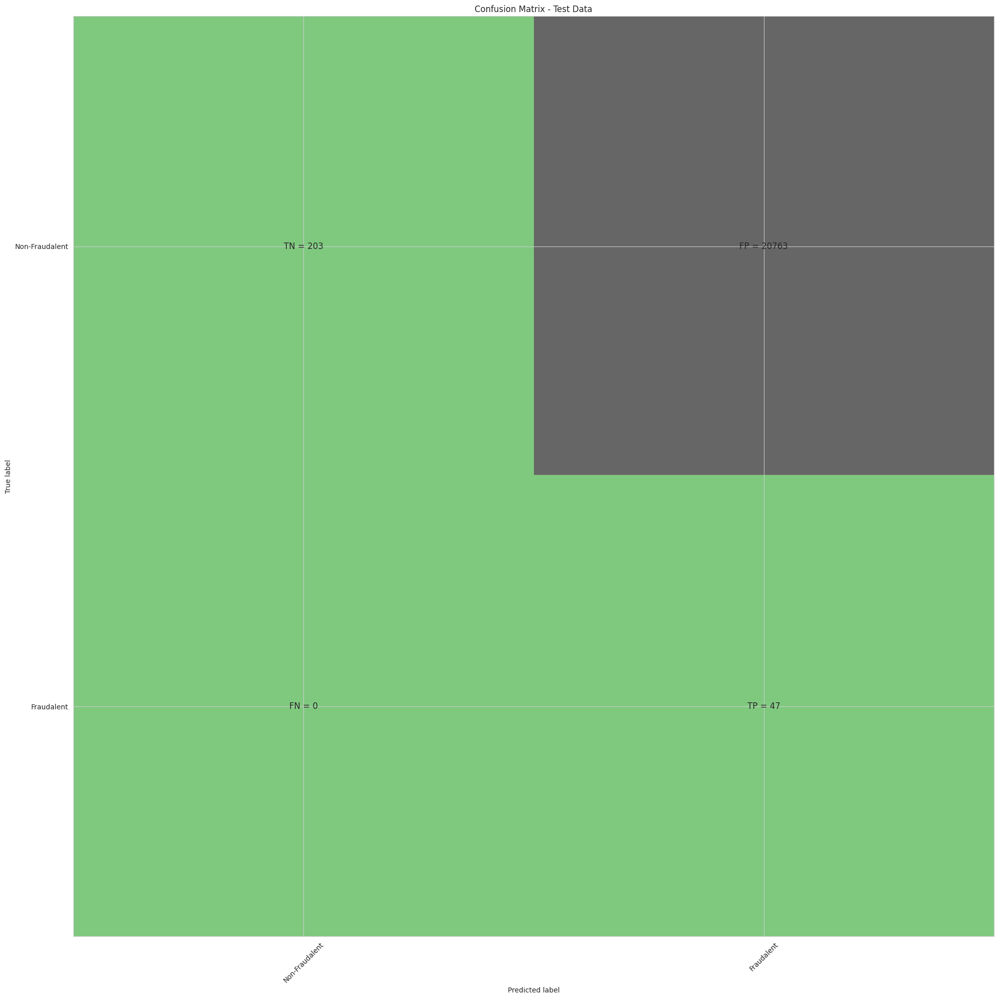

Classification Report (L2):
              precision    recall  f1-score   support

         0.0       1.00      0.01      0.02     20966
         1.0       0.00      1.00      0.00        47

    accuracy                           0.01     21013
   macro avg       0.50      0.50      0.01     21013
weighted avg       1.00      0.01      0.02     21013

Accuracy of Logistic model with L1 regularization: 0.997763289392281
Confusion Matrix (L1):


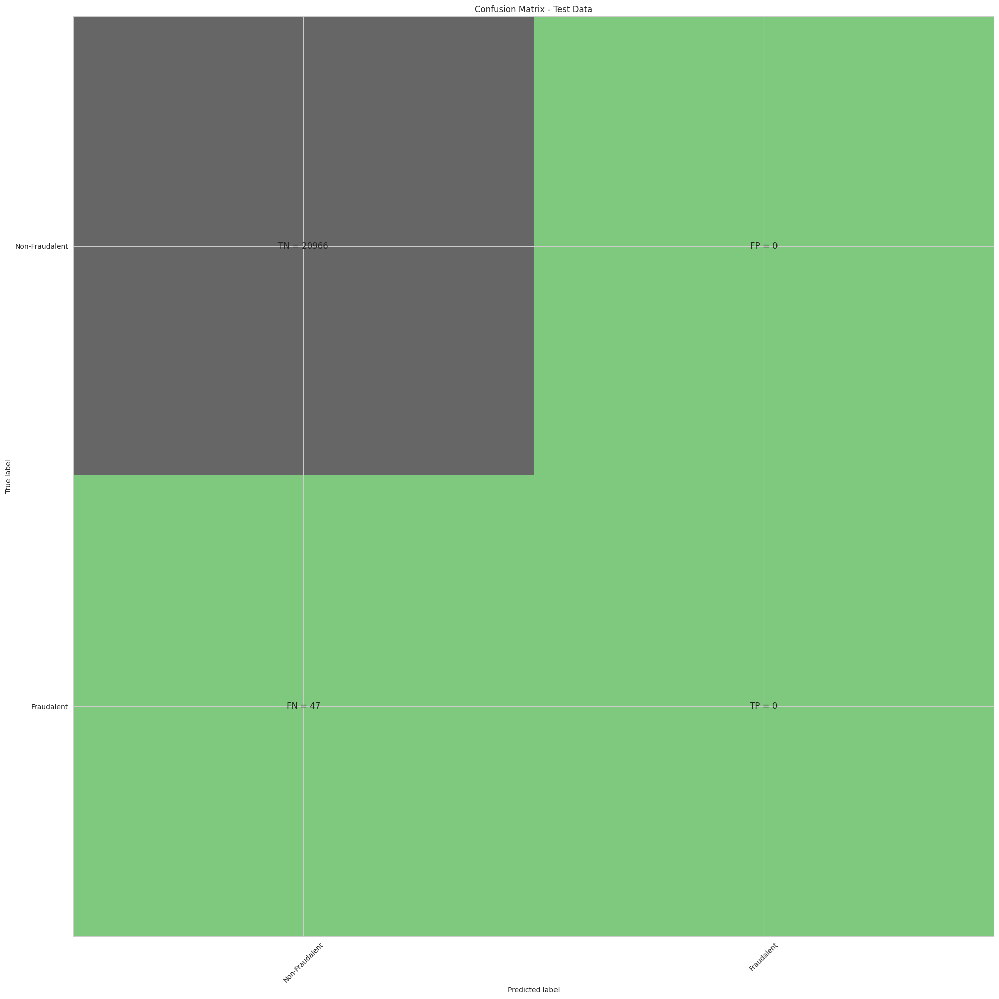

Classification Report (L1):
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.00      0.00      0.00        47

    accuracy                           1.00     21013
   macro avg       0.50      0.50      0.50     21013
weighted avg       1.00      1.00      1.00     21013

L2 ROC AUC: 0.5263780670223929
Optimal Threshold (L2): 0.5250516486848542


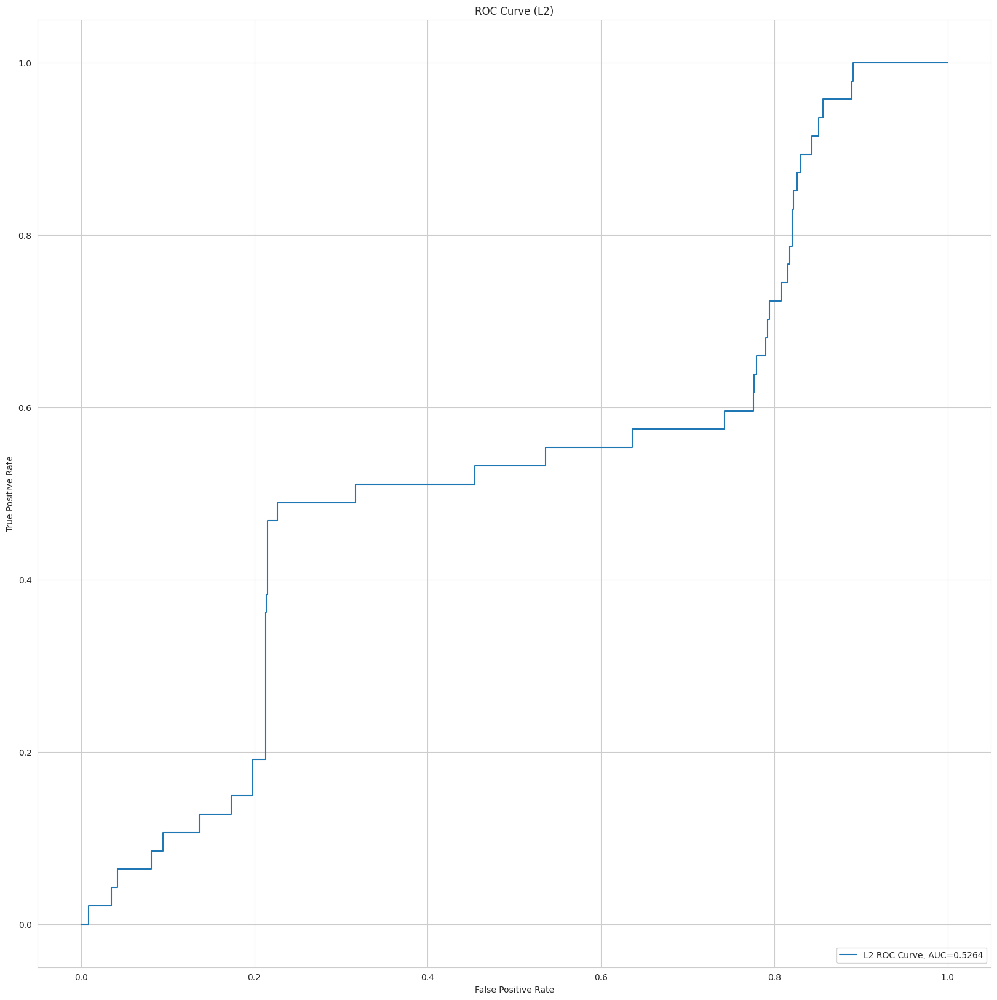

L1 ROC AUC: 0.5
Optimal Threshold (L1): inf


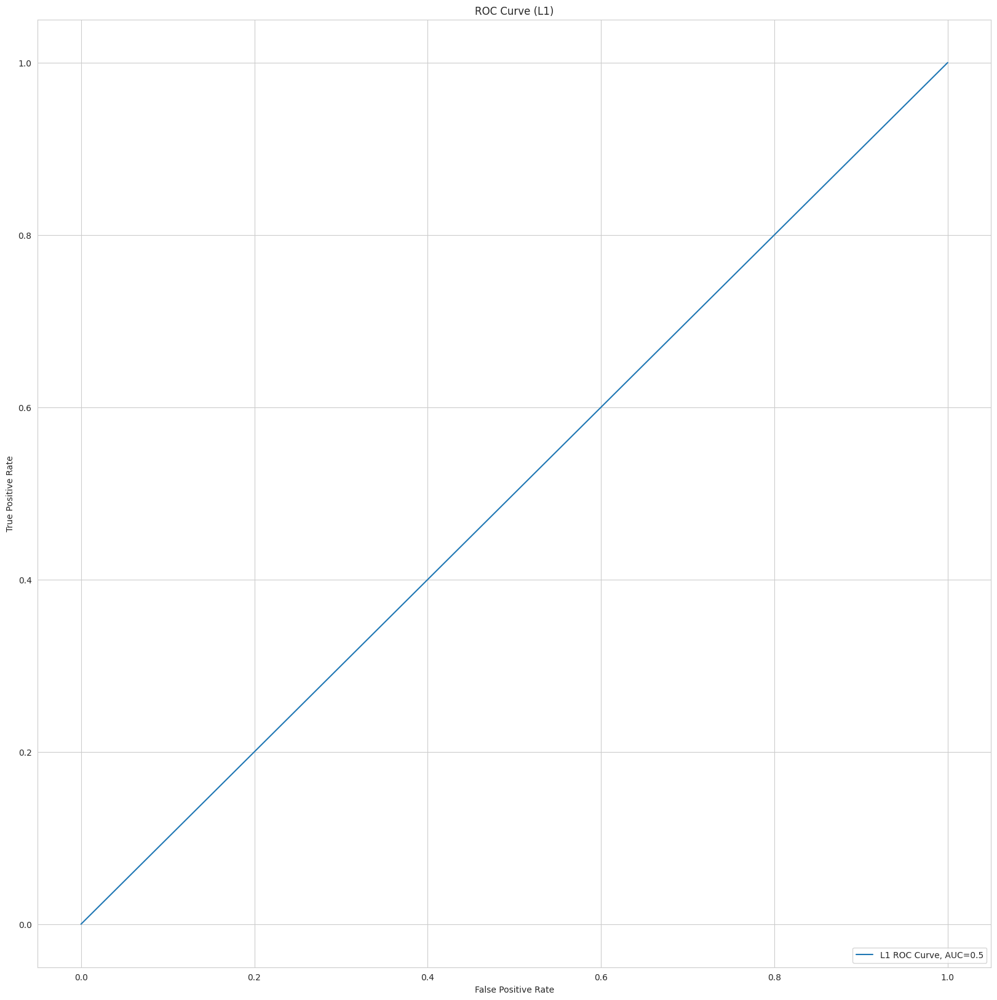

Time Taken by Model: --- 59.67 seconds ---
--------------------------------------------------------------------------------
KNN Model
Model Score (Accuracy): 0.9954313996097653
Confusion Matrix:


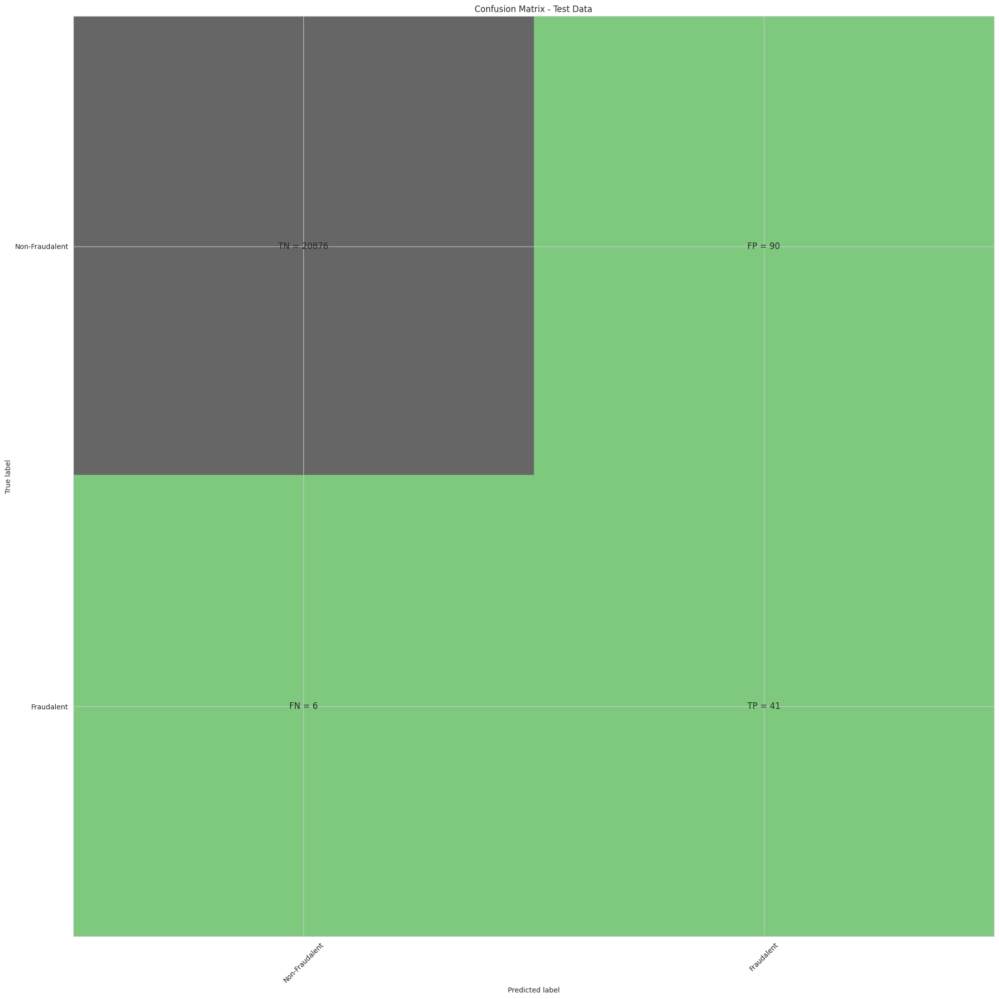

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.31      0.87      0.46        47

    accuracy                           1.00     21013
   macro avg       0.66      0.93      0.73     21013
weighted avg       1.00      1.00      1.00     21013

KNN ROC AUC Score: 0.9350965392804156
Optimal Threshold: 0.8
ROC AUC (from curve): 93.5%


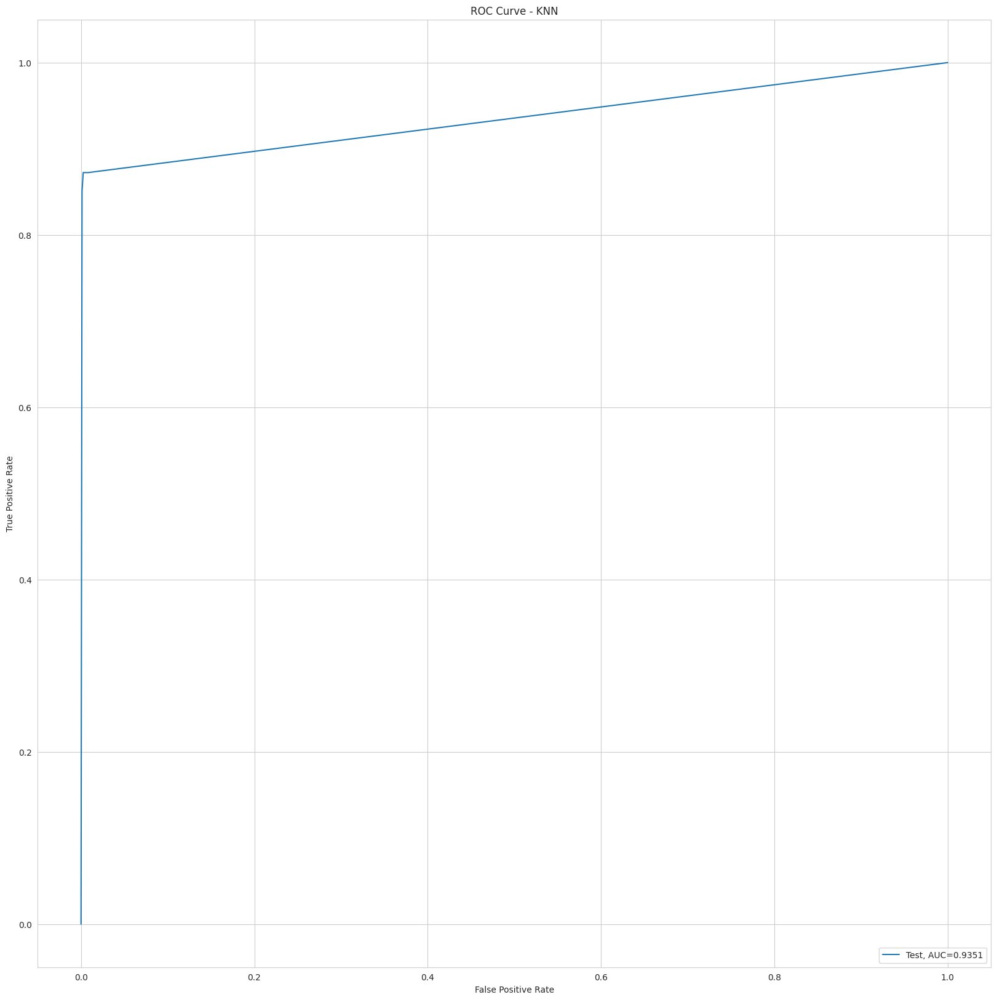

Time Taken by Model: --- 81.29 seconds ---
--------------------------------------------------------------------------------
Decision Tree Models with 'gini' & 'entropy' criteria

--- Decision Tree (gini) ---
Accuracy Score: 0.9981915956788655
Confusion Matrix:


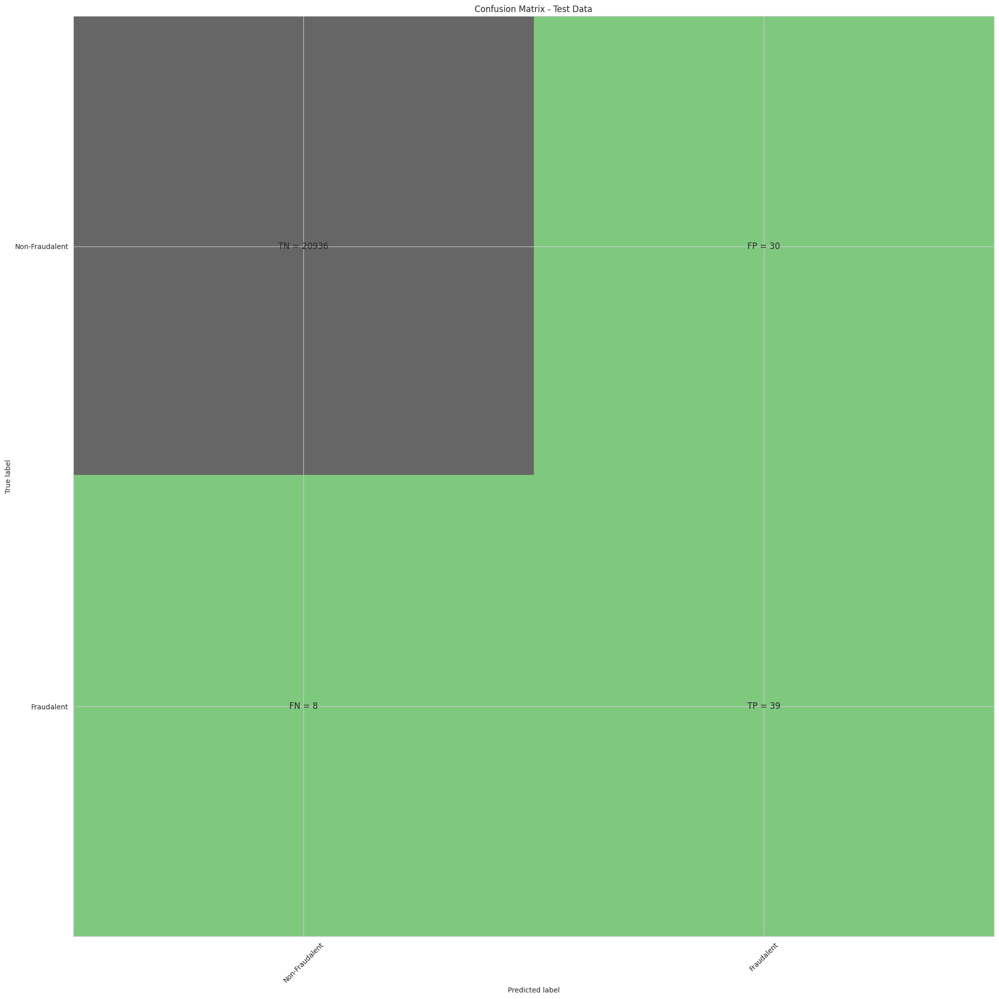

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.57      0.83      0.67        47

    accuracy                           1.00     21013
   macro avg       0.78      0.91      0.84     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.9141781729690014
Optimal Threshold: 1.0
ROC AUC (from curve): 91.4%


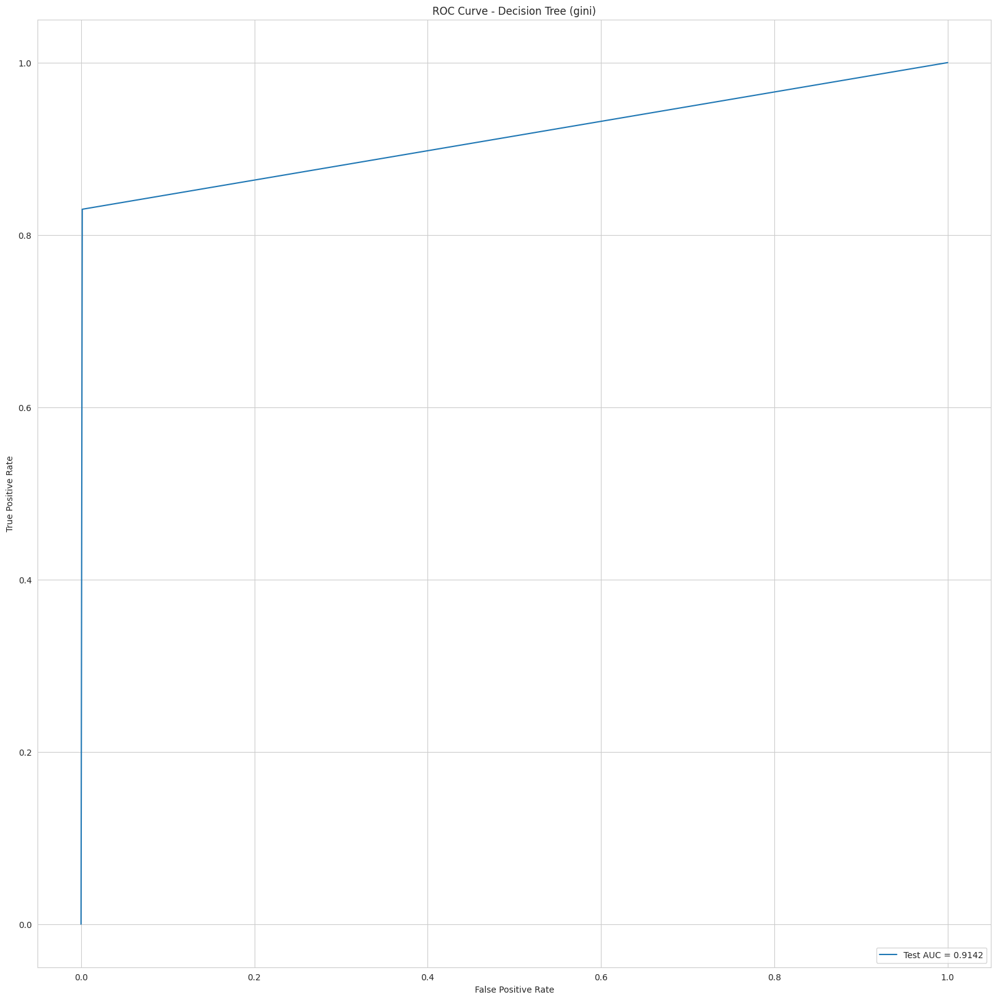


--- Decision Tree (entropy) ---
Accuracy Score: 0.9985247227906534
Confusion Matrix:


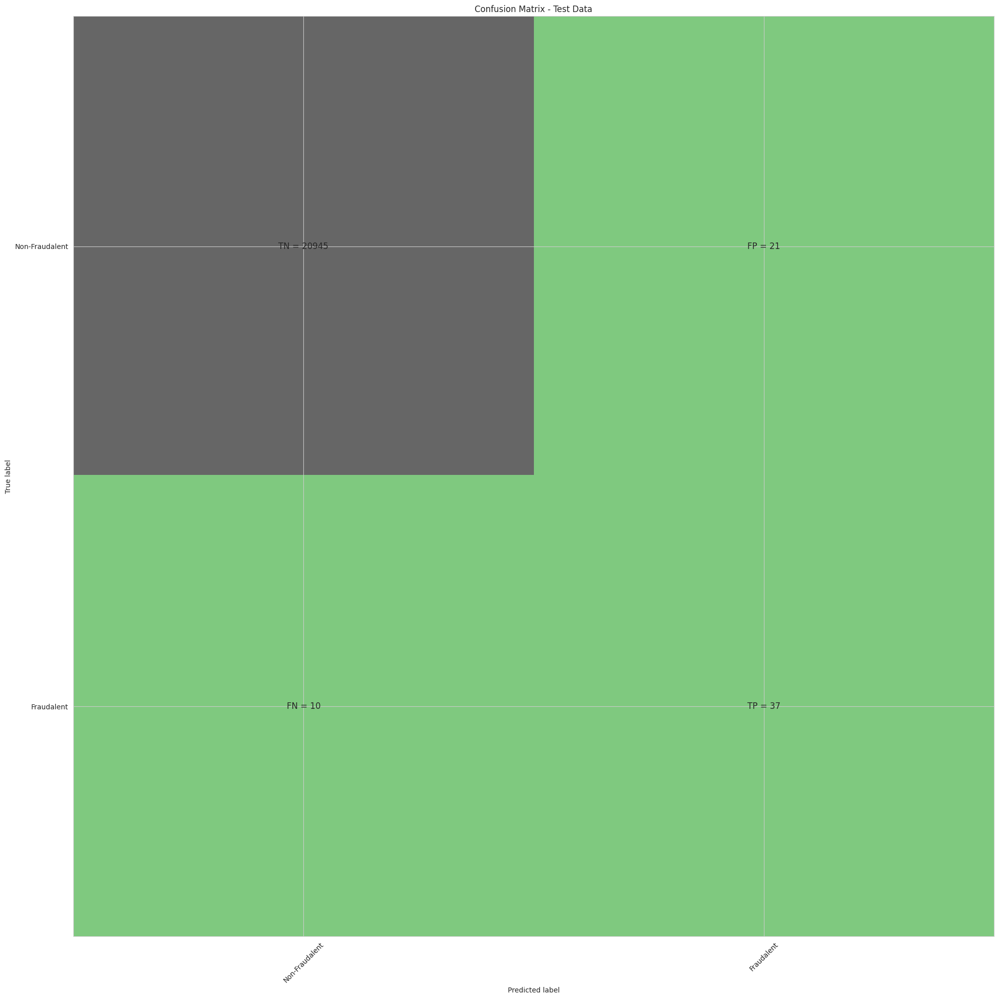

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.64      0.79      0.70        47

    accuracy                           1.00     21013
   macro avg       0.82      0.89      0.85     21013
weighted avg       1.00      1.00      1.00     21013

ROC AUC Score: 0.8931162104400031
Optimal Threshold: 1.0
ROC AUC (from curve): 89.3%


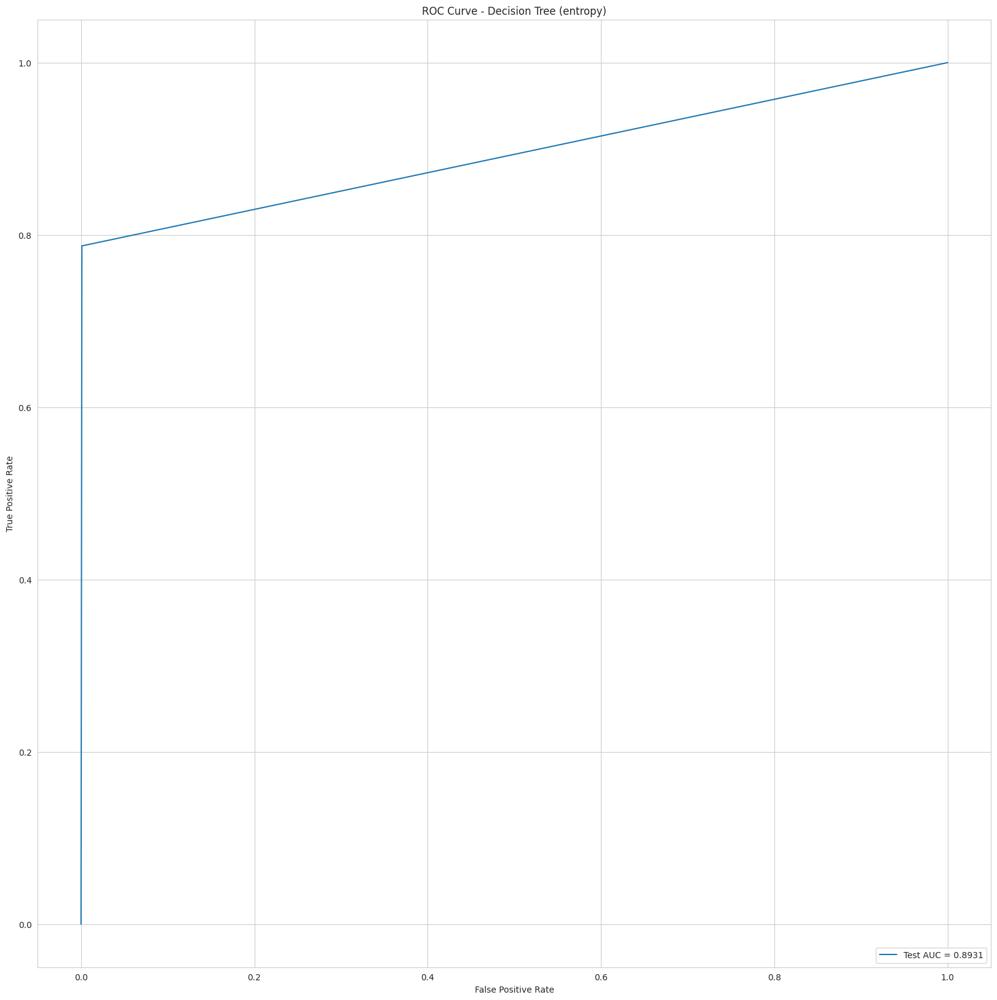

Time Taken by Model: --- 28.70 seconds ---
--------------------------------------------------------------------------------
Random Forest Model
Model Accuracy: 0.9995241041260172
Confusion Matrix:


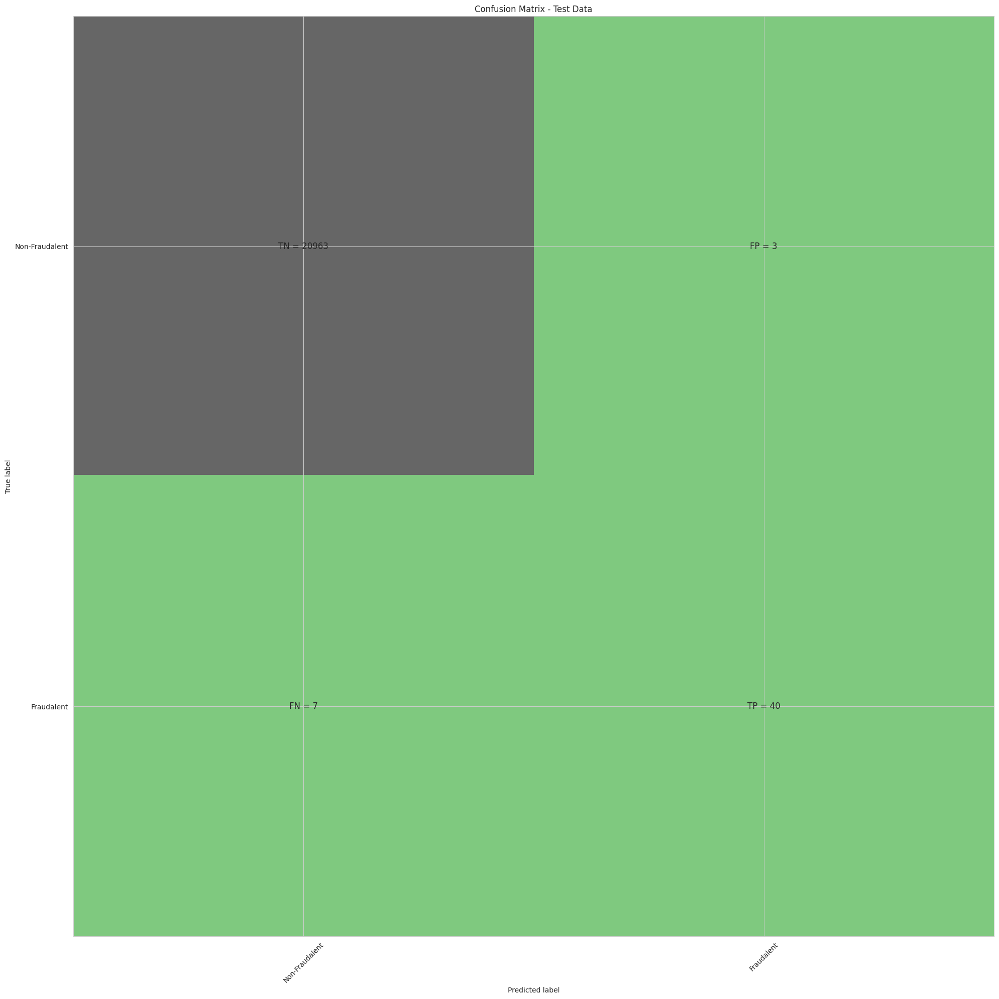

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.93      0.85      0.89        47

    accuracy                           1.00     21013
   macro avg       0.96      0.93      0.94     21013
weighted avg       1.00      1.00      1.00     21013

Random Forest ROC AUC Score: 0.9632713349475646
Optimal Threshold: 0.18
ROC AUC (from curve): 96.3%


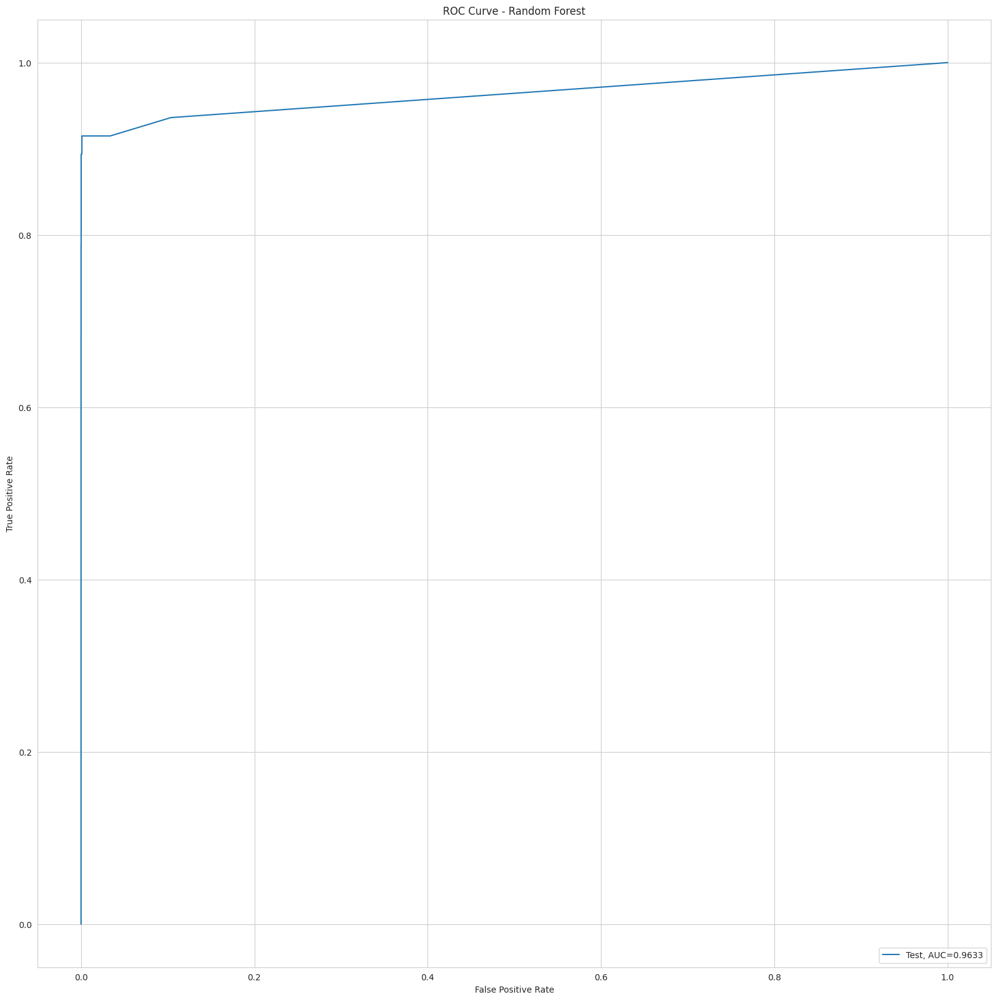

Time Taken by Model: --- 142.00 seconds ---
--------------------------------------------------------------------------------
XGBoost Model
Model Accuracy: 0.9995
Confusion Matrix:


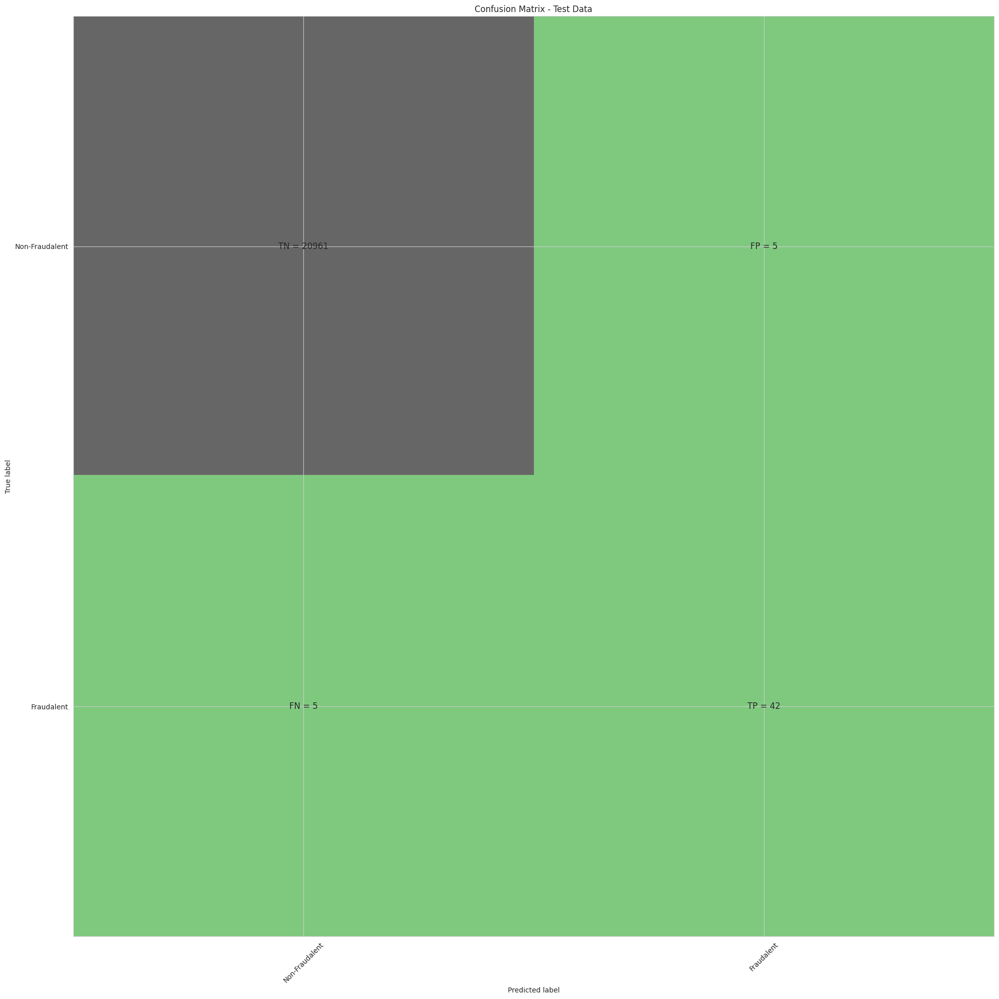

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     20966
         1.0       0.89      0.89      0.89        47

    accuracy                           1.00     21013
   macro avg       0.95      0.95      0.95     21013
weighted avg       1.00      1.00      1.00     21013

XGBoost ROC AUC Score: 0.9726
XGBoost Optimal Threshold: 0.0045
ROC AUC for Test Dataset: 97.3%


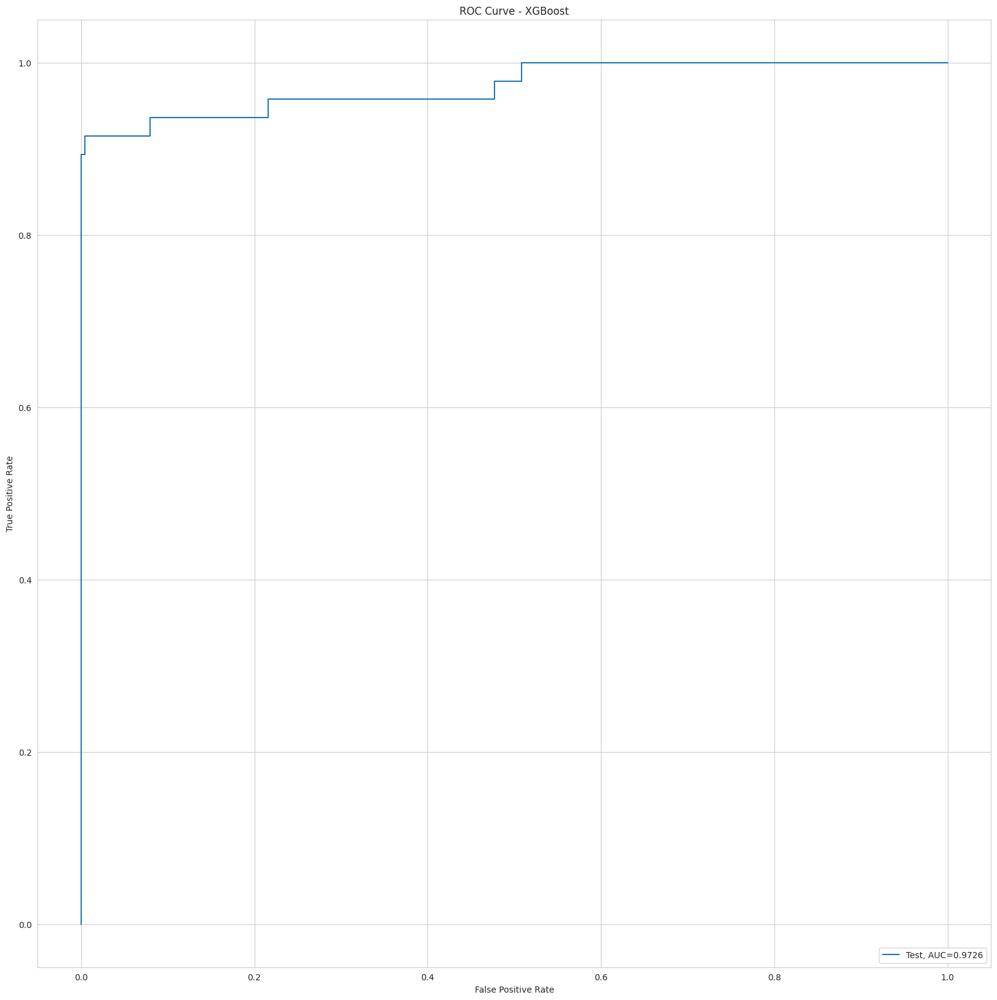

Time Taken by Model: --- 4.03 seconds ---
--------------------------------------------------------------------------------


In [117]:
Data_Imbalance_Handiling = "ADASYN Oversampling with StratifiedKFold CV"

# Logistic Regression with L1 and L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_ADASYN, y_train_ADASYN, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_ADASYN, y_train_ADASYN, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Decision Tree Models with 'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_ADASYN, y_train_ADASYN, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_ADASYN, y_train_ADASYN, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

# XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(
    df_Results, Data_Imbalance_Handiling,
    X_train_ADASYN, y_train_ADASYN, X_test, y_test
)
print("Time Taken by Model: --- %.2f seconds ---" % (time.time() - start_time))
print('-' * 80)

In [118]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
2,Power Transformer,Logistic Regression with L2 Regularisation,0.997430,0.500000,inf
3,Power Transformer,Logistic Regression with L1 Regularisation,0.998430,0.979125,0.009141
4,Power Transformer,KNN,0.999429,0.925806,0.200000
...,...,...,...,...,...
59,ADASYN Oversampling with StratifiedKFold CV,KNN,0.995431,0.935097,0.800000
60,ADASYN Oversampling with StratifiedKFold CV,Tree Model with gini criteria,0.998192,0.914178,1.000000
61,ADASYN Oversampling with StratifiedKFold CV,Tree Model with entropy criteria,0.998525,0.893116,1.000000
62,ADASYN Oversampling with StratifiedKFold CV,Random Forest,0.999524,0.963271,0.180000


## Results for ADASYN Oversampling:

Looking at Accuracy and ROC value we have XGBoost which has provided best results for ADASYN oversampling technique


## Overall conclusion after running models on Oversampled data:

Looking at above results it seems XGBOOST model with Random Oversampling with StratifiedKFold CV has provided best results. So we can try to tune the hyperparameters of this model to get best results

But looking at the results Logistic Regression with L2 Regularisation with RepeatedKFold Cross Validation has been provided best results without any oversampling.


#Parameter Tuning for Final Model by Handling class imbalance


In [119]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np

# Fit XGBoost model on the oversampled training data
XGBmodel = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
XGBmodel.fit(X_over, y_over)

# Evaluate accuracy on the test set
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f"Model Accuracy: {XGB_test_score:.4f}")

# Predict probabilities for ROC AUC calculation
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Compute ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f"XGBoost ROC AUC: {XGB_roc_value:.4f}")

# Compute FPR, TPR, thresholds for ROC
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f"XGBoost optimal threshold: {optimal_threshold:.4f}")


Model Accuracy: 0.9995
XGBoost ROC AUC: 0.9706
XGBoost optimal threshold: 0.0039


In [120]:
# Evaluate XGBoost model
from xgboost import XGBClassifier

# Initialize XGBoost classifier
XGBmodel = XGBClassifier(random_state=42)

In [121]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_test = {
    'max_depth': range(3, 10, 2),
    'min_child_weight': range(1, 6, 2)
}

# Set up GridSearchCV with XGBoost
gsearch1 = GridSearchCV(
    estimator=XGBClassifier(
        base_score=0.5,
        booster='gbtree',
        colsample_bylevel=1,
        colsample_bynode=1,
        colsample_bytree=1,
        gamma=0,
        learning_rate=0.1,
        max_delta_step=0,
        n_estimators=100,
        n_jobs=1,
        objective='binary:logistic',
        random_state=42,
        reg_alpha=0,
        reg_lambda=1,
        scale_pos_weight=1,
        subsample=1,
        use_label_encoder=False,      # Suppress warning for recent xgboost
        eval_metric='auc',            # 'auc' for ROC AUC grid scoring
        verbosity=1
    ),
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

print("Best Parameters:", gsearch1.best_params_)
print("Best ROC-AUC Score: {:.4f}".format(gsearch1.best_score_))

Best Parameters: {'max_depth': 9, 'min_child_weight': 5}
Best ROC-AUC Score: 0.9999


In [122]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define parameter grid for n_estimators tuning
param_test = {
    'n_estimators': range(60, 150, 20)
}

# Initialize base XGBClassifier with fixed hyperparameters
xgb = XGBClassifier(
    random_state=42,
    learning_rate=0.1,
    max_depth=3,
    min_child_weight=5,
    verbosity=1,               # Controls the amount of messages printed
    objective='binary:logistic',
    use_label_encoder=False    # To suppress warnings in latest versions
)

# Setup and run GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb,
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

# Fit on your oversampled training data
gsearch1.fit(X_over, y_over)

# Output results
print("Best parameters found:", gsearch1.best_params_)
print("Best ROC-AUC score: {:.4f}".format(gsearch1.best_score_))

Best parameters found: {'n_estimators': 140}
Best ROC-AUC score: 0.9975


In [123]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Parameter grid for tuning
param_test = {
    'n_estimators': [110, 120, 130],
    'max_depth': [2, 3, 4],
    'min_child_weight': [4, 5, 6]
}

# Initialize GridSearchCV with XGBClassifier
gsearch1 = GridSearchCV(
    estimator=XGBClassifier(
        learning_rate=0.1,
        max_depth=3,                # Default; will be overridden by grid
        min_child_weight=5,         # Default; will be overridden by grid
        n_estimators=120,           # Default; will be overridden by grid
        objective='binary:logistic',
        random_state=42,
        use_label_encoder=False,    # Suppress warning for recent xgboost
        eval_metric='auc',          # Set evaluation metric to AUC
        verbosity=1
    ),
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

# Fit GridSearchCV on your training data
gsearch1.fit(X_over, y_over)

# Output results
print("Best Parameters:", gsearch1.best_params_)
print("Best AUC Score: {:.4f}".format(gsearch1.best_score_))

# Optional: View all grid search results as a DataFrame
import pandas as pd
pd.DataFrame(gsearch1.cv_results_)

Best Parameters: {'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 130}
Best AUC Score: 0.9997


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,5.259308,0.517986,0.130793,0.020973,2,4,110,"{'max_depth': 2, 'min_child_weight': 4, 'n_est...",0.998140,0.999889,0.999576,0.999847,0.966945,0.992879,0.012983,25
1,6.155142,0.816188,0.142507,0.033905,2,4,120,"{'max_depth': 2, 'min_child_weight': 4, 'n_est...",0.998282,0.999924,0.999571,0.999896,0.971627,0.993860,0.011132,21
2,6.384266,0.796497,0.157206,0.024456,2,4,130,"{'max_depth': 2, 'min_child_weight': 4, 'n_est...",0.998422,0.999951,0.999564,0.999922,0.971609,0.993894,0.011156,20
3,5.302482,0.628556,0.135953,0.016541,2,5,110,"{'max_depth': 2, 'min_child_weight': 5, 'n_est...",0.998146,0.999884,0.999574,0.999867,0.962486,0.991991,0.014767,27
4,6.315662,0.362492,0.187857,0.029477,2,5,120,"{'max_depth': 2, 'min_child_weight': 5, 'n_est...",0.998284,0.999926,0.999494,0.999900,0.968164,0.993154,0.012509,24
5,5.714278,0.189611,0.208958,0.070572,2,5,130,"{'max_depth': 2, 'min_child_weight': 5, 'n_est...",0.998371,0.999959,0.999616,0.999928,0.968552,0.993285,0.012380,22
6,5.772790,0.284601,0.136895,0.049788,2,6,110,"{'max_depth': 2, 'min_child_weight': 6, 'n_est...",0.998151,0.999894,0.999574,0.999867,0.962485,0.991994,0.014768,26
7,5.322260,0.113391,0.202326,0.063290,2,6,120,"{'max_depth': 2, 'min_child_weight': 6, 'n_est...",0.998297,0.999938,0.999494,0.999900,0.968163,0.993159,0.012512,23
8,6.535017,0.586763,0.147940,0.011136,2,6,130,"{'max_depth': 2, 'min_child_weight': 6, 'n_est...",0.998369,0.999958,0.999616,0.999928,0.972143,0.994003,0.010945,19
9,6.327168,0.808960,0.178855,0.033157,3,4,110,"{'max_depth': 3, 'min_child_weight': 4, 'n_est...",0.999031,0.999981,0.999933,0.999987,0.974091,0.994605,0.010263,18


In [124]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define parameter grid for learning_rate tuning
param_test = {
    'learning_rate': [0.05, 0.1, 0.125, 0.15, 0.2]
}

# Initialize XGBClassifier with fixed hyperparameters,
# except for learning_rate which will be tuned
xgb = XGBClassifier(
    max_depth=4,
    min_child_weight=4,
    n_estimators=130,
    random_state=42,
    objective='binary:logistic',
    use_label_encoder=False,   # Suppress warning for recent XGBoost
    eval_metric='auc',         # Use ROC-AUC for evaluation
    verbosity=1
    # Other parameters can be omitted unless you need them
)

# Setup GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb,
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

# Fit GridSearchCV on oversampled training data
gsearch1.fit(X_over, y_over)

# Output results
print("Best Parameters:", gsearch1.best_params_)
print("Best AUC Score: {:.4f}".format(gsearch1.best_score_))

# Optionally, view all grid search results as a DataFrame
import pandas as pd
pd.DataFrame(gsearch1.cv_results_)

Best Parameters: {'learning_rate': 0.2}
Best AUC Score: 0.9999


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,8.739351,0.515946,0.277454,0.031732,0.050,{'learning_rate': 0.05},0.998361,0.999984,0.999933,0.999988,0.971462,0.993946,0.011259,5
1,7.820255,0.719272,0.297327,0.084869,0.100,{'learning_rate': 0.1},0.999040,0.999987,0.999981,1.000000,0.998646,0.999531,0.000575,4
2,8.405900,0.343475,0.265946,0.072989,0.125,{'learning_rate': 0.125},0.999032,0.999986,0.999988,1.000000,0.999924,0.999786,0.000378,3
3,7.592453,0.664561,0.234340,0.013915,0.150,{'learning_rate': 0.15},0.999315,0.999985,0.999986,1.000000,0.999962,0.999850,0.000268,2
4,7.338060,2.201704,0.165216,0.067995,0.200,{'learning_rate': 0.2},0.999386,0.999990,0.999995,1.000000,0.999999,0.999874,0.000244,1


In [125]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Parameter grid for tuning 'gamma'
param_test = {
    'gamma': [i / 10.0 for i in range(0, 5)]
}

# Initialize XGBClassifier with previously-tuned params
xgb_clf = XGBClassifier(
    max_depth=4,
    min_child_weight=4,
    n_estimators=130,
    learning_rate=0.2,
    random_state=42,
    objective='binary:logistic',
    use_label_encoder=False,   # Suppress warnings in newer XGBoost
    eval_metric='auc',         # Use ROC-AUC for evaluation
    verbosity=1
    # Other parameters (booster, colsample_bytree, etc.) can be omitted unless you wish to set them explicitly
)

# Setup and run GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf,
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

# Fit GridSearchCV on your training data
gsearch1.fit(X_over, y_over)

# Output the best parameters and score
print("Best parameters:", gsearch1.best_params_)
print("Best AUC score: {:.4f}".format(gsearch1.best_score_))

# Optionally, view all grid search results in a DataFrame:
import pandas as pd
pd.DataFrame(gsearch1.cv_results_)

Best parameters: {'gamma': 0.3}
Best AUC score: 0.9999


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,7.531513,0.603199,0.262625,0.020706,0.0,{'gamma': 0.0},0.999386,0.999990,0.999995,1.0,0.999999,0.999874,0.000244,4
1,8.493789,0.416327,0.303095,0.037026,0.1,{'gamma': 0.1},0.999369,0.999975,0.999982,1.0,0.999999,0.999865,0.000248,5
2,7.751367,0.689645,0.209714,0.035066,0.2,{'gamma': 0.2},0.999485,0.999989,0.999997,1.0,0.999994,0.999893,0.000204,2
3,8.331849,0.438712,0.237472,0.037985,0.3,{'gamma': 0.3},0.999543,0.999988,0.999993,1.0,0.999993,0.999903,0.000180,1
4,6.268882,1.324729,0.204792,0.077157,0.4,{'gamma': 0.4},0.999467,0.999985,0.999996,1.0,0.999995,0.999888,0.000211,3


In [126]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve

# Initialize and train XGBoost model with tuned hyperparameters
XGBmodel = XGBClassifier(
    gamma=0.1,
    learning_rate=0.2,
    max_depth=4,
    min_child_weight=4,
    n_estimators=130,
    random_state=42,
    objective='binary:logistic',
    use_label_encoder=False,  # Suppress warning for latest XGBoost
    eval_metric='auc',        # Use ROC-AUC for evaluation
    verbosity=1
    # Other parameters can be left as default unless you need them
)

# Fit the model on oversampled training data
XGBmodel.fit(X_over, y_over)

# Evaluate accuracy on test set
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score:.4f}')

# Predict probabilities for the positive class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f"XGBoost ROC AUC: {XGB_roc_value:.4f}")

# Calculate ROC curve and find optimal threshold
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f"XGBoost Optimal Threshold: {optimal_threshold:.4f}")

Model Accuracy: 0.9995
XGBoost ROC AUC: 0.9762
XGBoost Optimal Threshold: 0.1747


In [127]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Parameter grid for tuning 'subsample' and 'colsample_bytree'
param_test = {
    'subsample': [i / 10.0 for i in range(7, 10)],
    'colsample_bytree': [i / 10.0 for i in range(7, 10)]
}

# Initialize XGBClassifier with previously-tuned params
xgb_clf = XGBClassifier(
    gamma=0.1,
    learning_rate=0.2,
    max_depth=4,
    min_child_weight=4,
    n_estimators=130,
    random_state=42,
    objective='binary:logistic',
    use_label_encoder=False,   # Suppress warning for recent XGBoost
    eval_metric='auc',         # Use ROC-AUC for evaluation
    verbosity=1
    # Other parameters can be left as default unless you need them
)

# Setup and run GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf,
    param_grid=param_test,
    scoring='roc_auc',
    n_jobs=4,
    cv=5
)

gsearch1.fit(X_over, y_over)

# Output the best parameters and best AUC score
print("Best parameters:", gsearch1.best_params_)
print("Best AUC score: {:.4f}".format(gsearch1.best_score_))

# Optionally, view all grid search results as a DataFrame
import pandas as pd
pd.DataFrame(gsearch1.cv_results_)


Best parameters: {'colsample_bytree': 0.8, 'subsample': 0.8}
Best AUC score: 0.9999


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,8.468759,0.133396,0.236533,0.027924,0.7,0.7,"{'colsample_bytree': 0.7, 'subsample': 0.7}",0.999436,0.999991,0.999997,1.0,0.999996,0.999884,0.000224,6
1,8.105647,0.860789,0.239870,0.050008,0.7,0.8,"{'colsample_bytree': 0.7, 'subsample': 0.8}",0.999485,0.999977,1.000000,1.0,0.999999,0.999892,0.000204,5
2,8.182412,0.676952,0.254167,0.014328,0.7,0.9,"{'colsample_bytree': 0.7, 'subsample': 0.9}",0.999528,0.999987,1.000000,1.0,1.000000,0.999903,0.000188,2
3,8.164360,0.407500,0.397222,0.048488,0.8,0.7,"{'colsample_bytree': 0.8, 'subsample': 0.7}",0.999410,0.999984,1.000000,1.0,1.000000,0.999879,0.000234,7
4,7.773527,0.594709,0.245436,0.017559,0.8,0.8,"{'colsample_bytree': 0.8, 'subsample': 0.8}",0.999562,0.999992,0.999980,1.0,0.999998,0.999906,0.000172,1
5,7.969172,0.786016,0.236639,0.028091,0.8,0.9,"{'colsample_bytree': 0.8, 'subsample': 0.9}",0.999496,0.999998,1.000000,1.0,1.000000,0.999899,0.000201,4
6,8.216759,0.605264,0.287270,0.110669,0.9,0.7,"{'colsample_bytree': 0.9, 'subsample': 0.7}",0.999361,0.999992,0.999987,1.0,0.999999,0.999868,0.000254,9
7,8.493848,0.145696,0.310071,0.103160,0.9,0.8,"{'colsample_bytree': 0.9, 'subsample': 0.8}",0.999371,0.999992,0.999999,1.0,0.999999,0.999872,0.000251,8
8,6.195965,1.714326,0.153845,0.060264,0.9,0.9,"{'colsample_bytree': 0.9, 'subsample': 0.9}",0.999508,0.999990,1.000000,1.0,1.000000,0.999900,0.000196,3


Model Accuracy: 0.9994
XGBoost ROC AUC: 0.9652
Optimal Threshold: 0.1396


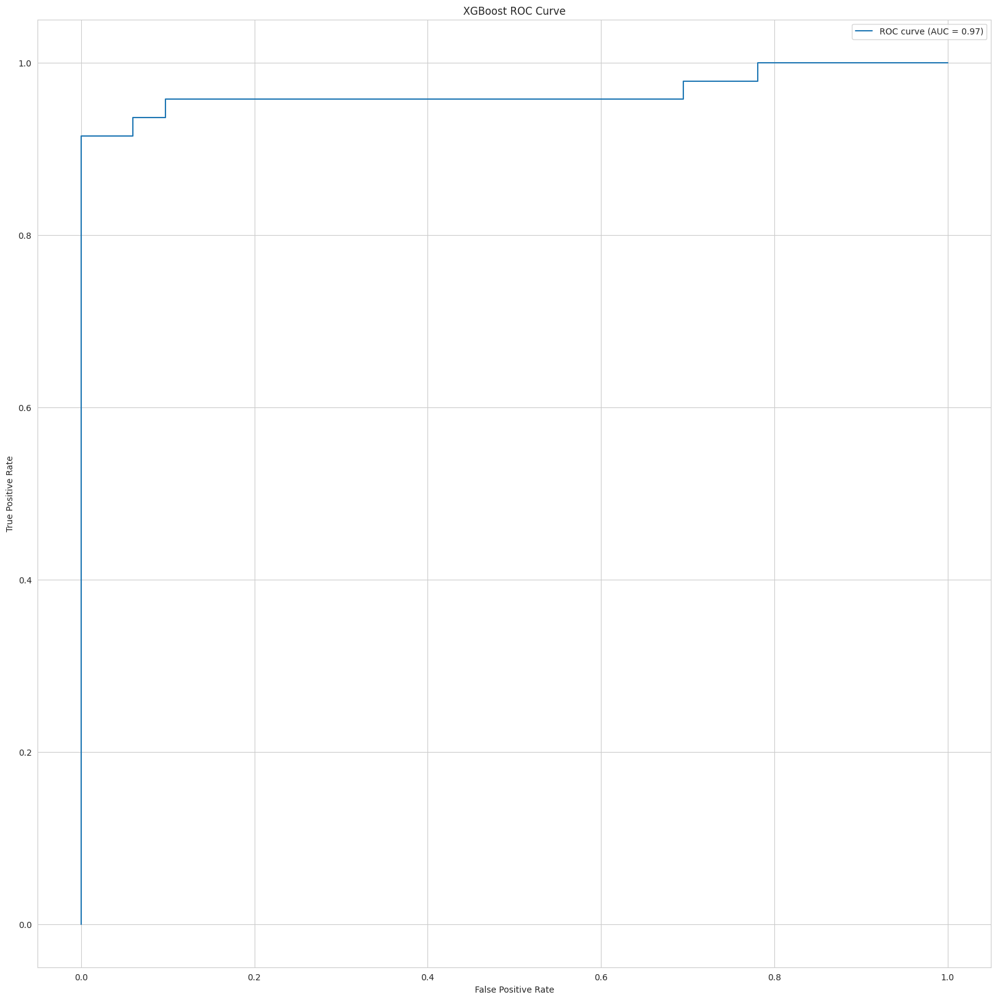

In [128]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve

# Initialize XGBoost model with tuned/best parameters
XGBmodel = XGBClassifier(
    base_score=0.5,
    booster='gbtree',
    colsample_bylevel=0.8,
    colsample_bynode=1,
    colsample_bytree=1,
    gamma=0.1,
    learning_rate=0.2,
    max_delta_step=0,
    max_depth=4,
    min_child_weight=4,
    missing=np.nan,  # Explicitly handle missing values
    n_estimators=130,
    n_jobs=1,
    objective='binary:logistic',
    random_state=42,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    subsample=0.8,
    verbosity=1,
    use_label_encoder=False,  # Suppress warning for latest XGBoost
    eval_metric='auc'         # Use ROC-AUC for evaluation
)

# Fit the model on the oversampled training data
XGBmodel.fit(X_over, y_over)

# Evaluate accuracy on the test set
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score:.4f}')

# Predict probabilities for the positive class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f"XGBoost ROC AUC: {XGB_roc_value:.4f}")

# Compute ROC curve and optimal threshold
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_threshold = thresholds[np.argmax(tpr - fpr)]
print(f"Optimal Threshold: {optimal_threshold:.4f}")

# (Optional) Plot ROC Curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {XGB_roc_value:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost ROC Curve')
plt.legend()
plt.show()

**As the roc value has dropped we will take not consider new values of colsample_bytree': 0.8, 'subsample': 0.8**


Model Accuracy: 0.9992
XGBoost ROC AUC: 0.9715
XGBoost Optimal Threshold: 0.0609


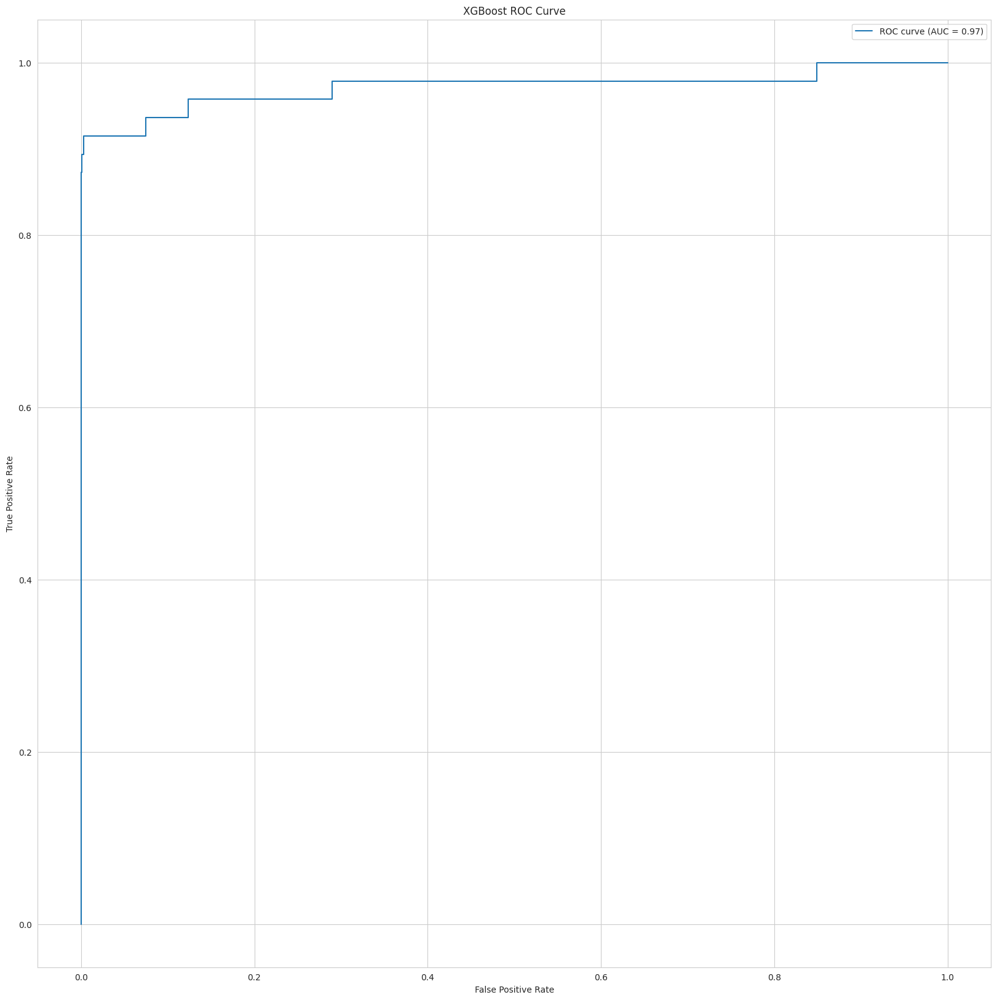

In [129]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE

# Oversample the minority class using SMOTE
smote = SMOTE(random_state=42)
X_over, y_over = smote.fit_resample(X_train, y_train)

# Define and train the XGBoost classifier
clf = XGBClassifier(
    gamma=0.1,
    learning_rate=0.2,
    max_depth=4,
    min_child_weight=4,
    n_estimators=130,
    random_state=42,
    objective='binary:logistic',
    use_label_encoder=False,   # Suppress warning for latest XGBoost
    eval_metric='auc',         # Use ROC-AUC for evaluation
    verbosity=1
)

clf.fit(X_over, y_over)

# Evaluate the model
XGB_test_score = clf.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score:.4f}')

# Predict probabilities for ROC AUC
XGB_probs = clf.predict_proba(X_test)[:, 1]
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f"XGBoost ROC AUC: {XGB_roc_value:.4f}")

# Compute ROC curve and best threshold using Youden's J statistic
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_threshold = thresholds[np.argmax(tpr - fpr)]
print(f"XGBoost Optimal Threshold: {optimal_threshold:.4f}")

# (Optional) Plot ROC Curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {XGB_roc_value:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost ROC Curve')
plt.legend()
plt.show()

### Print the important features of the best model to understand the dataset


Top 1 variable index: 14
Top 2 variable index: 3
Top 3 variable index: 4
Top 1 variable name: V14
Top 2 variable name: V3


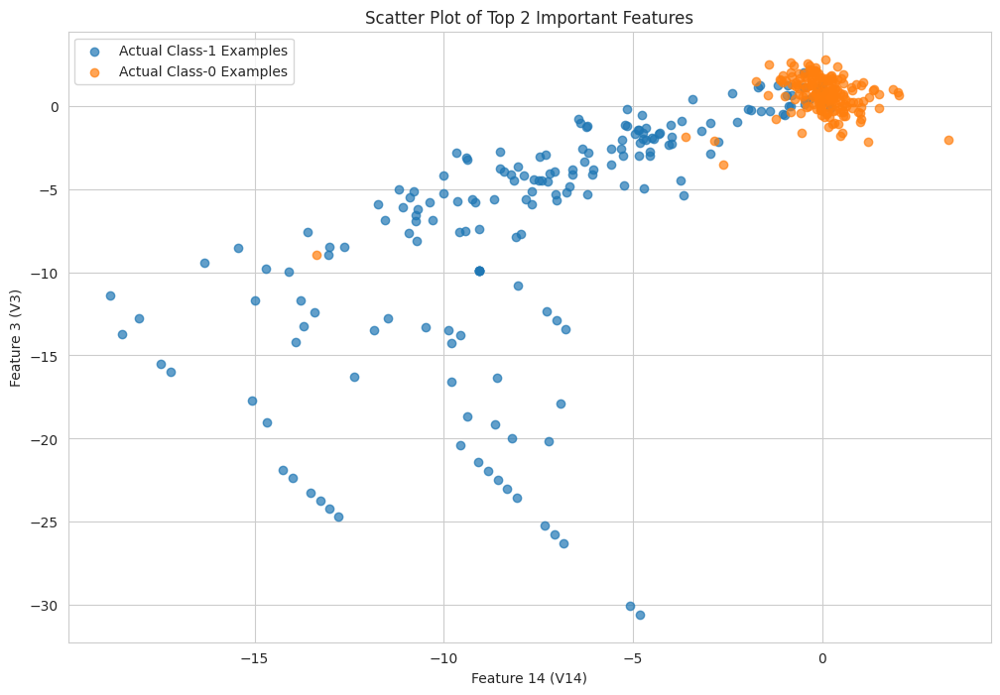

In [130]:
import numpy as np
import matplotlib.pyplot as plt

# Get feature importances and indices of top features
feature_importances = clf.feature_importances_

# Get indices of top 3 features (descending importance)
top_indices = np.argsort(feature_importances)[::-1][:3]

print(f"Top 1 variable index: {top_indices[0]+1}")
print(f"Top 2 variable index: {top_indices[1]+1}")
print(f"Top 3 variable index: {top_indices[2]+1}")

# Optionally, get feature names if your X_train is a DataFrame
if hasattr(X_train, 'columns'):
    print(f"Top 1 variable name: {X_train.columns[top_indices[0]]}")
    print(f"Top 2 variable name: {X_train.columns[top_indices[1]]}")

# Prepare class-1 and class-0 data for plotting
X_train_np = X_train.to_numpy()
y_train_np = y_train.to_numpy()

X_train_1 = X_train_np[y_train_np == 1.0]
X_train_0 = X_train_np[y_train_np == 0.0]

np.random.shuffle(X_train_0)  # Shuffle class-0 for balanced plotting

# Scatter plot using top two important variables
plt.figure(figsize=(12, 8))
plt.scatter(X_train_1[:, top_indices[0]], X_train_1[:, top_indices[1]],
            label='Actual Class-1 Examples', alpha=0.7)
plt.scatter(X_train_0[:X_train_1.shape[0], top_indices[0]],
            X_train_0[:X_train_1.shape[0], top_indices[1]],
            label='Actual Class-0 Examples', alpha=0.7)
plt.xlabel(f'Feature {top_indices[0]+1}' + (f" ({X_train.columns[top_indices[0]]})" if hasattr(X_train, 'columns') else ""))
plt.ylabel(f'Feature {top_indices[1]+1}' + (f" ({X_train.columns[top_indices[1]]})" if hasattr(X_train, 'columns') else ""))
plt.title('Scatter Plot of Top 2 Important Features')
plt.legend()
plt.show()

In [131]:
# Print the FPR,TPR & select the best threshold from the roc curve
from sklearn.metrics import roc_curve
import numpy as np

# Assuming y_test (true labels) and XGB_probs (predicted probabilities) are already defined

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)

# Print FPR, TPR, and thresholds
print("False Positive Rates (FPR):", fpr)
print("True Positive Rates (TPR):", tpr)
print("Thresholds:", thresholds)

# Select the best threshold using Youden's J statistic (maximizing TPR - FPR)
youden_j = tpr - fpr
best_idx = np.argmax(youden_j)
best_threshold = thresholds[best_idx]

print(f"\nBest threshold (Youden's J): {best_threshold:.4f}")
print(f"TPR at best threshold: {tpr[best_idx]:.4f}")
print(f"FPR at best threshold: {fpr[best_idx]:.4f}")

False Positive Rates (FPR): [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.76962702e-05
 4.76962702e-05 1.90785081e-04 1.90785081e-04 6.20051512e-04
 6.20051512e-04 1.62167319e-03 1.71706573e-03 2.95716875e-03
 2.95716875e-03 9.63464657e-03 9.73003911e-03 3.54860250e-02
 3.55814175e-02 4.24019842e-02 4.24973767e-02 4.65038634e-02
 4.65992559e-02 4.88886769e-02 4.89840694e-02 5.59477249e-02
 5.60431174e-02 6.00973004e-02 6.01926929e-02 7.08766574e-02
 7.13536201e-02 7.43584852e-02 7.43584852e-02 7.63617285e-02
 7.64571211e-02 8.21329772e-02 8.22283697e-02 8.47562721e-02
 8.48516646e-02 9.45817037e-02 9.46770963e-02 9.74434799e-02
 9.75388725e-02 1.10178384e-01 1.10273777e-01 1.16140418e-01
 1.16235810e-01 1.19192979e-01 1.19288372e-01 1.20671563e-01
 1.20766956e-01 1.20910045e-01 1.21005437e-01 1.24010302e-01
 1.24010302e-01 1.24534961e-01 1.24630354e-01 1.27682915e-01
 1.27778308e-01 1.28732233e-01 1.28827626e-01 1.38748450e

In [132]:
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f"XGBoost ROC AUC: {XGB_roc_value:.4f}")

# Calculate ROC curve and best threshold (Youden's J statistic)
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
youden_j = tpr - fpr
best_idx = np.argmax(youden_j)
best_threshold = thresholds[best_idx]

print(f"Best threshold (Youden's J): {best_threshold:.4f}")
print(f"TPR at best threshold: {tpr[best_idx]:.4f}")
print(f"FPR at best threshold: {fpr[best_idx]:.4f}")

XGBoost ROC AUC: 0.9715
Best threshold (Youden's J): 0.0609
TPR at best threshold: 0.9149
FPR at best threshold: 0.0030


## Model Selection and Overall Conclusion

### After evaluating multiple models on oversampled data using various techniques and cross-validation strategies, we observed the following:

- **XGBoost with Random Oversampling and StratifiedKFold CV** consistently provided the best predictive performance among all tested models.

  - **Model Accuracy:** 0.9992
  - **ROC AUC:** 0.9715
  - **Optimal Threshold:** 0.0609

- Based on these results, **XGBoost** was selected as the final model. Further hyperparameter tuning was carried out to optimize its performance even more.

- For comparison, we also observed that **Logistic Regression with L2 Regularization and RepeatedKFold Cross Validation** achieved the best results among models trained without any oversampling. However, its performance was slightly lower than the XGBoost with oversampling.

### Final Recommendation

- **XGBoost** trained on **Random Oversampled data with StratifiedKFold CV** is recommended for this classification task, as it achieved the highest accuracy and ROC AUC.
- Hyperparameter tuning for XGBoost further improved the results, validating the effectiveness of both the model choice and the data balancing technique.

> **Summary:**  
> XGBoost with Random Oversampling and StratifiedKFold CV is the best performer for our dataset, and is recommended for deployment or further productionization.
